# Necessary Imports

In [ ]:
pip install deep_translator

In [ ]:
pip install tomotopy

In [ ]:
pip install shap

In [ ]:
pip install transformers datasets

In [ ]:
pip install swifter

In [ ]:
pip install tensorflow

In [ ]:
pip install wordcloud

In [ ]:
pip install spacy

In [ ]:
import pandas as pd
import seaborn as sns
import re, string
import math
import spacy
from statistics import mean
from statistics import mean, stdev
import matplotlib.pyplot as plt
import numpy as np

from deep_translator import GoogleTranslator

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import nltk
nltk.download('sentiwordnet')
from nltk.corpus import wordnet as wn
from nltk.corpus import wordnet
nltk.download('wordnet')
from nltk.corpus import sentiwordnet as swn
from nltk.corpus import stopwords
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')
nltk.download('omw-1.4')
from nltk.stem import WordNetLemmatizer
from nltk.metrics import *
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')

import tensorflow 
from tensorflow import keras
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping 
from tensorflow.keras.utils import to_categorical
from keras.layers import BatchNormalization
from keras.models import load_model
from sklearn.ensemble import StackingClassifier

from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score,confusion_matrix,mean_squared_error
from sklearn.linear_model import LogisticRegression,RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis,QuadraticDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import Lasso
from sklearn.ensemble import BaggingClassifier

import gensim
from gensim import corpora, models
from gensim.models import Word2Vec

import tomotopy as tp

from sklearn.manifold import TSNE

import shap

from transformers import pipeline
classifier = pipeline("sentiment-analysis")

from collections import Counter

import swifter

import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})

import warnings
warnings.filterwarnings("ignore")



In [ ]:
month_convertion={
    "janvier":"1",
    "février":"2",
    "mars":"3",
    "avril":"4",
    "mai":"5",
    "juin":"6",
    "juillet":"7",
    "août":"8",
    "septembre":"9",
    "octobre":"10",
    "novembre":"11",
    "décembre":"12",  
}

# Loading of the data

## Traduction of the reviews from French to English

In [ ]:
#train=pd.read_csv("https://drive.google.com/uc?id=1r3ZwNtY1f7lWrYKgC-hk0GJCcoxSuTej",sep=";")
#train["review"]=""
#count=0
#for index,row in train.iterrows():
#    if (index>3508) and (index<23807):
#        train.at[index, 'review']=GoogleTranslator(source='fr',target='en').translate(str(train.at[index,'avis'])[:4998]) if len(str(train.at[index,'avis'])) >0 else None
#        if count%100==1:
#            print(count)
#    count+=1
#train.to_csv("train.csv",index=False,sep=";", encoding="utf-8")


#test=pd.read_csv("https://drive.google.com/uc?id=1qsapCTYbmWFQdBWOCsXdwVlvU1-gOYHn", sep=";")
#test["review"]=""
#count=0
#for index,row in test.iterrows():
#    if (index>3508) and (index<23807):
#        test.at[index, 'review']=GoogleTranslator(source='fr',target='en').translate(str(test.at[index,'avis'])[:4998]) if len(str(test.at[index,'avis'])) >0 else None
#        if count%100==1:
#            print(count)
#    count+=1
#test.to_csv("test.csv",index=False, sep=";",encoding="utf-8")

## Data transformation

In [ ]:
train=pd.read_csv("train.csv",sep=";")
train=train.rename(columns={"avis":"french_text","review":"english_text"})
train['english_text'] = train['english_text'].astype(str)
train['french_text'] = train['french_text'].astype(str)
df=train.copy()

test=pd.read_csv("test.csv",sep=";")
test=test.rename(columns={"avis":"french_text","review":"english_text"})
test['english_text'] = test['english_text'].astype(str)
test['french_text'] = test['french_text'].astype(str)

In [ ]:
df.head()

,date,note,auteur,french_text,assureur,produit,english_text
0,06 septem...,5,brahim--k-131532,"Meilleurs assurances, prix, solutions, écoute,...",Direct Assurance,auto,"Best insurance, prices, solutions, listening, ..."
1,03 mai 20...,4,bernard-g-112497,"je suis globalement satisfait , sauf que vous ...",Direct Assurance,auto,"I am generally satisfied, except that you have..."
2,21 mars 2...,5,virginie-t-107352,Prix tres abordable plusieurs options s'offren...,Direct Assurance,auto,"Very affordable price, several options are ava..."
3,10 juin 2...,4,boulain-f-116580,"je satisfait du service, une réponse très rapi...",L'olivier Assurance,auto,"I am satisfied with the service, a very quick ..."
4,29 janvie...,1,ouaille31-51798,"Client depuis plus de 25 ans, très déçu de cet...",Matmut,auto,"Customer for more than 25 years, very disappoi..."


In [ ]:
test.head()

,date,auteur,french_text,assureur,produit,english_text
0,16 novemb...,lognos-d-139728,Satisfait des tarif et rapide j'attends de voi...,L'olivier Assurance,auto,"Satisfied with the price and fast, I'm waiting..."
1,16 novemb...,paugam-l-139727,"Bon service, service réactif. Tout en ligne pr...",L'olivier Assurance,auto,"Good service, responsive service. Everything c..."
2,16 novemb...,rozgonyi-o-139704,L’assurance Olivier est une très bonne assuran...,L'olivier Assurance,auto,Olivier insurance is a very good insurance I a...
3,16 novemb...,saad-hellal-h-139697,Je suis satisfait de l'olivier assurances pas ...,L'olivier Assurance,auto,I am satisfied with the olivier assurances not...
4,15 novemb...,damis-s-139693,le prix est attractif par rapport à ma situati...,L'olivier Assurance,auto,the price is attractive compared to my situati...


In [ ]:
df["date"]=df["date"].str.strip()
df["date_review"]=df["date"].str.split(" suite").str[0]
df["jour"]=df["date_review"].str.split(" ").str[0].astype("int")
df["mois"]=df["date_review"].str.split(" ").str[1]
df["année"]=df["date_review"].str.split(" ").str[2].astype("int")

test["date"]=test["date"].str.strip()
test["date_review"]=test["date"].str.split(" suite").str[0]
test["jour"]=test["date_review"].str.split(" ").str[0].astype("int")
test["mois"]=test["date_review"].str.split(" ").str[1]
test["année"]=test["date_review"].str.split(" ").str[2].astype("int")

In [ ]:
df["mois"]=df["mois"].map(month_convertion).astype("int")
test["mois"]=test["mois"].map(month_convertion).astype("int")

In [ ]:
df["date_review"]=pd.to_datetime(df.année*10000+df.mois*100+df.jour,format='%Y%m%d')
test["date_review"]=pd.to_datetime(test.année*10000+test.mois*100+test.jour,format='%Y%m%d')

In [ ]:
df["period_review"]=df["date"].str.split(" en ").str[1]
df["mois_period"]=df["period_review"].str.split(" ").str[0]
df["année_period"]=df["period_review"].str.split(" ").str[1].astype("int")
df["mois_period"]=df["mois_period"].map(month_convertion).astype("int")

cols=["année_period","mois_period"]
df['period_review'] = df[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
df['period_review']=pd.to_datetime(df['period_review'])
df['period_review']=df['period_review'].dt.to_period("M")

test["period_review"]=test["date"].str.split(" en ").str[1]
test["mois_period"]=test["period_review"].str.split(" ").str[0]
test["année_period"]=test["period_review"].str.split(" ").str[1].astype("int")
test["mois_period"]=test["mois_period"].map(month_convertion).astype("int")

cols=["année_period","mois_period"]
test['period_review'] = test[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
test['period_review']=pd.to_datetime(test['period_review'])
test['period_review']=test['period_review'].dt.to_period("M")

In [ ]:
df=df.drop(["date","mois_period","jour_period","année","jour","mois","année_period"],1,errors='ignore')
test=test.drop(["date","mois_period","jour_period","année","jour","mois","année_period"],1,errors='ignore')
test.head(3)

,auteur,french_text,assureur,produit,english_text,date_review,period_review
0,lognos-d-139728,Satisfait des tarif et rapide j'attends de voi...,L'olivier Assurance,auto,"Satisfied with the price and fast, I'm waiting...",2021-11-16,2021-11
1,paugam-l-139727,"Bon service, service réactif. Tout en ligne pr...",L'olivier Assurance,auto,"Good service, responsive service. Everything c...",2021-11-16,2021-11
2,rozgonyi-o-139704,L’assurance Olivier est une très bonne assuran...,L'olivier Assurance,auto,Olivier insurance is a very good insurance I a...,2021-11-16,2021-11


# Data Exploration

## With basic graphs

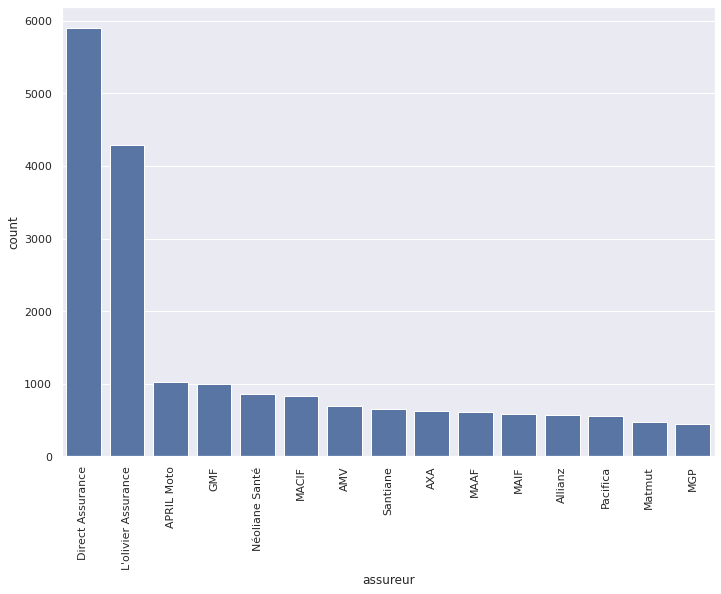

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
pl=sns.countplot(data=df,x="assureur",order = df['assureur'].value_counts().iloc[:15].index,color="b")
ax = pl.axes
ax.tick_params(axis='x', rotation=90)

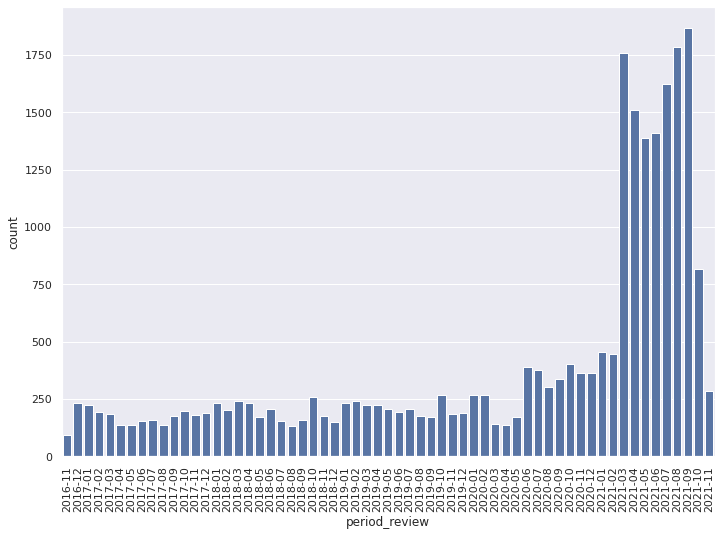

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
pl=sns.countplot(data=df,x="period_review",order=sorted(df['period_review'].unique()),color="b")
ax = pl.axes
ax.tick_params(axis='x', rotation=90)

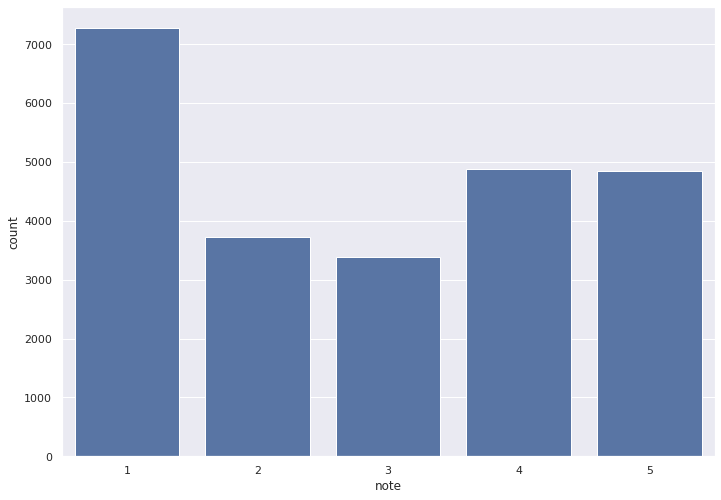

In [ ]:
pl=sns.countplot(data=df,x="note",color="b")

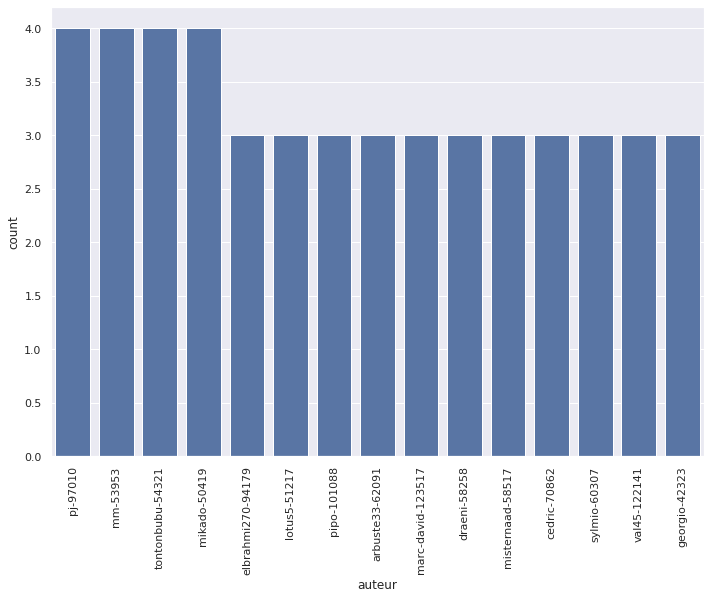

In [ ]:
pl=sns.countplot(data=df,x="auteur",order = df['auteur'].value_counts().iloc[:15].index,color="b")
ax = pl.axes
ax.tick_params(axis='x', rotation=90)

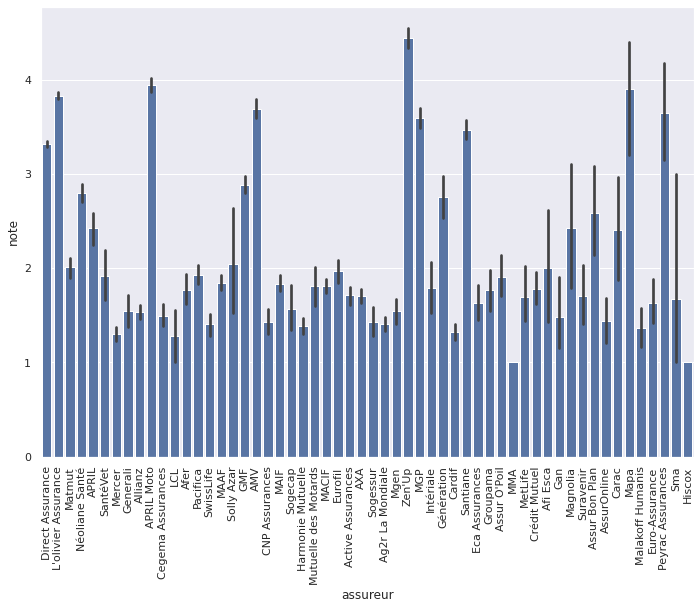

In [ ]:
pl=sns.barplot(data=df,x="assureur",y="note",color="b")
ax = pl.axes
ax.tick_params(axis='x', rotation=90)

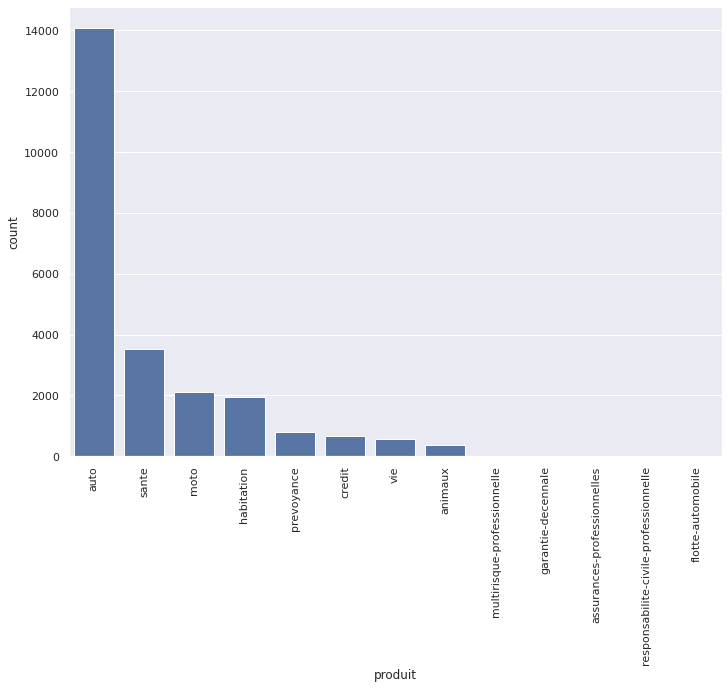

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
pl=sns.countplot(data=df,x="produit",order = df['produit'].value_counts().index,color="b")
ax = pl.axes
ax.tick_params(axis='x', rotation=90)

## With WordClouds

In [ ]:
train=pd.read_csv("train.csv",sep=";")
train.date=train.date.str.strip().str.split(" suite à une expérience en ")
train["date_review"]=train.date.str[0]
train.date_review=train.date_review.str.split(" ")
train.date_review=train.date_review.swifter.apply(lambda x: [x[0], month_convertion[x[1]], x[2]])
train.date_review=train.date_review.swifter.apply(lambda x: " ".join(map(str, x)))
train.date_review=pd.to_datetime(train.date_review, format="%d %m %Y")
train["period_review"]=train.date.str[1]
train.period_review=train.period_review.str.split(" ")
train.period_review=train.period_review.swifter.apply(lambda x: [month_convertion[x[0]], x[1]])
train.period_review=train.period_review.swifter.apply(lambda x: " ".join(map(str, x)))
train.period_review=pd.to_datetime(train.period_review, format="%m %Y").dt.to_period('M')

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

In [ ]:
test=pd.read_csv("test.csv",sep=";")
test.date=test.date.str.strip().str.split(" suite à une expérience en ")
test["date_review"]=test.date.str[0]
test.date_review=test.date_review.str.split(" ")
test.date_review=test.date_review.swifter.apply(lambda x: [x[0], month_convertion[x[1]], x[2]])
test.date_review=test.date_review.swifter.apply(lambda x: " ".join(map(str, x)))
test.date_review=pd.to_datetime(test.date_review, format="%d %m %Y")
test["period_review"]=test.date.str[1]
test.period_review=test.period_review.str.split(" ")
test.period_review=test.period_review.swifter.apply(lambda x: [month_convertion[x[0]], x[1]])
test.period_review=test.period_review.swifter.apply(lambda x: " ".join(map(str, x)))
test.period_review=pd.to_datetime(test.period_review, format="%m %Y").dt.to_period('M')

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

### On all reviews

#### In French

In [ ]:
tous_avis=" ".join(str(review) for review in train.avis)
tous_avis_test=" ".join(str(review) for review in test.avis)

##### On the train set

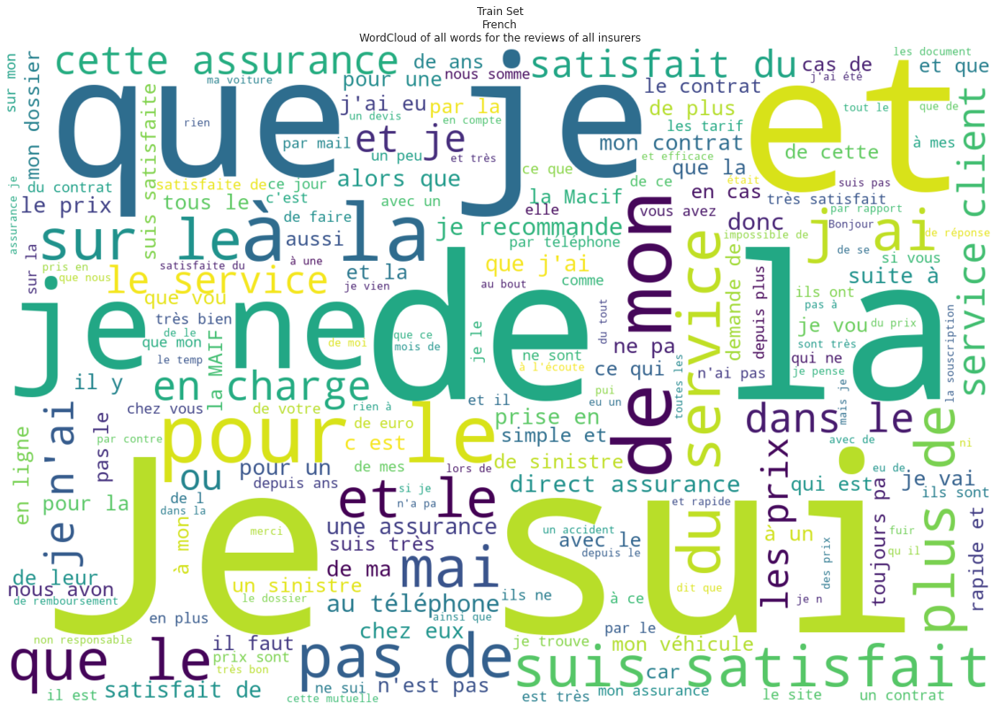

There are 1431610 words in the combination of all reviews.


In [ ]:
wc_tous_avis=WordCloud(background_color="white", width=1500, height=1000).generate(tous_avis)
plt.figure(figsize=(20,30))
plt.imshow(wc_tous_avis, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nFrench\nWordCloud of all words for the reviews of all insurers")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(tous_avis.split(" "))))

In order to get rid of French stopwords, we took a list found on the internet that seemed pretty much complete and we added some appropriate words that were missing.

In [ ]:
stopwords_fr=set(["a","à","â","abord","afin","ah","ai","aie","ainsi","allaient","allo","allô","allons","après","assez","attendu","au","aucun","aucune","aujourd","aujourd'hui","auquel","aura","auront","aussi","autre","autres","aux","auxquelles","auxquels","avaient","avais","avait","avant","avec","avoir","ayant","b","bah","beaucoup","bien","bigre","boum","bravo","brrr","c","ça","car","ce","ceci","cela","celle","celle-ci","celle-là","celles","celles-ci","celles-là","celui","celui-ci","celui-là","cent","cependant","certain","certaine","certaines","certains","certes","ces","cet","cette","ceux","ceux-ci","ceux-là","chacun","chaque","cher","chère","chères","chers","chez","chiche","chut","ci","cinq","cinquantaine","cinquante","cinquantième","cinquième","clac","clic","combien","comme","comment","compris","concernant","contre","couic","crac","d","da","dans","de","debout","dedans","dehors","delà","depuis","derrière","des","dès","désormais","desquelles","desquels","dessous","dessus","deux","deuxième","deuxièmement","devant","devers","devra","différent","différente","différentes","différents","dire","divers","diverse","diverses","dix","dix-huit","dixième","dix-neuf","dix-sept","doit","doivent","donc","dont","douze","douzième","dring","du","duquel","durant","e","effet","eh","elle","elle-même","elles","elles-mêmes","en","encore","entre","envers","environ","es","ès","est","et","etant","étaient","étais","était","étant","etc","été","etre","être","eu","euh","eux","eux-mêmes","excepté","f","façon","fais","faisaient","faisant","fait","feront","fi","flac","floc","font","g","gens","h","ha","hé","hein","hélas","hem","hep","hi","ho","holà","hop","hormis","hors","hou","houp","hue","hui","huit","huitième","hum","hurrah","i","il","ils","importe","j","je","jusqu","jusque","k","l","la","là","laquelle","las","le","lequel","les","lès","lesquelles","lesquels","leur","leurs","longtemps","lorsque","lui","lui-même","m","ma","maint","mais","malgré","me","même","mêmes","merci","mes","mien","mienne","miennes","miens","mille","mince","moi","moi-même","moins","mon","moyennant","n","na","ne","néanmoins","neuf","neuvième","ni","nombreuses","nombreux","non","nos","notre","nôtre","nôtres","nous","nous-mêmes","nul","o","o|","ô","oh","ohé","olé","ollé","on","ont","onze","onzième","ore","ou","où","ouf","ouias","oust","ouste","outre","p","paf","pan","par","parmi","partant","particulier","particulière","particulièrement","pas","passé","pendant","personne","peu","peut","peuvent","peux","pff","pfft","pfut","pif","plein","plouf","plus","plusieurs","plutôt","pouah","pour","pourquoi","premier","première","premièrement","près","proche","psitt","puisque","q","qu","quand","quant","quanta","quant-à-soi","quarante","quatorze","quatre","quatre-vingt","quatrième","quatrièmement","que","quel","quelconque","quelle","quelles","quelque","quelques","quelqu'un","quels","qui","quiconque","quinze","quoi","quoique","r","revoici","revoilà","rien","s","sa","sacrebleu","sans","sapristi","sauf","se","seize","selon","sept","septième","sera","seront","ses","si","sien","sienne","siennes","siens","sinon","six","sixième","soi","soi-même","soit","soixante","son","sont","sous","stop","suis","suivant","sur","surtout","t","ta","tac","tant","te","té","tel","telle","tellement","telles","tels","tenant","tes","tic","tien","tienne","tiennes","tiens","toc","toi","toi-même","ton","touchant","toujours","tous","tout","toute","toutes","treize","trente","très","trois","troisième","troisièmement","trop","tsoin","tsouin","tu","u","un","une","unes","uns","v","va","vais","vas","vé","vers","via","vif","vifs","vingt","vivat","vive","vives","vlan","voici","voilà","vont","vos","votre","vôtre","vôtres","vous","vous-mêmes","vu","w","x","y","z","zut","alors","aucuns","bon","devrait","dos","droite","début","essai","faites","fois","force","haut","ici","juste","maintenant","mine","mot","nommés","nouveaux","parce","parole","personnes","pièce","plupart","seulement","soyez","sujet","tandis","valeur","voie","voient","état","étions"])
stopwords_fr.update(["qu'elle","bref","dit","meme","puis","pris","disant","euro","euros","c'est","j'ai","ca","n'ai","bonjour","faire","mot","passe","m'a","tre","l'on","déjà","n'est","d'un","tres","vien","d'une","n'a","vraiment","faut","viens","pourtant","également","j'avais","auprès","qu'il","lors","avez","d'autre","qu'on","n'y","pu","mi","d'avoir","qu'ils"])

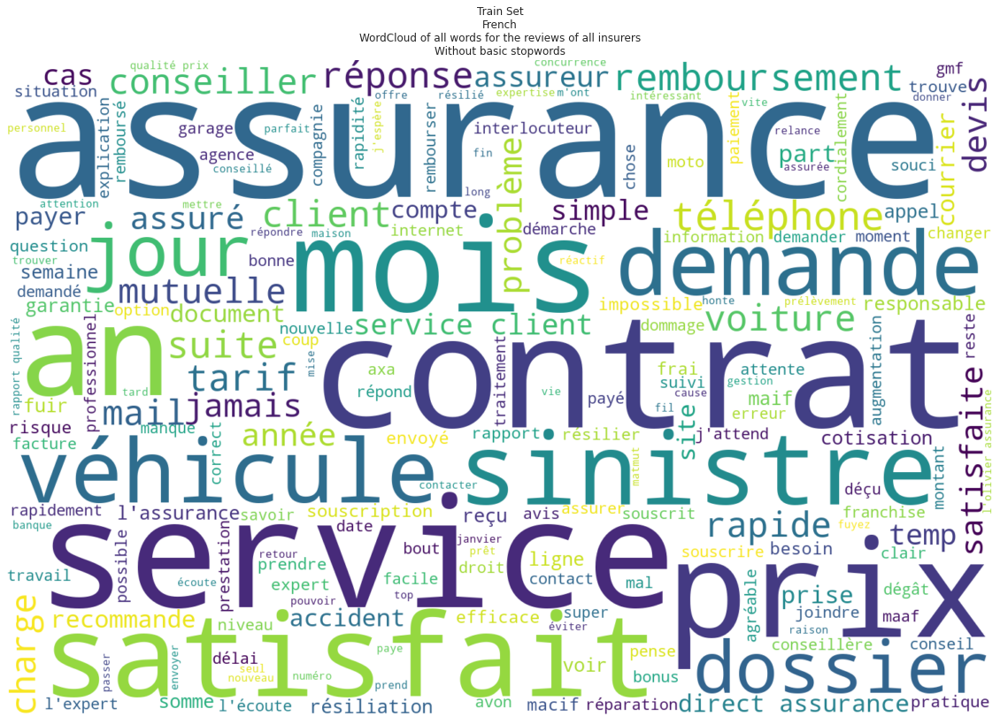

There are 1431610 words in the combination of all reviews.


In [ ]:
wc_tous_avis=WordCloud(stopwords=stopwords_fr, background_color="white", width=1500, height=1000).generate(tous_avis.lower())
plt.figure(figsize=(20,30))
plt.imshow(wc_tous_avis, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nFrench\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(tous_avis.split(" "))))

Afterwards, we tried to get rid of specific words related to insurances that would not add any useful lead.

In [ ]:
stopwords_fr.update(["souscrire","offre","mutuelle","avis","an","année","annee","années","annees","ans","mois","semaine","semaines","jour","jours","assurance","assurances","assuré","l'assurance","d'assurance","assurée","assuré","assureur","contrat","contrats","service","services","dossier","dossiers"])

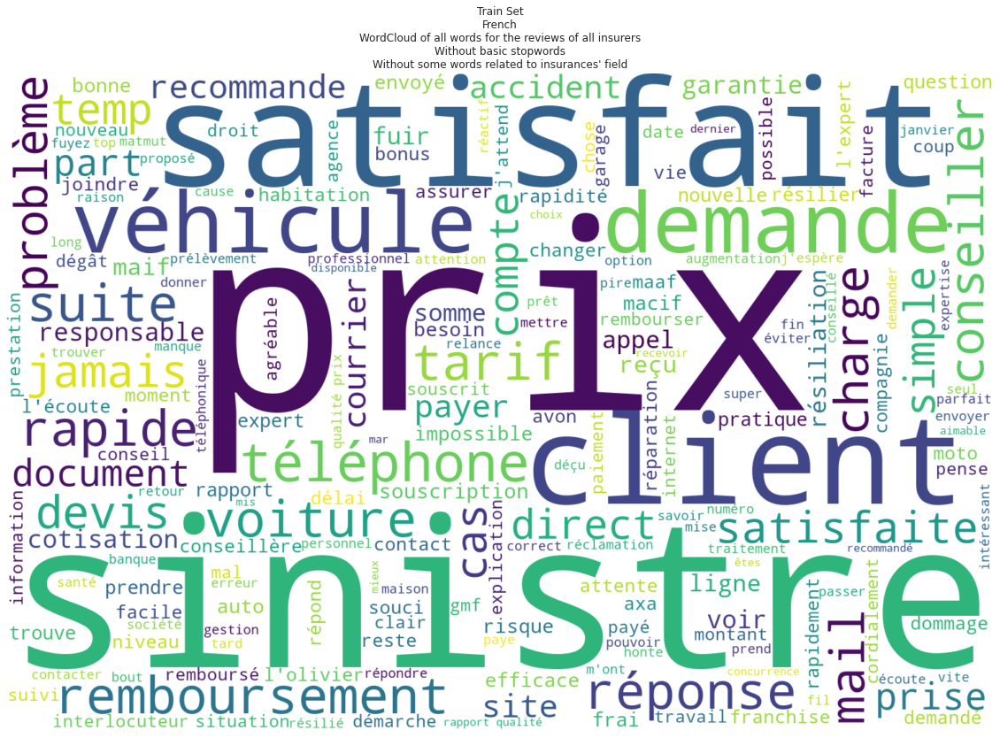

There are 1431610 words in the combination of all reviews.


In [ ]:
wc_tous_avis=WordCloud(stopwords=stopwords_fr, background_color="white", width=1500, height=1000).generate(tous_avis.lower())
plt.figure(figsize=(20,30))
plt.imshow(wc_tous_avis, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nFrench\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords\nWithout some words related to insurances' field")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(tous_avis.split(" "))))

Now, we wanted to try to get pairs of words in the context of a negative word.

In [ ]:
def treatmentPas(review):
    review=str(review.lower()).split(" ")
    nb=review.count("pas")
    if nb>0:
        for i in range(len(review)-nb):
            if review[i]=="pas":
                review[i]+="'"+review.pop(i+1)
        nb+=review.count("pas'trop")+review.count("pas'tres")+review.count("pas'très")+review.count("pas'de")
        if nb>0:
            for i in range(len(review)-nb):
                #print(i)
                if (review[i]=="pas'trop") or (review[i]=="pas'tres") or (review[i]=="pas'très"):
                    review[i]=review[i].split("'")[0]+"'"+review.pop(i+1)
                if (review[i]=="pas'de"):
                    review[i]+="'"+review.pop(i+1)
    #print(review)
    return " ".join(review)

In [ ]:
tous_avis_tr=treatmentPas(tous_avis)

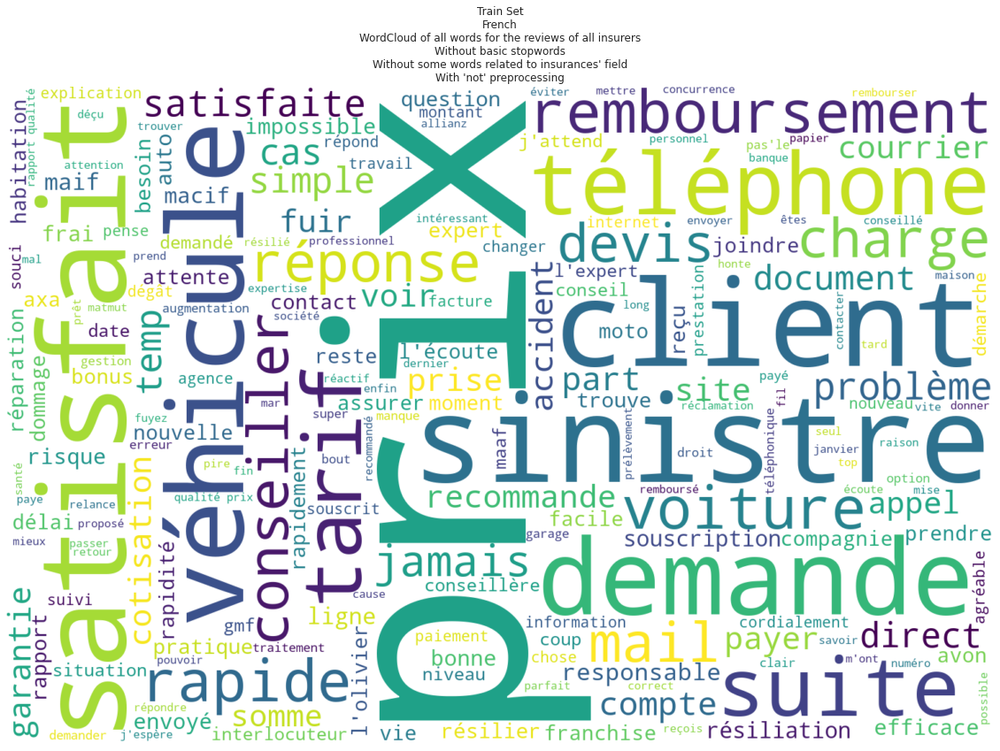

There are 1431610 words in the combination of all reviews.


In [ ]:
wc_tous_avis=WordCloud(stopwords=stopwords_fr, background_color="white", width=1500, height=1000).generate(tous_avis_tr.lower())
plt.figure(figsize=(20,30))
plt.imshow(wc_tous_avis, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nFrench\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords\nWithout some words related to insurances' field\nWith 'not' preprocessing")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(tous_avis.split(" "))))

##### On the test set

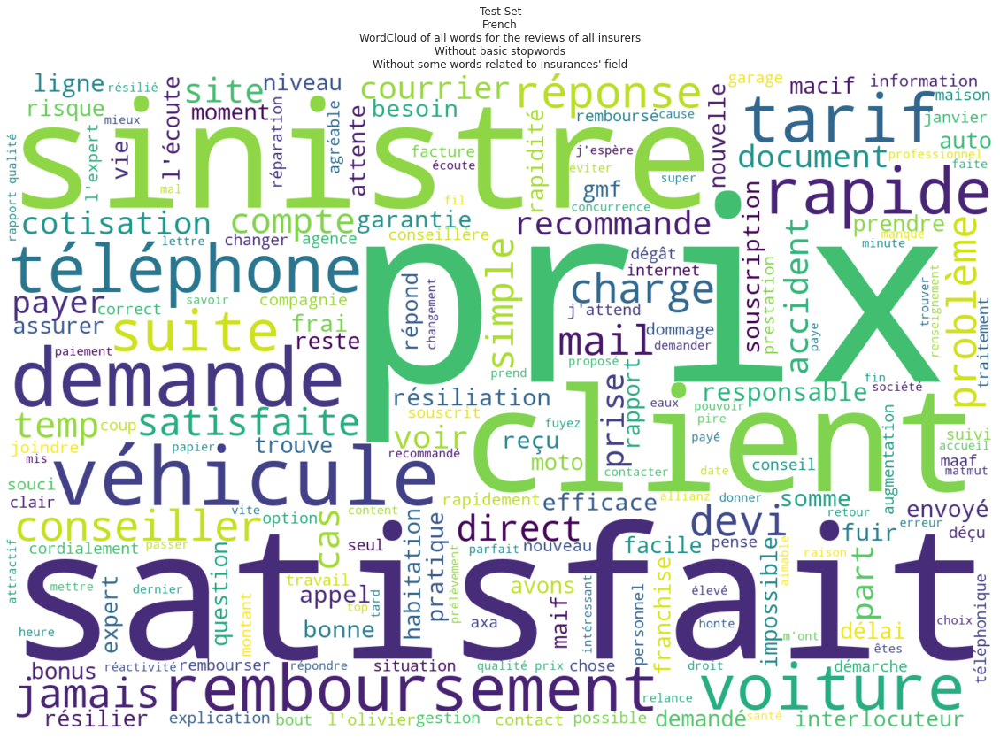

There are 599257 words in the combination of all reviews.


In [ ]:
wc_tous_avis_test=WordCloud(stopwords=stopwords_fr, background_color="white", width=1500, height=1000).generate(tous_avis_test.lower())
plt.figure(figsize=(20,30))
plt.imshow(wc_tous_avis_test, interpolation="bilinear")
plt.axis("off")
plt.title("Test Set\nFrench\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords\nWithout some words related to insurances' field")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(tous_avis_test.split(" "))))

In [ ]:
tous_avis_test_tr=treatmentPas(tous_avis_test)

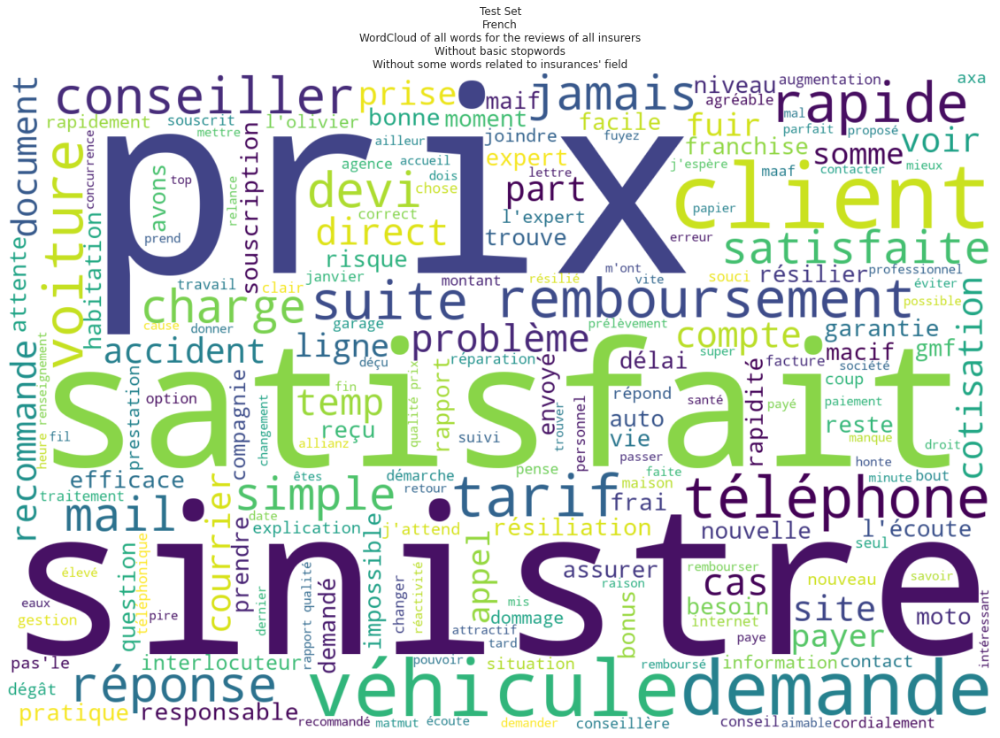

There are 599257 words in the combination of all reviews.


In [ ]:
wc_tous_avis_test=WordCloud(stopwords=stopwords_fr, background_color="white", width=1500, height=1000).generate(tous_avis_test_tr.lower())
plt.figure(figsize=(20,30))
plt.imshow(wc_tous_avis_test, interpolation="bilinear")
plt.axis("off")
plt.title("Test Set\nFrench\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords\nWithout some words related to insurances' field")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(tous_avis_test.split(" "))))

#### In English

In [ ]:
all_reviews_train=" ".join(review for review in train.review)
all_reviews_test=" ".join(str(review) for review in test.review)

##### On the train set

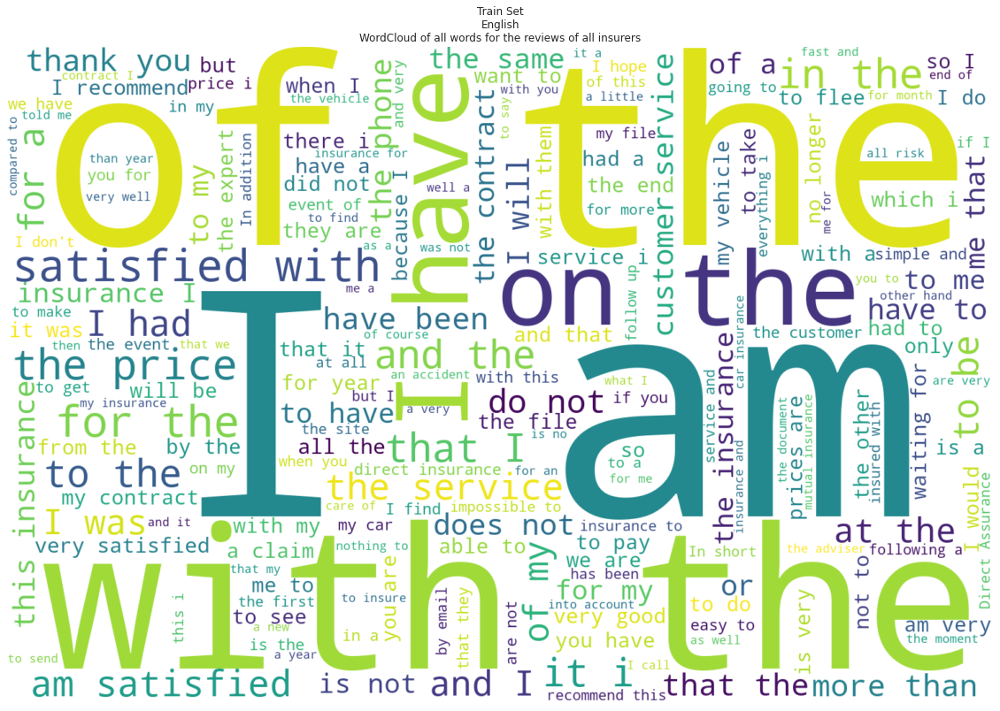

There are 1431610 words in the combination of all reviews.


In [ ]:
wc_all_reviews=WordCloud(stopwords=set(), background_color="white", width=1500, height=1000).generate(all_reviews_train)
plt.figure(figsize=(20,30))
plt.imshow(wc_all_reviews, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nEnglish\nWordCloud of all words for the reviews of all insurers")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(tous_avis.split(" "))))

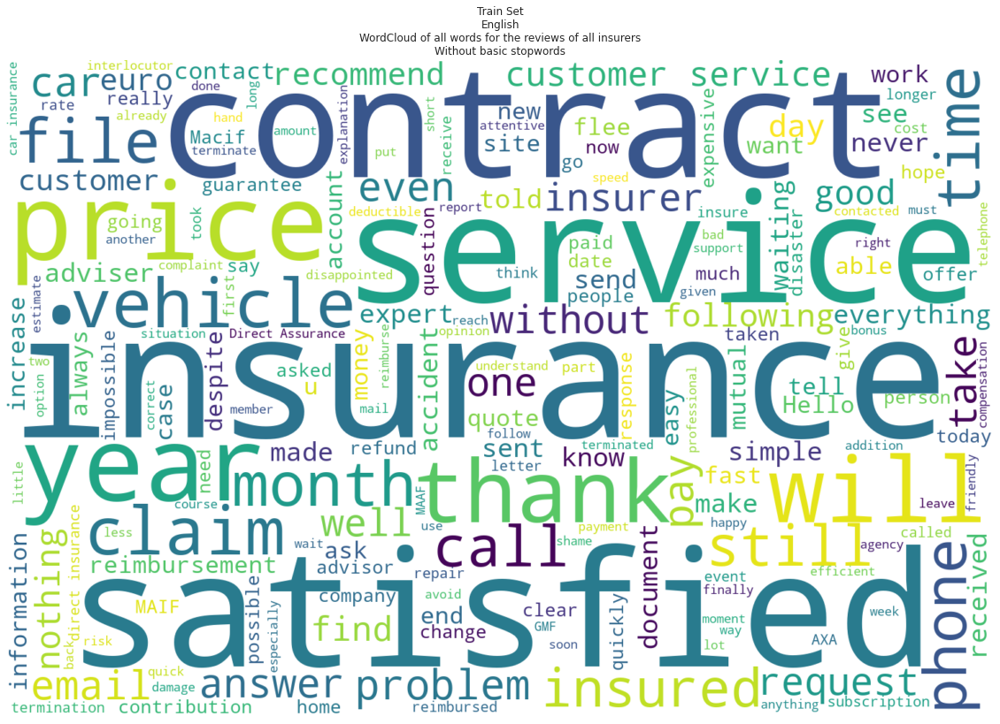

There are 1361421 words in the combination of all reviews.


In [ ]:
wc_all_reviews=WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_reviews_train)
plt.figure(figsize=(20,30))
plt.imshow(wc_all_reviews, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nEnglish\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(all_reviews_train.split(" "))))

In [ ]:
STOPWORDS.update(["think","put","hello","ask","tell","told","two","ask","asked","euro","euros","one","will","go","made","going","want"])

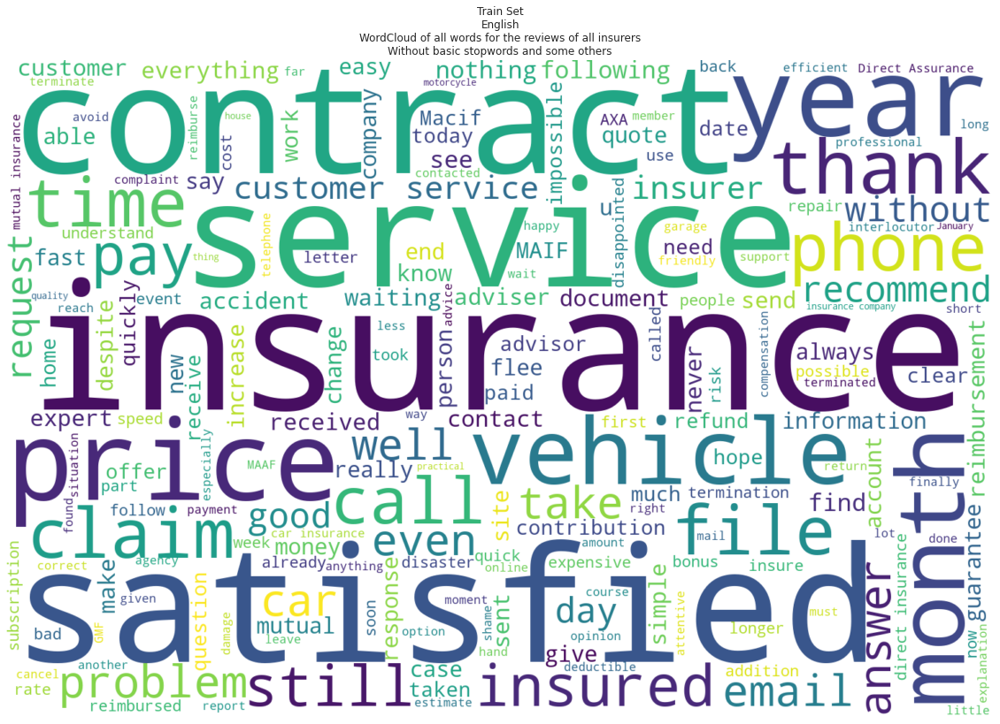

There are 1361421 words in the combination of all reviews.


In [ ]:
wc_all_reviews=WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_reviews_train)
plt.figure(figsize=(20,30))
plt.imshow(wc_all_reviews, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nEnglish\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords and some others")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(all_reviews_train.split(" "))))

In [ ]:
STOPWORDS.update(["insurance","insurances","insured","insurer","contract","contracts","year","years","week","weeks","month","months","day","days","mutual","document","service","services","subscribe","subscription","file","files"])

#"offre","mutuelle","avis","service","services"

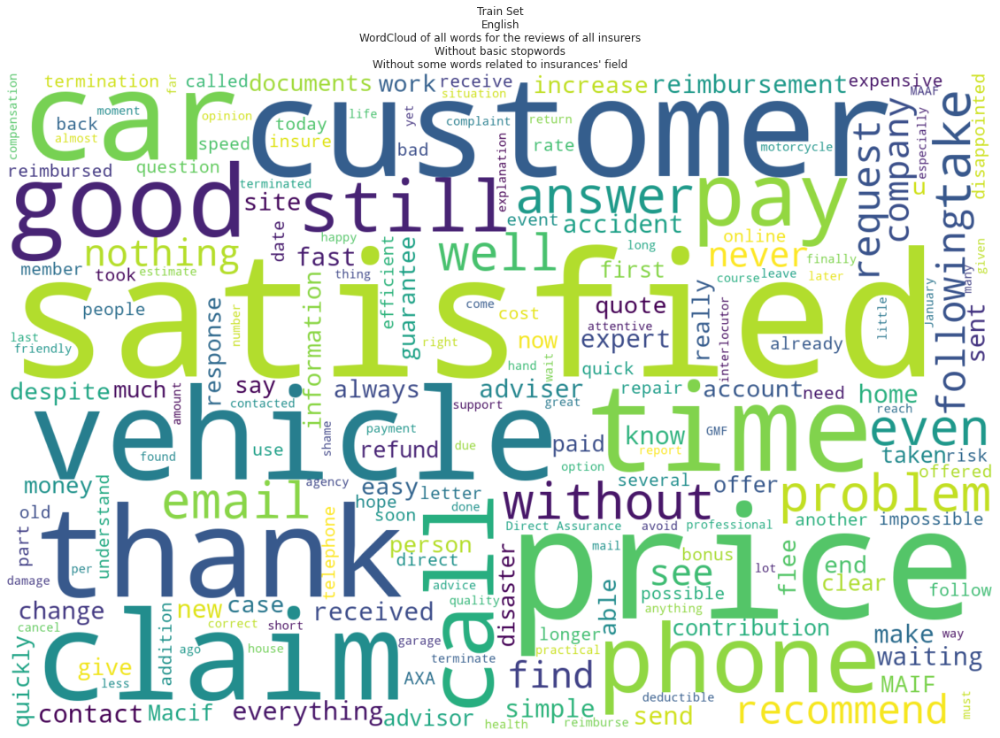

There are 1361421 words in the combination of all reviews.


In [ ]:
wc_all_reviews=WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_reviews_train)
plt.figure(figsize=(20,30))
plt.imshow(wc_all_reviews, interpolation="bilinear")
plt.axis("off")
plt.title("Train Set\nEnglish\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords\nWithout some words related to insurances' field")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(all_reviews_train.split(" "))))

##### On the test set

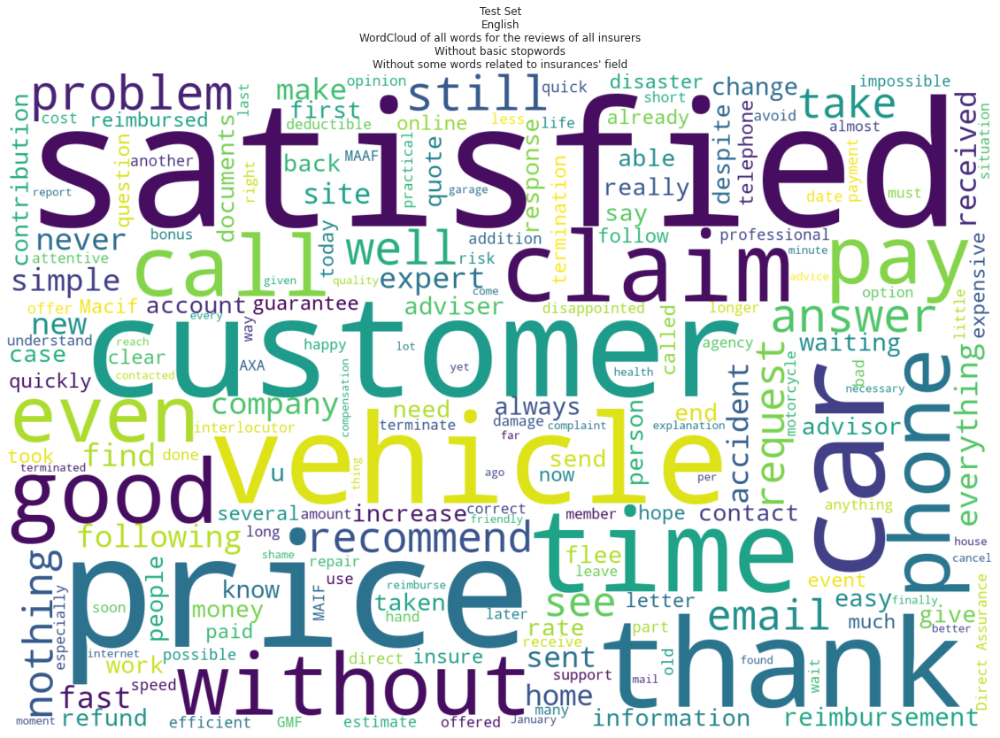

There are 570251 words in the combination of all reviews.


In [ ]:
wc_all_reviews=WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_reviews_test)
plt.figure(figsize=(20,30))
plt.imshow(wc_all_reviews, interpolation="bilinear")
plt.axis("off")
plt.title("Test Set\nEnglish\nWordCloud of all words for the reviews of all insurers\nWithout basic stopwords\nWithout some words related to insurances' field")
plt.show()
print ("There are {} words in the combination of all reviews.".format(len(all_reviews_test.split(" "))))

### For each insurer in English

#### On the train set

In [ ]:
#count=0
for insurer in train.assureur.unique():
    train_insurer=train[train.assureur==insurer]
    all_text_insurer=""
    all_text_insurer=" ".join(str(review) for review in train_insurer.review)
    wc_insurer = WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_text_insurer.lower())
    plt.figure(figsize=(20,30))
    plt.imshow(wc_insurer, interpolation="bilinear")
    plt.axis("off")
    plt.title("Train Set\nEnglish\nWordCloud of all reviews for insurer '" + insurer + "'.\nWithout stopwords and words related to insurers")
    plt.show()
    print ("There are {} words in the combination of all review for the insurer {}.".format(len(all_text_insurer.split(" ")), insurer))
    #if count>=1:
        #break
    #count+=1

#### On the test set

In [ ]:
#count=0
for insurer in test.assureur.unique():
    test_insurer=test[test.assureur==insurer]
    all_text_insurer=""
    all_text_insurer=" ".join(str(review) for review in test_insurer.review)
    wc_insurer = WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_text_insurer.lower())
    plt.figure(figsize=(20,30))
    plt.imshow(wc_insurer, interpolation="bilinear")
    plt.axis("off")
    plt.title("Test Set\nEnglish\nWordCloud of all reviews for insurer '" + insurer + "'.\nWithout stopwords and words related to insurers")
    plt.show()
    print ("There are {} words in the combination of all review for the insurer {}.".format(len(all_text_insurer.split(" ")), insurer))
    #if count>=1:
        #break
    #count+=1

### For each product in English

#### On the train set

In [ ]:
#count=0
for product in train.produit.unique():
    train_product=train[train.produit==product]
    all_text_product=" ".join(str(review) for review in train_product.review)
    wc_product = WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_text_product.lower())
    plt.figure(figsize=(20,30))
    plt.imshow(wc_product, interpolation="bilinear")
    plt.axis("off")
    plt.title("Train Set\nEnglish\nWordCloud of all words for product '" + product + "'.\nWithout stopwords and words related to insurers")
    plt.show()
    print ("There are {} words in the combination of all review for the product {}.".format(len(all_text_product.split(" ")), product))
    #if count>=1:
        #break
    #count+=1

#### On the test set

In [ ]:
#count=0
for product in test.produit.unique():
    test_product=test[test.produit==product]
    all_text_product=" ".join(str(review) for review in test_product.review)
    wc_produit = WordCloud(stopwords=STOPWORDS, background_color="white", width=1500, height=1000).generate(all_text_product.lower())
    plt.figure(figsize=(20,30))
    plt.imshow(wc_product, interpolation="bilinear")
    plt.axis("off")
    plt.title("Test Set\nEnglish\nWordCloud of all words for product '" + product + "'.\nWithout stopwords and words related to insurers")
    plt.show()
    print ("There are {} words in the combination of all review for the product {}.".format(len(all_text_product.split(" ")), product))
    #if count>=1:
        #break
    #count+=1

# Unsupervised Learning

## Text treatment

In [ ]:
train.review=train.review.swifter.apply(lambda x: str(x).lower().replace('\t',' ').replace('\n',' ').replace('\u200b',' ').replace('\r',' '))
test.review=test.review.swifter.apply(lambda x: str(x).lower().replace('\t',' ').replace('\n',' ').replace('\u200b',' ').replace('\r',' '))

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

### Transforming 'not _'

In [ ]:
def treatmentNot(review):
    review=str(review.lower()).split(" ")
    nb=review.count("not")
    if nb>0:
        for i in range(len(review)-nb):
            if (review[i]=="not"):
                if (review[i+1]!="be") and (review[i+1]!="been"):
                    review[i]+="'"+review.pop(i+1)
                else:
                    review[i]+=" "+review.pop(i+1)
        new=review.count("not'to")
        nb+=new
        if new>0:
            for i in range(len(review)-nb):
                if review[i]=="not'to":
                    review[i]+="'"+review.pop(i+1)
    return " ".join(review)

In [ ]:
def transformationNot(review):
    review=str(review.lower()).split(" ")
    for i in range(len(review)):
        if review[i][:4]=="not'":
            temp=review[i].split("'")
            word=temp[-1]
            antonyms=[]
            if temp[1]=="to":
                for syn in wordnet.synsets(word, pos=wordnet.VERB):
                    for j in syn.lemmas():
                        if j.antonyms():
                            antonyms.append(j.antonyms()[0].name())
            else:
                for syn in wordnet.synsets(word):
                    for j in syn.lemmas():
                        if j.antonyms():
                            antonyms.append(j.antonyms()[0].name())
            if antonyms!=[]:
                if temp[1]=="to":
                    review[i]="to "+antonyms[0]
                else:
                    review[i]=antonyms[0]
            else:
                review[i]=" ".join(temp)
    return " ".join(review)

In [ ]:
train["review_not"]=train.review.swifter.apply(lambda x: transformationNot(treatmentNot(x)))
test["review_not"]=test.review.swifter.apply(lambda x: transformationNot(treatmentNot(x)))

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

### Tokenization

In [ ]:
tokenizer=RegexpTokenizer(r'[a-zA-Z]+')

In [ ]:
train.review=train.review.swifter.apply(lambda x: tokenizer.tokenize(x))
train.review_not=train.review_not.swifter.apply(lambda x: tokenizer.tokenize(x))

test.review=test.review.swifter.apply(lambda x: tokenizer.tokenize(x))
test.review_not=test.review_not.swifter.apply(lambda x: tokenizer.tokenize(x))

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

### Stopwords

In [ ]:
stops=set(stopwords.words('english'))
stops.update(["think","put","hello","ask","tell","told","two","ask","asked","euro","euros","one","will","go","made","going","want"])
stops.update(["insurance","insurances","insured","insurer","contract","contracts","year","years","week","weeks","month","months","day","days","mutual","document","service","services","subscribe","subscription","file","files"])

In [ ]:
train.review=train.review.swifter.apply(lambda x: [i for i in x if not i in stops])
train.review_not=train.review_not.swifter.apply(lambda x: [i for i in x if not i in stops])

test.review=test.review.swifter.apply(lambda x: [i for i in x if not i in stops])
test.review_not=test.review_not.swifter.apply(lambda x: [i for i in x if not i in stops])

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

### Lemmatizer

In [ ]:
lemmatizer_output=WordNetLemmatizer()

In [ ]:
train.review=train.review.swifter.apply(lambda x: [lemmatizer_output.lemmatize(y) for y in x])
train.review_not=train.review_not.swifter.apply(lambda x: [lemmatizer_output.lemmatize(y) for y in x])

test.review=test.review.swifter.apply(lambda x: [lemmatizer_output.lemmatize(y) for y in x])
test.review_not=test.review_not.swifter.apply(lambda x: [lemmatizer_output.lemmatize(y) for y in x])

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

### Stopwords Again

In [ ]:
train.review=train.review.swifter.apply(lambda x: [i for i in x if not i in stops])
train.review_not=train.review_not.swifter.apply(lambda x: [i for i in x if not i in stops])

test.review=test.review.swifter.apply(lambda x: [i for i in x if not i in stops])
test.review_not=test.review_not.swifter.apply(lambda x: [i for i in x if not i in stops])

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/24105 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/10332 [00:00<?, ?it/s]

## LDA

### With Gensim

#### On all reviews

##### On the train set

In [ ]:
dictionary=corpora.Dictionary([review for review in train.review])
corpus=[dictionary.doc2bow(doc) for doc in train.review]
ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
print(ldamodel.print_topics(num_topics=5, num_words=5))

[(0, '0.045*"price" + 0.044*"satisfied" + 0.025*"good" + 0.021*"recommend" + 0.014*"thank"'), (1, '0.017*"claim" + 0.013*"without" + 0.011*"customer" + 0.010*"bonus" + 0.008*"car"'), (2, '0.011*"still" + 0.011*"call" + 0.010*"time" + 0.010*"email" + 0.009*"since"'), (3, '0.018*"expert" + 0.010*"vehicle" + 0.008*"car" + 0.008*"pay" + 0.008*"report"'), (4, '0.023*"vehicle" + 0.017*"price" + 0.015*"car" + 0.012*"claim" + 0.011*"customer"')]


In [ ]:
dictionary=corpora.Dictionary([review for review in train.review_not])
corpus=[dictionary.doc2bow(doc) for doc in train.review_not]
ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
print(ldamodel.print_topics(num_topics=5, num_words=5))

[(0, '0.052*"price" + 0.050*"satisfied" + 0.028*"good" + 0.023*"recommend" + 0.015*"thank"'), (1, '0.013*"maif" + 0.010*"expert" + 0.009*"following" + 0.006*"medical" + 0.006*"since"'), (2, '0.014*"answer" + 0.011*"request" + 0.010*"phone" + 0.010*"email" + 0.009*"question"'), (3, '0.013*"call" + 0.012*"still" + 0.011*"time" + 0.009*"customer" + 0.008*"since"'), (4, '0.018*"claim" + 0.018*"vehicle" + 0.015*"car" + 0.010*"without" + 0.009*"price"')]


##### On the test set

In [ ]:
dictionary=corpora.Dictionary([review for review in test.review])
corpus=[dictionary.doc2bow(doc) for doc in test.review]
ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
print(ldamodel.print_topics(num_topics=5, num_words=5))

[(0, '0.008*"call" + 0.007*"claim" + 0.007*"since" + 0.007*"still" + 0.007*"time"'), (1, '0.030*"good" + 0.027*"price" + 0.023*"satisfied" + 0.021*"health" + 0.015*"thank"'), (2, '0.010*"since" + 0.009*"without" + 0.009*"email" + 0.009*"still" + 0.009*"letter"'), (3, '0.016*"dog" + 0.014*"price" + 0.011*"leave" + 0.011*"time" + 0.007*"increase"'), (4, '0.013*"phone" + 0.010*"payment" + 0.010*"r" + 0.009*"contact" + 0.007*"telephone"')]


In [ ]:
dictionary=corpora.Dictionary([review for review in test.review_not])
corpus=[dictionary.doc2bow(doc) for doc in test.review_not]
ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
print(ldamodel.print_topics(num_topics=5, num_words=5))

[(0, '0.015*"maif" + 0.015*"well" + 0.014*"price" + 0.009*"satisfied" + 0.008*"la"'), (1, '0.010*"claim" + 0.009*"still" + 0.009*"expert" + 0.007*"since" + 0.007*"waiting"'), (2, '0.009*"health" + 0.009*"phone" + 0.008*"pension" + 0.008*"customer" + 0.007*"email"'), (3, '0.010*"time" + 0.009*"call" + 0.008*"since" + 0.008*"nothing" + 0.007*"still"'), (4, '0.024*"good" + 0.023*"price" + 0.019*"dog" + 0.017*"satisfied" + 0.013*"customer"')]


#### For each grade

##### On the train set

In [ ]:
for grade in np.sort(train.note.unique()):
    print("\n\n******************** LDA for reviews with a grade of "+str(grade)+" ********************")
    train_grade=train[train.note==grade]
    print("Size of the dataset: "+str(train_grade.shape[0])+" reviews\n")
    print("\t\tLDA for the reviews in the train set\n")
    dictionary=corpora.Dictionary([review for review in train_grade.review])
    corpus=[dictionary.doc2bow(doc) for doc in train_grade.review]
    try:
        ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
        print(ldamodel.print_topics(num_topics=5, num_words=5))
        print("\n\n\t\tLDA for the transformed reviews in the train set\n")
        dictionary=corpora.Dictionary([review for review in train_grade.review_not])
        corpus=[dictionary.doc2bow(doc) for doc in train_grade.review_not]
        ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
        print(ldamodel.print_topics(num_topics=5, num_words=5))
    except Exception:
            print("There are no review with a grade of "+str(grade))
            pass



******************** LDA for reviews with a grade of 1 ********************
Size of the dataset: 7271 reviews

		LDA for the reviews in the train set



[(0, '0.013*"vehicle" + 0.009*"without" + 0.009*"expert" + 0.008*"car" + 0.008*"claim"'), (1, '0.011*"car" + 0.010*"claim" + 0.009*"call" + 0.007*"accident" + 0.007*"pay"'), (2, '0.011*"time" + 0.007*"request" + 0.007*"never" + 0.006*"customer" + 0.006*"email"'), (3, '0.015*"customer" + 0.010*"call" + 0.009*"time" + 0.009*"still" + 0.008*"phone"'), (4, '0.007*"company" + 0.007*"following" + 0.007*"maif" + 0.006*"since" + 0.006*"without"')]


		LDA for the transformed reviews in the train set



[(0, '0.009*"time" + 0.007*"even" + 0.006*"sent" + 0.006*"would" + 0.006*"pay"'), (1, '0.012*"without" + 0.011*"increase" + 0.010*"price" + 0.009*"claim" + 0.008*"pay"'), (2, '0.007*"car" + 0.007*"since" + 0.007*"still" + 0.006*"take" + 0.006*"expert"'), (3, '0.011*"claim" + 0.011*"vehicle" + 0.008*"car" + 0.007*"still" + 0.007*"customer"'), (4, '0.013*"customer" + 0.010*"email" + 0.009*"call" + 0.008*"still" + 0.008*"time"')]


******************** LDA for reviews with a grade of 2 ********************
Size of the dataset: 3717 reviews

		LDA for the reviews in the train set



[(0, '0.014*"customer" + 0.009*"price" + 0.008*"email" + 0.007*"call" + 0.006*"claim"'), (1, '0.010*"still" + 0.008*"car" + 0.007*"problem" + 0.007*"following" + 0.007*"accident"'), (2, '0.011*"vehicle" + 0.007*"time" + 0.007*"since" + 0.007*"claim" + 0.006*"car"'), (3, '0.011*"call" + 0.009*"still" + 0.009*"email" + 0.008*"car" + 0.008*"waiting"'), (4, '0.013*"vehicle" + 0.010*"claim" + 0.010*"since" + 0.009*"expert" + 0.008*"call"')]


		LDA for the transformed reviews in the train set



[(0, '0.014*"vehicle" + 0.012*"claim" + 0.010*"car" + 0.008*"accident" + 0.007*"price"'), (1, '0.009*"customer" + 0.008*"accident" + 0.008*"car" + 0.007*"price" + 0.007*"pay"'), (2, '0.015*"customer" + 0.008*"car" + 0.007*"phone" + 0.006*"email" + 0.006*"call"'), (3, '0.009*"vehicle" + 0.008*"without" + 0.008*"time" + 0.008*"call" + 0.007*"take"'), (4, '0.010*"still" + 0.009*"call" + 0.009*"since" + 0.008*"time" + 0.007*"email"')]


******************** LDA for reviews with a grade of 3 ********************
Size of the dataset: 3382 reviews

		LDA for the reviews in the train set



[(0, '0.018*"price" + 0.013*"satisfied" + 0.007*"customer" + 0.007*"good" + 0.006*"would"'), (1, '0.026*"price" + 0.015*"satisfied" + 0.007*"car" + 0.007*"find" + 0.007*"everything"'), (2, '0.010*"problem" + 0.010*"satisfied" + 0.008*"customer" + 0.006*"car" + 0.006*"following"'), (3, '0.018*"price" + 0.017*"satisfied" + 0.017*"vehicle" + 0.011*"good" + 0.010*"customer"'), (4, '0.013*"price" + 0.007*"time" + 0.007*"without" + 0.007*"customer" + 0.007*"payment"')]


		LDA for the transformed reviews in the train set



[(0, '0.009*"customer" + 0.008*"vehicle" + 0.008*"call" + 0.008*"price" + 0.007*"satisfied"'), (1, '0.018*"price" + 0.015*"satisfied" + 0.009*"time" + 0.009*"vehicle" + 0.008*"customer"'), (2, '0.017*"price" + 0.016*"good" + 0.011*"satisfied" + 0.011*"problem" + 0.009*"would"'), (3, '0.029*"price" + 0.018*"satisfied" + 0.008*"expensive" + 0.008*"see" + 0.008*"customer"'), (4, '0.009*"customer" + 0.007*"claim" + 0.007*"since" + 0.006*"vehicle" + 0.006*"following"')]


******************** LDA for reviews with a grade of 4 ********************
Size of the dataset: 4885 reviews

		LDA for the reviews in the train set



[(0, '0.017*"satisfied" + 0.016*"problem" + 0.016*"well" + 0.010*"good" + 0.010*"price"'), (1, '0.039*"price" + 0.038*"satisfied" + 0.017*"recommend" + 0.014*"easy" + 0.012*"good"'), (2, '0.053*"satisfied" + 0.046*"price" + 0.019*"simple" + 0.013*"recommend" + 0.013*"good"'), (3, '0.018*"satisfied" + 0.018*"price" + 0.016*"thank" + 0.012*"happy" + 0.011*"time"'), (4, '0.038*"good" + 0.035*"price" + 0.024*"satisfied" + 0.017*"customer" + 0.009*"recommend"')]


		LDA for the transformed reviews in the train set



[(0, '0.021*"satisfied" + 0.020*"good" + 0.012*"well" + 0.010*"price" + 0.009*"phone"'), (1, '0.049*"satisfied" + 0.038*"price" + 0.019*"good" + 0.010*"simple" + 0.010*"offered"'), (2, '0.045*"price" + 0.033*"satisfied" + 0.017*"customer" + 0.015*"thank" + 0.015*"good"'), (3, '0.021*"price" + 0.015*"customer" + 0.015*"satisfied" + 0.014*"good" + 0.012*"recommend"'), (4, '0.035*"price" + 0.030*"satisfied" + 0.015*"vehicle" + 0.015*"good" + 0.014*"see"')]


******************** LDA for reviews with a grade of 5 ********************
Size of the dataset: 4850 reviews

		LDA for the reviews in the train set



[(0, '0.053*"price" + 0.047*"satisfied" + 0.033*"good" + 0.023*"recommend" + 0.014*"easy"'), (1, '0.041*"price" + 0.036*"satisfied" + 0.025*"recommend" + 0.019*"well" + 0.018*"assurance"'), (2, '0.027*"satisfied" + 0.017*"price" + 0.014*"recommend" + 0.014*"well" + 0.012*"guarantee"'), (3, '0.034*"satisfied" + 0.030*"price" + 0.017*"thank" + 0.015*"fast" + 0.014*"well"'), (4, '0.024*"satisfied" + 0.021*"price" + 0.020*"good" + 0.019*"recommend" + 0.013*"always"')]


		LDA for the transformed reviews in the train set

[(0, '0.029*"satisfied" + 0.027*"thank" + 0.020*"price" + 0.016*"good" + 0.013*"happy"'), (1, '0.027*"price" + 0.023*"satisfied" + 0.016*"fast" + 0.015*"recommend" + 0.013*"good"'), (2, '0.027*"satisfied" + 0.021*"price" + 0.020*"easy" + 0.020*"thank" + 0.019*"good"'), (3, '0.018*"satisfied" + 0.017*"price" + 0.015*"always" + 0.014*"recommend" + 0.011*"easy"'), (4, '0.067*"price" + 0.061*"satisfied" + 0.036*"recommend" + 0.027*"good" + 0.017*"simple"')]


#### For each product

##### On the train set

In [ ]:
for product in np.sort(train.produit.unique()):
    print("\n\n******************** LDA for reviews of the product "+str(product)+" ********************")
    train_grade=train[train.produit==product]
    print("Size of the dataset: "+str(train_grade.shape[0])+" reviews\n")
    print("\t\tLDA for the reviews in the train set\n")
    dictionary=corpora.Dictionary([review for review in train_grade.review])
    corpus=[dictionary.doc2bow(doc) for doc in train_grade.review]
    try:
        ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
        print(ldamodel.print_topics(num_topics=5, num_words=5))
        print("\n\n\t\tLDA for the transformed reviews in the train set\n")
        dictionary=corpora.Dictionary([review for review in train_grade.review_not])
        corpus=[dictionary.doc2bow(doc) for doc in train_grade.review_not]
        ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
        print(ldamodel.print_topics(num_topics=5, num_words=5))
    except Exception:
            print("There are no review for the product "+str(product))
            pass



******************** LDA for reviews of the product animaux ********************
Size of the dataset: 374 reviews

		LDA for the reviews in the train set



[(0, '0.011*"dog" + 0.008*"time" + 0.008*"email" + 0.008*"problem" + 0.007*"phone"'), (1, '0.010*"animal" + 0.008*"never" + 0.007*"reimbursement" + 0.007*"refund" + 0.006*"cat"'), (2, '0.014*"dog" + 0.010*"animal" + 0.009*"take" + 0.007*"request" + 0.007*"letter"'), (3, '0.011*"reimbursement" + 0.009*"dog" + 0.007*"animal" + 0.007*"reimbursed" + 0.007*"care"'), (4, '0.017*"dog" + 0.016*"reimbursed" + 0.008*"pay" + 0.008*"increase" + 0.007*"never"')]


		LDA for the transformed reviews in the train set



[(0, '0.020*"dog" + 0.011*"increase" + 0.010*"reimbursement" + 0.007*"time" + 0.007*"take"'), (1, '0.011*"dog" + 0.007*"customer" + 0.007*"care" + 0.007*"reimburse" + 0.006*"reimbursement"'), (2, '0.009*"dog" + 0.008*"customer" + 0.008*"refund" + 0.008*"animal" + 0.006*"reimbursement"'), (3, '0.013*"dog" + 0.009*"reimbursement" + 0.008*"animal" + 0.008*"reimbursed" + 0.007*"refund"'), (4, '0.012*"reimbursed" + 0.007*"time" + 0.007*"refund" + 0.007*"animal" + 0.006*"never"')]


******************** LDA for reviews of the product assurances-professionnelles ********************
Size of the dataset: 8 reviews

		LDA for the reviews in the train set

[(0, '0.027*"axa" + 0.018*"office" + 0.015*"rented" + 0.015*"activity" + 0.014*"june"'), (1, '0.046*"wait" + 0.031*"move" + 0.017*"endanger" + 0.017*"need" + 0.017*"job"'), (2, '0.019*"time" + 0.018*"invalidity" + 0.014*"worst" + 0.013*"hold" + 0.013*"call"'), (3, '0.015*"generali" + 0.015*"avoid" + 0.011*"contribution" + 0.011*"professional" 

[(0, '0.013*"satisfied" + 0.013*"good" + 0.010*"thank" + 0.009*"price" + 0.009*"thanks"'), (1, '0.021*"vehicle" + 0.013*"car" + 0.012*"pay" + 0.011*"price" + 0.010*"claim"'), (2, '0.014*"vehicle" + 0.012*"call" + 0.012*"car" + 0.011*"expert" + 0.010*"claim"'), (3, '0.062*"price" + 0.052*"satisfied" + 0.024*"good" + 0.024*"recommend" + 0.015*"thank"'), (4, '0.017*"without" + 0.015*"increase" + 0.014*"price" + 0.014*"claim" + 0.011*"customer"')]


		LDA for the transformed reviews in the train set



[(0, '0.013*"pay" + 0.012*"call" + 0.012*"car" + 0.008*"without" + 0.008*"still"'), (1, '0.062*"price" + 0.045*"satisfied" + 0.022*"recommend" + 0.017*"good" + 0.013*"direct"'), (2, '0.027*"vehicle" + 0.020*"claim" + 0.012*"without" + 0.012*"expert" + 0.010*"car"'), (3, '0.018*"vehicle" + 0.012*"car" + 0.011*"expert" + 0.010*"customer" + 0.010*"claim"'), (4, '0.029*"good" + 0.015*"money" + 0.014*"satisfied" + 0.014*"value" + 0.011*"price"')]


******************** LDA for reviews of the product credit ********************
Size of the dataset: 653 reviews

		LDA for the reviews in the train set



[(0, '0.012*"cardif" + 0.008*"doctor" + 0.008*"expert" + 0.007*"sent" + 0.007*"time"'), (1, '0.013*"price" + 0.010*"loan" + 0.009*"satisfied" + 0.007*"medical" + 0.006*"recommend"'), (2, '0.010*"price" + 0.009*"satisfied" + 0.007*"since" + 0.007*"loan" + 0.006*"following"'), (3, '0.012*"loan" + 0.011*"time" + 0.008*"medical" + 0.007*"since" + 0.007*"cardif"'), (4, '0.009*"good" + 0.009*"cardif" + 0.007*"request" + 0.007*"bank" + 0.007*"loan"')]


		LDA for the transformed reviews in the train set



[(0, '0.016*"loan" + 0.008*"time" + 0.007*"u" + 0.007*"work" + 0.007*"cardif"'), (1, '0.009*"since" + 0.008*"request" + 0.008*"time" + 0.007*"adviser" + 0.007*"even"'), (2, '0.014*"cardif" + 0.009*"satisfied" + 0.008*"price" + 0.006*"sent" + 0.006*"expert"'), (3, '0.009*"good" + 0.008*"doctor" + 0.008*"loan" + 0.008*"satisfied" + 0.008*"recommend"'), (4, '0.009*"medical" + 0.007*"time" + 0.007*"cardif" + 0.006*"bank" + 0.006*"email"')]


******************** LDA for reviews of the product flotte-automobile ********************
Size of the dataset: 1 reviews

		LDA for the reviews in the train set

[(0, '0.044*"business" + 0.044*"expensive" + 0.043*"motor" + 0.043*"wanted" + 0.043*"unjustified"'), (1, '0.064*"business" + 0.055*"obstacle" + 0.047*"believe" + 0.047*"unjustified" + 0.046*"recommend"'), (2, '0.079*"business" + 0.047*"vehicle" + 0.046*"axa" + 0.045*"fleet" + 0.045*"offering"'), (3, '0.044*"business" + 0.043*"unjustified" + 0.043*"increase" + 0.043*"axa" + 0.043*"provide"'), 

[(0, '0.013*"maif" + 0.008*"without" + 0.006*"expert" + 0.006*"claim" + 0.005*"customer"'), (1, '0.013*"claim" + 0.008*"customer" + 0.008*"damage" + 0.007*"home" + 0.006*"expert"'), (2, '0.012*"claim" + 0.010*"expert" + 0.008*"damage" + 0.007*"call" + 0.007*"time"'), (3, '0.015*"expert" + 0.010*"damage" + 0.009*"claim" + 0.008*"water" + 0.007*"without"'), (4, '0.013*"damage" + 0.012*"claim" + 0.008*"water" + 0.008*"following" + 0.006*"home"')]


		LDA for the transformed reviews in the train set



[(0, '0.012*"claim" + 0.011*"damage" + 0.008*"expert" + 0.007*"water" + 0.006*"without"'), (1, '0.012*"claim" + 0.009*"expert" + 0.008*"damage" + 0.008*"disaster" + 0.008*"maif"'), (2, '0.014*"claim" + 0.013*"expert" + 0.012*"damage" + 0.008*"water" + 0.007*"customer"'), (3, '0.009*"maif" + 0.007*"home" + 0.007*"expert" + 0.007*"claim" + 0.007*"time"'), (4, '0.011*"expert" + 0.009*"maif" + 0.008*"time" + 0.008*"damage" + 0.007*"pay"')]


******************** LDA for reviews of the product moto ********************
Size of the dataset: 2105 reviews

		LDA for the reviews in the train set



[(0, '0.018*"email" + 0.012*"phone" + 0.012*"amv" + 0.011*"motorcycle" + 0.011*"price"'), (1, '0.024*"price" + 0.015*"satisfied" + 0.013*"still" + 0.013*"easy" + 0.011*"time"'), (2, '0.025*"price" + 0.021*"satisfied" + 0.011*"thank" + 0.009*"scooter" + 0.009*"vehicle"'), (3, '0.017*"motorcycle" + 0.016*"price" + 0.015*"april" + 0.010*"due" + 0.009*"satisfied"'), (4, '0.013*"motorcycle" + 0.010*"time" + 0.008*"vehicle" + 0.008*"claim" + 0.008*"short"')]


		LDA for the transformed reviews in the train set



[(0, '0.031*"price" + 0.014*"satisfied" + 0.012*"motorcycle" + 0.012*"time" + 0.011*"easy"'), (1, '0.022*"price" + 0.013*"satisfied" + 0.010*"problem" + 0.009*"accident" + 0.009*"claim"'), (2, '0.041*"satisfied" + 0.022*"recommend" + 0.021*"good" + 0.020*"price" + 0.019*"fast"'), (3, '0.012*"email" + 0.011*"motorcycle" + 0.011*"pay" + 0.010*"vehicle" + 0.009*"still"'), (4, '0.011*"vehicle" + 0.011*"time" + 0.010*"motorcycle" + 0.009*"without" + 0.009*"email"')]


******************** LDA for reviews of the product multirisque-professionnelle ********************
Size of the dataset: 20 reviews

		LDA for the reviews in the train set

[(0, '0.013*"still" + 0.012*"know" + 0.009*"good" + 0.009*"tego" + 0.009*"help"'), (1, '0.013*"u" + 0.012*"axa" + 0.011*"recommend" + 0.010*"professional" + 0.008*"agency"'), (2, '0.012*"u" + 0.012*"professional" + 0.012*"axa" + 0.009*"copy" + 0.009*"claim"'), (3, '0.013*"axa" + 0.010*"u" + 0.009*"cancellation" + 0.009*"flight" + 0.009*"air"'), (4, '0.013*

[(0, '0.007*"call" + 0.007*"pension" + 0.006*"still" + 0.006*"nothing" + 0.006*"problem"'), (1, '0.012*"since" + 0.012*"time" + 0.009*"still" + 0.009*"answer" + 0.006*"payment"'), (2, '0.008*"call" + 0.008*"since" + 0.008*"cnp" + 0.007*"still" + 0.006*"waiting"'), (3, '0.009*"since" + 0.008*"time" + 0.008*"call" + 0.005*"received" + 0.005*"sent"'), (4, '0.007*"sick" + 0.007*"since" + 0.007*"without" + 0.006*"leave" + 0.006*"salary"')]


		LDA for the transformed reviews in the train set



[(0, '0.012*"since" + 0.008*"time" + 0.006*"salary" + 0.006*"paid" + 0.006*"still"'), (1, '0.008*"since" + 0.008*"time" + 0.007*"pension" + 0.007*"still" + 0.007*"answer"'), (2, '0.009*"still" + 0.007*"customer" + 0.007*"since" + 0.006*"company" + 0.006*"waiting"'), (3, '0.012*"since" + 0.011*"call" + 0.009*"time" + 0.007*"still" + 0.006*"email"'), (4, '0.009*"time" + 0.008*"payment" + 0.008*"answer" + 0.007*"call" + 0.006*"several"')]


******************** LDA for reviews of the product responsabilite-civile-professionnelle ********************
Size of the dataset: 5 reviews

		LDA for the reviews in the train set

[(0, '0.030*"seriousness" + 0.030*"time" + 0.030*"lsa" + 0.030*"premium" + 0.030*"competent"'), (1, '0.033*"insure" + 0.025*"invoicing" + 0.025*"job" + 0.025*"stay" + 0.025*"nail"'), (2, '0.045*"professional" + 0.044*"claim" + 0.031*"court" + 0.017*"yet" + 0.017*"house"'), (3, '0.058*"legal" + 0.058*"allianz" + 0.040*"refuse" + 0.040*"proceeding" + 0.040*"expertise"'), (4,

[(0, '0.010*"health" + 0.009*"since" + 0.009*"company" + 0.009*"time" + 0.008*"reimbursement"'), (1, '0.021*"good" + 0.011*"reimbursement" + 0.011*"time" + 0.009*"telephone" + 0.008*"price"'), (2, '0.012*"reimbursement" + 0.009*"satisfied" + 0.008*"thank" + 0.008*"problem" + 0.007*"good"'), (3, '0.010*"good" + 0.010*"time" + 0.008*"customer" + 0.008*"problem" + 0.008*"phone"'), (4, '0.011*"call" + 0.010*"since" + 0.010*"phone" + 0.009*"answer" + 0.009*"well"')]


		LDA for the transformed reviews in the train set



[(0, '0.008*"call" + 0.007*"time" + 0.006*"company" + 0.006*"without" + 0.006*"would"'), (1, '0.011*"reimbursement" + 0.010*"problem" + 0.010*"time" + 0.009*"health" + 0.009*"price"'), (2, '0.009*"phone" + 0.008*"satisfied" + 0.008*"good" + 0.007*"refund" + 0.007*"answer"'), (3, '0.014*"customer" + 0.011*"phone" + 0.011*"email" + 0.009*"since" + 0.007*"time"'), (4, '0.009*"reimbursement" + 0.009*"good" + 0.009*"request" + 0.008*"time" + 0.007*"call"')]


******************** LDA for reviews of the product vie ********************
Size of the dataset: 578 reviews

		LDA for the reviews in the train set



[(0, '0.021*"life" + 0.010*"still" + 0.009*"request" + 0.007*"afer" + 0.007*"sent"'), (1, '0.011*"life" + 0.009*"time" + 0.008*"money" + 0.008*"since" + 0.007*"u"'), (2, '0.010*"life" + 0.009*"email" + 0.009*"account" + 0.009*"since" + 0.008*"money"'), (3, '0.008*"answer" + 0.007*"money" + 0.007*"phone" + 0.006*"since" + 0.006*"afer"'), (4, '0.011*"life" + 0.008*"money" + 0.006*"call" + 0.006*"still" + 0.006*"time"')]


		LDA for the transformed reviews in the train set

[(0, '0.009*"money" + 0.008*"since" + 0.008*"life" + 0.008*"time" + 0.008*"email"'), (1, '0.017*"life" + 0.011*"cardif" + 0.007*"money" + 0.007*"still" + 0.007*"since"'), (2, '0.019*"life" + 0.009*"account" + 0.008*"still" + 0.007*"afer" + 0.006*"payment"'), (3, '0.011*"life" + 0.007*"death" + 0.007*"time" + 0.007*"request" + 0.006*"afer"'), (4, '0.010*"life" + 0.009*"account" + 0.008*"afer" + 0.007*"time" + 0.007*"still"')]


##### On the test set

In [ ]:
for product in np.sort(test.produit.unique()):
    print("\n\n******************** LDA for reviews of the product "+str(product)+" ********************")
    test_grade=test[test.produit==product]
    print("Size of the dataset: "+str(test_grade.shape[0])+" reviews\n")
    print("\t\tLDA for the reviews in the test set\n")
    dictionary=corpora.Dictionary([review for review in test_grade.review])
    corpus=[dictionary.doc2bow(doc) for doc in test_grade.review]
    try:
        ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
        print(ldamodel.print_topics(num_topics=5, num_words=5))
        print("\n\n\t\tLDA for the transformed reviews in the test set\n")
        dictionary=corpora.Dictionary([review for review in test_grade.review_not])
        corpus=[dictionary.doc2bow(doc) for doc in test_grade.review_not]
        ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
        print(ldamodel.print_topics(num_topics=5, num_words=5))
    except Exception:
            print("There are no review for the product "+str(product))
            pass



******************** LDA for reviews of the product animaux ********************
Size of the dataset: 149 reviews

		LDA for the reviews in the test set



[(0, '0.012*"dog" + 0.008*"good" + 0.008*"time" + 0.007*"reimbursement" + 0.006*"without"'), (1, '0.012*"reimbursed" + 0.012*"dog" + 0.010*"reimbursement" + 0.008*"take" + 0.008*"phone"'), (2, '0.015*"reimbursement" + 0.009*"dog" + 0.006*"animal" + 0.006*"reimbursed" + 0.006*"sent"'), (3, '0.011*"dog" + 0.009*"taken" + 0.008*"refund" + 0.008*"phone" + 0.008*"since"'), (4, '0.012*"time" + 0.008*"customer" + 0.007*"call" + 0.007*"even" + 0.007*"pay"')]


		LDA for the transformed reviews in the test set



[(0, '0.011*"dog" + 0.010*"reimbursement" + 0.007*"animal" + 0.007*"taken" + 0.006*"sent"'), (1, '0.010*"dog" + 0.008*"reimbursement" + 0.008*"since" + 0.007*"refund" + 0.007*"problem"'), (2, '0.015*"dog" + 0.008*"phone" + 0.008*"time" + 0.007*"reimbursed" + 0.006*"take"'), (3, '0.011*"reimbursed" + 0.010*"dog" + 0.008*"refund" + 0.007*"answer" + 0.007*"even"'), (4, '0.011*"time" + 0.009*"reimbursement" + 0.009*"waiting" + 0.009*"refund" + 0.008*"email"')]


******************** LDA for reviews of the product assurances-professionnelles ********************
Size of the dataset: 4 reviews

		LDA for the reviews in the test set

[(0, '0.017*"message" + 0.016*"customer" + 0.016*"request" + 0.013*"pac" + 0.012*"waiting"'), (1, '0.022*"impacted" + 0.022*"covid" + 0.015*"increase" + 0.015*"allianz" + 0.013*"response"'), (2, '0.034*"request" + 0.025*"pac" + 0.020*"customer" + 0.015*"secure" + 0.015*"message"'), (3, '0.022*"time" + 0.019*"request" + 0.017*"perfect" + 0.017*"regret" + 0.017*"ne

[(0, '0.031*"car" + 0.016*"call" + 0.010*"accident" + 0.009*"find" + 0.008*"pay"'), (1, '0.018*"sent" + 0.017*"call" + 0.016*"still" + 0.015*"email" + 0.013*"vehicle"'), (2, '0.015*"green" + 0.015*"card" + 0.014*"customer" + 0.013*"without" + 0.013*"time"'), (3, '0.031*"price" + 0.019*"satisfied" + 0.016*"active" + 0.010*"vehicle" + 0.009*"well"'), (4, '0.010*"termination" + 0.009*"pay" + 0.008*"without" + 0.008*"cost" + 0.008*"payment"')]


		LDA for the transformed reviews in the test set



[(0, '0.020*"good" + 0.015*"price" + 0.015*"satisfied" + 0.013*"well" + 0.011*"thank"'), (1, '0.020*"price" + 0.014*"satisfied" + 0.010*"site" + 0.010*"well" + 0.009*"online"'), (2, '0.031*"price" + 0.013*"customer" + 0.009*"satisfied" + 0.008*"vehicle" + 0.007*"pay"'), (3, '0.017*"vehicle" + 0.016*"without" + 0.013*"sent" + 0.013*"call" + 0.012*"email"'), (4, '0.016*"call" + 0.014*"customer" + 0.014*"still" + 0.012*"time" + 0.011*"back"')]


******************** LDA for reviews of the product credit ********************
Size of the dataset: 255 reviews

		LDA for the reviews in the test set



[(0, '0.015*"cardif" + 0.009*"since" + 0.009*"request" + 0.008*"time" + 0.008*"satisfied"'), (1, '0.014*"satisfied" + 0.014*"good" + 0.011*"call" + 0.010*"price" + 0.009*"time"'), (2, '0.010*"u" + 0.010*"cardif" + 0.008*"time" + 0.008*"still" + 0.008*"care"'), (3, '0.012*"time" + 0.010*"loan" + 0.008*"price" + 0.007*"bank" + 0.006*"good"'), (4, '0.014*"loan" + 0.011*"april" + 0.006*"still" + 0.006*"since" + 0.005*"problem"')]


		LDA for the transformed reviews in the test set



[(0, '0.012*"loan" + 0.009*"response" + 0.008*"cardif" + 0.007*"request" + 0.007*"nothing"'), (1, '0.011*"good" + 0.011*"cardif" + 0.010*"call" + 0.007*"problem" + 0.007*"time"'), (2, '0.010*"time" + 0.008*"price" + 0.006*"bank" + 0.006*"recommend" + 0.006*"problem"'), (3, '0.019*"satisfied" + 0.014*"price" + 0.009*"good" + 0.008*"advisor" + 0.007*"phone"'), (4, '0.014*"loan" + 0.011*"time" + 0.009*"request" + 0.008*"since" + 0.007*"sent"')]


******************** LDA for reviews of the product flotte-automobile ********************
Size of the dataset: 3 reviews

		LDA for the reviews in the test set

[(0, '0.065*"company" + 0.042*"vehicle" + 0.026*"called" + 0.025*"way" + 0.025*"wonder"'), (1, '0.090*"assistance" + 0.039*"car" + 0.034*"incapable" + 0.034*"change" + 0.034*"inefficient"'), (2, '0.015*"assistance" + 0.015*"vehicle" + 0.015*"car" + 0.015*"company" + 0.015*"people"'), (3, '0.045*"vehicle" + 0.041*"pro" + 0.041*"agency" + 0.026*"reason" + 0.026*"agreement"'), (4, '0.041*"a

[(0, '0.011*"claim" + 0.008*"following" + 0.007*"damage" + 0.006*"home" + 0.006*"customer"'), (1, '0.013*"expert" + 0.011*"damage" + 0.008*"claim" + 0.008*"home" + 0.007*"company"'), (2, '0.012*"expert" + 0.011*"claim" + 0.010*"company" + 0.008*"damage" + 0.008*"time"'), (3, '0.011*"damage" + 0.011*"water" + 0.010*"claim" + 0.009*"expert" + 0.007*"still"'), (4, '0.010*"claim" + 0.008*"maif" + 0.008*"since" + 0.007*"expert" + 0.007*"home"')]


		LDA for the transformed reviews in the test set



[(0, '0.013*"claim" + 0.011*"expert" + 0.009*"damage" + 0.007*"maif" + 0.007*"call"'), (1, '0.015*"damage" + 0.012*"water" + 0.011*"expert" + 0.009*"claim" + 0.007*"following"'), (2, '0.011*"expert" + 0.009*"home" + 0.009*"claim" + 0.009*"company" + 0.007*"damage"'), (3, '0.012*"claim" + 0.010*"customer" + 0.007*"expert" + 0.007*"without" + 0.006*"take"'), (4, '0.009*"damage" + 0.008*"maif" + 0.006*"since" + 0.006*"disaster" + 0.006*"home"')]


******************** LDA for reviews of the product moto ********************
Size of the dataset: 916 reviews

		LDA for the reviews in the test set



[(0, '0.015*"motorcycle" + 0.011*"amv" + 0.010*"satisfied" + 0.008*"price" + 0.007*"accident"'), (1, '0.017*"price" + 0.014*"fast" + 0.013*"motorcycle" + 0.010*"thank" + 0.010*"good"'), (2, '0.029*"price" + 0.023*"satisfied" + 0.011*"recommend" + 0.011*"good" + 0.011*"amv"'), (3, '0.023*"price" + 0.014*"satisfied" + 0.011*"recommend" + 0.010*"motorcycle" + 0.010*"easy"'), (4, '0.019*"price" + 0.012*"satisfied" + 0.012*"recommend" + 0.010*"good" + 0.010*"motorcycle"')]


		LDA for the transformed reviews in the test set



[(0, '0.028*"price" + 0.016*"recommend" + 0.014*"satisfied" + 0.011*"good" + 0.008*"fast"'), (1, '0.018*"motorcycle" + 0.018*"satisfied" + 0.014*"price" + 0.009*"thank" + 0.009*"time"'), (2, '0.029*"price" + 0.016*"good" + 0.015*"satisfied" + 0.013*"fast" + 0.012*"thank"'), (3, '0.017*"price" + 0.013*"satisfied" + 0.010*"good" + 0.009*"motorcycle" + 0.009*"claim"'), (4, '0.014*"satisfied" + 0.014*"amv" + 0.014*"price" + 0.009*"motorcycle" + 0.009*"accident"')]


******************** LDA for reviews of the product multirisque-professionnelle ********************
Size of the dataset: 4 reviews

		LDA for the reviews in the test set

[(0, '0.031*"allianz" + 0.031*"claim" + 0.031*"relation" + 0.031*"run" + 0.031*"casualty"'), (1, '0.022*"good" + 0.022*"allianz" + 0.022*"claim" + 0.022*"response" + 0.022*"price"'), (2, '0.062*"claim" + 0.062*"information" + 0.062*"defective" + 0.062*"slowness" + 0.062*"inconsistency"'), (3, '0.181*"good" + 0.138*"always" + 0.052*"available" + 0.052*"communi

[(0, '0.011*"still" + 0.011*"call" + 0.009*"since" + 0.009*"pension" + 0.008*"time"'), (1, '0.011*"payment" + 0.008*"since" + 0.007*"still" + 0.007*"sent" + 0.007*"nothing"'), (2, '0.009*"r" + 0.008*"ag" + 0.007*"since" + 0.005*"still" + 0.005*"pension"'), (3, '0.011*"time" + 0.011*"still" + 0.011*"since" + 0.006*"despite" + 0.005*"never"'), (4, '0.009*"call" + 0.007*"time" + 0.007*"even" + 0.006*"compensation" + 0.006*"since"')]


		LDA for the transformed reviews in the test set



[(0, '0.007*"without" + 0.006*"time" + 0.006*"several" + 0.005*"accident" + 0.005*"still"'), (1, '0.009*"still" + 0.007*"payment" + 0.007*"call" + 0.006*"answer" + 0.006*"salary"'), (2, '0.012*"still" + 0.010*"time" + 0.007*"call" + 0.007*"since" + 0.006*"sent"'), (3, '0.012*"call" + 0.011*"payment" + 0.010*"since" + 0.009*"time" + 0.008*"r"'), (4, '0.012*"since" + 0.008*"nothing" + 0.008*"pension" + 0.007*"still" + 0.006*"disability"')]


******************** LDA for reviews of the product responsabilite-civile-professionnelle ********************
Size of the dataset: 5 reviews

		LDA for the reviews in the test set

[(0, '0.020*"lsa" + 0.016*"never" + 0.015*"respond" + 0.015*"disaster" + 0.014*"time"'), (1, '0.016*"vulture" + 0.014*"condition" + 0.014*"contractual" + 0.012*"know" + 0.012*"seasoned"'), (2, '0.022*"professional" + 0.021*"construction" + 0.019*"damage" + 0.016*"rc" + 0.014*"pro"'), (3, '0.022*"arrangement" + 0.017*"de" + 0.016*"intrum" + 0.016*"possible" + 0.016*"termin

[(0, '0.009*"refund" + 0.008*"phone" + 0.008*"customer" + 0.007*"request" + 0.007*"time"'), (1, '0.010*"customer" + 0.010*"call" + 0.007*"phone" + 0.007*"good" + 0.007*"since"'), (2, '0.012*"reimbursement" + 0.009*"still" + 0.009*"customer" + 0.007*"refund" + 0.006*"sent"'), (3, '0.012*"reimbursement" + 0.010*"good" + 0.010*"phone" + 0.010*"time" + 0.010*"answer"'), (4, '0.011*"time" + 0.010*"reimbursement" + 0.009*"company" + 0.008*"health" + 0.008*"since"')]


		LDA for the transformed reviews in the test set



[(0, '0.010*"reimbursement" + 0.009*"company" + 0.009*"thank" + 0.008*"time" + 0.008*"answer"'), (1, '0.013*"reimbursement" + 0.010*"health" + 0.010*"customer" + 0.009*"call" + 0.008*"refund"'), (2, '0.011*"phone" + 0.010*"good" + 0.009*"since" + 0.009*"still" + 0.007*"request"'), (3, '0.012*"since" + 0.009*"time" + 0.009*"answer" + 0.007*"phone" + 0.007*"call"'), (4, '0.009*"customer" + 0.007*"sent" + 0.007*"phone" + 0.006*"n" + 0.006*"never"')]


******************** LDA for reviews of the product vie ********************
Size of the dataset: 257 reviews

		LDA for the reviews in the test set



[(0, '0.014*"afer" + 0.010*"life" + 0.006*"still" + 0.006*"time" + 0.005*"u"'), (1, '0.011*"death" + 0.010*"afer" + 0.009*"life" + 0.007*"following" + 0.006*"beneficiary"'), (2, '0.011*"afer" + 0.009*"life" + 0.009*"since" + 0.009*"payment" + 0.007*"money"'), (3, '0.010*"account" + 0.010*"axa" + 0.008*"still" + 0.007*"payment" + 0.006*"management"'), (4, '0.016*"life" + 0.012*"afer" + 0.008*"money" + 0.008*"customer" + 0.008*"request"')]


		LDA for the transformed reviews in the test set

[(0, '0.013*"afer" + 0.011*"life" + 0.008*"money" + 0.008*"u" + 0.007*"account"'), (1, '0.009*"afer" + 0.009*"life" + 0.008*"request" + 0.008*"customer" + 0.007*"fee"'), (2, '0.015*"afer" + 0.009*"life" + 0.008*"email" + 0.007*"account" + 0.006*"u"'), (3, '0.008*"life" + 0.006*"account" + 0.006*"axa" + 0.006*"money" + 0.006*"customer"'), (4, '0.016*"life" + 0.011*"afer" + 0.007*"payment" + 0.006*"sent" + 0.006*"still"')]


#### For each couple grade/product

##### On the train set

In [ ]:
for grade in np.sort(train.note.unique()):
    print("\n\n******************** LDA for reviews with a grade of "+str(grade)+" ********************")
    for product in np.sort(train.produit.unique()):
        print("\n------------------- LDA for reviews about the product "+str(product)+" -------------------")
        train_grade=train[(train.note==grade) & (train.produit==product)]
        print("Size of the dataset: "+str(train_grade.shape[0])+" reviews\n")
        print("\t\tLDA for the reviews in the train set\n")
        dictionary=corpora.Dictionary([review for review in train_grade.review])
        corpus=[dictionary.doc2bow(doc) for doc in train_grade.review]
        try:
            ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
            print(ldamodel.print_topics(num_topics=5, num_words=5))
            print("\n\n\t\tLDA for the transformed reviews in the train set\n")
            dictionary=corpora.Dictionary([review for review in train_grade.review_not])
            corpus=[dictionary.doc2bow(doc) for doc in train_grade.review_not]
            ldamodel=models.ldamodel.LdaModel(corpus, num_topics=5, id2word=dictionary)
            print(ldamodel.print_topics(num_topics=5, num_words=5))
        except Exception:
            print("There are no review with a grade of "+str(grade)+" for the product "+product)
            pass



******************** LDA for reviews with a grade of 1 ********************

------------------- LDA for reviews about the product animaux -------------------
Size of the dataset: 223 reviews

		LDA for the reviews in the train set



[(0, '0.019*"dog" + 0.012*"reimbursed" + 0.012*"animal" + 0.007*"letter" + 0.006*"reimbursement"'), (1, '0.012*"dog" + 0.008*"increase" + 0.007*"take" + 0.007*"reimbursed" + 0.007*"pay"'), (2, '0.011*"reimbursement" + 0.009*"avoid" + 0.009*"time" + 0.008*"absolutely" + 0.008*"animal"'), (3, '0.011*"dog" + 0.010*"refund" + 0.009*"time" + 0.008*"take" + 0.008*"call"'), (4, '0.012*"dog" + 0.008*"never" + 0.007*"cost" + 0.007*"care" + 0.007*"reimbursed"')]


		LDA for the transformed reviews in the train set



[(0, '0.012*"dog" + 0.008*"animal" + 0.008*"avoid" + 0.008*"never" + 0.008*"pay"'), (1, '0.007*"reimburse" + 0.007*"time" + 0.006*"anything" + 0.006*"refund" + 0.006*"even"'), (2, '0.015*"dog" + 0.009*"take" + 0.007*"reimbursement" + 0.006*"animal" + 0.006*"reimburse"'), (3, '0.016*"dog" + 0.012*"reimbursed" + 0.011*"pay" + 0.008*"refund" + 0.008*"answer"'), (4, '0.009*"increase" + 0.009*"dog" + 0.009*"animal" + 0.007*"never" + 0.006*"reimbursed"')]

------------------- LDA for reviews about the product assurances-professionnelles -------------------
Size of the dataset: 6 reviews

		LDA for the reviews in the train set

[(0, '0.019*"time" + 0.015*"hold" + 0.015*"back" + 0.014*"answer" + 0.012*"generali"'), (1, '0.027*"invalidity" + 0.015*"course" + 0.015*"pay" + 0.015*"deduct" + 0.015*"lack"'), (2, '0.016*"time" + 0.015*"worst" + 0.014*"stop" + 0.014*"damage" + 0.014*"never"'), (3, '0.056*"axa" + 0.030*"office" + 0.023*"rented" + 0.016*"period" + 0.016*"activity"'), (4, '0.015*"respon

[(0, '0.012*"customer" + 0.011*"car" + 0.009*"price" + 0.007*"pay" + 0.007*"vehicle"'), (1, '0.013*"price" + 0.011*"vehicle" + 0.011*"call" + 0.009*"customer" + 0.008*"expert"'), (2, '0.022*"claim" + 0.016*"car" + 0.013*"customer" + 0.011*"price" + 0.010*"without"'), (3, '0.019*"vehicle" + 0.011*"car" + 0.008*"accident" + 0.008*"call" + 0.008*"axa"'), (4, '0.013*"vehicle" + 0.009*"without" + 0.009*"car" + 0.007*"accident" + 0.007*"pay"')]


		LDA for the transformed reviews in the train set



[(0, '0.014*"customer" + 0.008*"accident" + 0.008*"car" + 0.008*"pay" + 0.007*"responsible"'), (1, '0.011*"claim" + 0.011*"price" + 0.011*"vehicle" + 0.011*"increase" + 0.010*"car"'), (2, '0.020*"car" + 0.010*"still" + 0.010*"without" + 0.009*"call" + 0.007*"claim"'), (3, '0.015*"car" + 0.012*"vehicle" + 0.009*"claim" + 0.009*"without" + 0.008*"expert"'), (4, '0.017*"vehicle" + 0.011*"call" + 0.011*"customer" + 0.010*"time" + 0.010*"claim"')]

------------------- LDA for reviews about the product credit -------------------
Size of the dataset: 269 reviews

		LDA for the reviews in the train set



[(0, '0.010*"since" + 0.009*"expert" + 0.009*"loan" + 0.008*"medical" + 0.007*"even"'), (1, '0.011*"cardif" + 0.009*"loan" + 0.007*"doctor" + 0.007*"pay" + 0.006*"even"'), (2, '0.013*"time" + 0.009*"cardif" + 0.008*"since" + 0.007*"sent" + 0.007*"doctor"'), (3, '0.013*"cardif" + 0.008*"loan" + 0.008*"answer" + 0.007*"time" + 0.007*"medical"'), (4, '0.015*"cardif" + 0.009*"loan" + 0.009*"medical" + 0.008*"expert" + 0.007*"sent"')]


		LDA for the transformed reviews in the train set



[(0, '0.011*"cardif" + 0.010*"doctor" + 0.010*"medical" + 0.008*"flee" + 0.008*"time"'), (1, '0.010*"time" + 0.008*"cardif" + 0.007*"medical" + 0.006*"request" + 0.006*"loan"'), (2, '0.017*"cardif" + 0.008*"expert" + 0.008*"doctor" + 0.007*"medical" + 0.007*"since"'), (3, '0.014*"loan" + 0.009*"cardif" + 0.009*"since" + 0.007*"expert" + 0.006*"time"'), (4, '0.009*"without" + 0.007*"health" + 0.007*"time" + 0.006*"disability" + 0.006*"loan"')]

------------------- LDA for reviews about the product flotte-automobile -------------------
Size of the dataset: 1 reviews

		LDA for the reviews in the train set

[(0, '0.044*"business" + 0.043*"never" + 0.043*"wanted" + 0.043*"course" + 0.043*"fleet"'), (1, '0.063*"business" + 0.050*"motor" + 0.049*"recommend" + 0.048*"expensive" + 0.047*"cautizations"'), (2, '0.057*"business" + 0.047*"course" + 0.047*"wanted" + 0.046*"recommend" + 0.044*"obstacle"'), (3, '0.044*"business" + 0.043*"vehicle" + 0.043*"believe" + 0.043*"assurance" + 0.043*"never"'

[(0, '0.013*"expert" + 0.009*"claim" + 0.008*"maif" + 0.008*"damage" + 0.008*"pay"'), (1, '0.010*"home" + 0.008*"still" + 0.007*"without" + 0.007*"expert" + 0.006*"macif"'), (2, '0.011*"damage" + 0.008*"expert" + 0.008*"water" + 0.007*"claim" + 0.007*"customer"'), (3, '0.012*"claim" + 0.010*"expert" + 0.008*"customer" + 0.006*"answer" + 0.006*"u"'), (4, '0.010*"claim" + 0.010*"without" + 0.009*"expert" + 0.008*"damage" + 0.007*"disaster"')]


		LDA for the transformed reviews in the train set



[(0, '0.008*"customer" + 0.007*"damage" + 0.007*"time" + 0.007*"home" + 0.007*"expert"'), (1, '0.012*"maif" + 0.011*"damage" + 0.011*"water" + 0.010*"expert" + 0.009*"claim"'), (2, '0.014*"expert" + 0.012*"claim" + 0.007*"customer" + 0.006*"without" + 0.006*"maif"'), (3, '0.010*"claim" + 0.009*"damage" + 0.008*"expert" + 0.007*"home" + 0.007*"water"'), (4, '0.011*"claim" + 0.009*"expert" + 0.008*"maif" + 0.007*"without" + 0.006*"macif"')]

------------------- LDA for reviews about the product moto -------------------
Size of the dataset: 318 reviews

		LDA for the reviews in the train set



[(0, '0.009*"never" + 0.007*"call" + 0.007*"time" + 0.006*"claim" + 0.006*"pay"'), (1, '0.009*"amv" + 0.008*"take" + 0.007*"scooter" + 0.007*"phone" + 0.007*"time"'), (2, '0.013*"customer" + 0.010*"still" + 0.009*"motorcycle" + 0.007*"accident" + 0.006*"call"'), (3, '0.014*"motorcycle" + 0.008*"price" + 0.006*"claim" + 0.006*"even" + 0.006*"pay"'), (4, '0.011*"accident" + 0.008*"motorcycle" + 0.007*"claim" + 0.007*"received" + 0.007*"time"')]


		LDA for the transformed reviews in the train set



[(0, '0.009*"motorcycle" + 0.008*"claim" + 0.008*"price" + 0.008*"customer" + 0.006*"without"'), (1, '0.007*"answer" + 0.006*"customer" + 0.006*"vehicle" + 0.005*"call" + 0.005*"motorcycle"'), (2, '0.009*"email" + 0.007*"claim" + 0.007*"motorcycle" + 0.007*"accident" + 0.007*"pay"'), (3, '0.008*"motorcycle" + 0.008*"time" + 0.008*"scooter" + 0.007*"accident" + 0.006*"email"'), (4, '0.014*"motorcycle" + 0.008*"still" + 0.008*"accident" + 0.007*"increase" + 0.006*"contribution"')]

------------------- LDA for reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 8 reviews

		LDA for the reviews in the train set

[(0, '0.017*"u" + 0.014*"axa" + 0.008*"request" + 0.008*"also" + 0.008*"date"'), (1, '0.010*"axa" + 0.010*"following" + 0.010*"company" + 0.009*"several" + 0.008*"u"'), (2, '0.011*"u" + 0.006*"axa" + 0.006*"request" + 0.005*"provide" + 0.005*"avoid"'), (3, '0.014*"axa" + 0.010*"flight" + 0.009*"travel" + 0.008*"u" + 0.008*"air"'), (4, '0.0

[(0, '0.007*"cnp" + 0.006*"take" + 0.006*"sick" + 0.006*"pay" + 0.006*"since"'), (1, '0.011*"time" + 0.008*"answer" + 0.007*"call" + 0.006*"take" + 0.006*"email"'), (2, '0.009*"since" + 0.008*"customer" + 0.007*"request" + 0.007*"time" + 0.006*"still"'), (3, '0.010*"time" + 0.008*"still" + 0.007*"never" + 0.007*"since" + 0.007*"pension"'), (4, '0.016*"since" + 0.010*"still" + 0.009*"call" + 0.007*"email" + 0.006*"nothing"')]


		LDA for the transformed reviews in the train set



[(0, '0.011*"time" + 0.010*"still" + 0.010*"since" + 0.007*"salary" + 0.007*"call"'), (1, '0.007*"time" + 0.007*"since" + 0.007*"call" + 0.006*"without" + 0.006*"pay"'), (2, '0.010*"since" + 0.007*"time" + 0.007*"waiting" + 0.006*"payment" + 0.006*"call"'), (3, '0.011*"answer" + 0.008*"time" + 0.008*"customer" + 0.007*"since" + 0.006*"pension"'), (4, '0.008*"since" + 0.007*"work" + 0.007*"call" + 0.007*"still" + 0.006*"cnp"')]

------------------- LDA for reviews about the product responsabilite-civile-professionnelle -------------------
Size of the dataset: 5 reviews

		LDA for the reviews in the train set

[(0, '0.032*"insure" + 0.026*"impossible" + 0.026*"cost" + 0.026*"stay" + 0.026*"scandal"'), (1, '0.039*"claim" + 0.026*"refuse" + 0.025*"new" + 0.024*"activity" + 0.023*"company"'), (2, '0.028*"professional" + 0.022*"take" + 0.022*"court" + 0.021*"claim" + 0.017*"warning"'), (3, '0.035*"claim" + 0.033*"legal" + 0.033*"allianz" + 0.031*"refuse" + 0.029*"expertise"'), (4, '0.024*"ti

[(0, '0.012*"customer" + 0.011*"phone" + 0.010*"refund" + 0.009*"since" + 0.009*"still"'), (1, '0.011*"reimbursement" + 0.010*"time" + 0.008*"even" + 0.007*"health" + 0.006*"waiting"'), (2, '0.014*"still" + 0.012*"call" + 0.012*"time" + 0.008*"sent" + 0.008*"phone"'), (3, '0.010*"since" + 0.009*"reimbursement" + 0.007*"health" + 0.007*"time" + 0.007*"without"'), (4, '0.012*"answer" + 0.010*"email" + 0.008*"call" + 0.008*"never" + 0.008*"time"')]


		LDA for the transformed reviews in the train set



[(0, '0.011*"reimbursement" + 0.011*"since" + 0.010*"time" + 0.008*"contribution" + 0.007*"call"'), (1, '0.011*"still" + 0.009*"call" + 0.009*"company" + 0.009*"without" + 0.007*"sent"'), (2, '0.011*"email" + 0.009*"phone" + 0.008*"answer" + 0.007*"send" + 0.006*"call"'), (3, '0.011*"health" + 0.009*"customer" + 0.009*"reimbursement" + 0.007*"phone" + 0.006*"date"'), (4, '0.015*"time" + 0.010*"call" + 0.008*"refund" + 0.008*"still" + 0.007*"phone"')]

------------------- LDA for reviews about the product vie -------------------
Size of the dataset: 407 reviews

		LDA for the reviews in the train set



[(0, '0.016*"life" + 0.009*"money" + 0.008*"since" + 0.008*"cardif" + 0.007*"email"'), (1, '0.008*"request" + 0.007*"afer" + 0.007*"account" + 0.007*"life" + 0.006*"still"'), (2, '0.018*"life" + 0.009*"still" + 0.008*"since" + 0.008*"money" + 0.007*"sent"'), (3, '0.013*"time" + 0.012*"life" + 0.011*"email" + 0.007*"phone" + 0.007*"account"'), (4, '0.009*"life" + 0.008*"money" + 0.007*"cardif" + 0.007*"request" + 0.006*"nothing"')]


		LDA for the transformed reviews in the train set



[(0, '0.013*"life" + 0.009*"since" + 0.008*"money" + 0.008*"cardif" + 0.008*"payment"'), (1, '0.011*"still" + 0.010*"money" + 0.010*"life" + 0.009*"letter" + 0.007*"time"'), (2, '0.014*"life" + 0.008*"customer" + 0.007*"account" + 0.006*"still" + 0.006*"never"'), (3, '0.009*"email" + 0.009*"customer" + 0.008*"time" + 0.007*"money" + 0.007*"request"'), (4, '0.023*"life" + 0.010*"still" + 0.007*"email" + 0.007*"call" + 0.007*"request"')]


******************** LDA for reviews with a grade of 2 ********************

------------------- LDA for reviews about the product animaux -------------------
Size of the dataset: 70 reviews

		LDA for the reviews in the train set

[(0, '0.009*"dog" + 0.008*"first" + 0.007*"health" + 0.007*"time" + 0.007*"animal"'), (1, '0.011*"refund" + 0.010*"reimbursed" + 0.009*"dog" + 0.009*"reimbursement" + 0.007*"contact"'), (2, '0.017*"dog" + 0.011*"back" + 0.010*"reimbursement" + 0.010*"call" + 0.008*"customer"'), (3, '0.009*"call" + 0.009*"customer" + 0.008*"i

[(0, '0.019*"reimbursed" + 0.017*"dog" + 0.009*"call" + 0.008*"well" + 0.007*"good"'), (1, '0.012*"nothing" + 0.011*"reimbursement" + 0.011*"customer" + 0.010*"back" + 0.010*"care"'), (2, '0.013*"dog" + 0.010*"first" + 0.008*"name" + 0.007*"reimbursement" + 0.007*"increase"'), (3, '0.013*"time" + 0.010*"dog" + 0.008*"customer" + 0.007*"refund" + 0.006*"reimburse"'), (4, '0.010*"find" + 0.008*"agent" + 0.008*"animal" + 0.007*"phone" + 0.007*"request"')]

------------------- LDA for reviews about the product assurances-professionnelles -------------------
Size of the dataset: 2 reviews

		LDA for the reviews in the train set

[(0, '0.137*"wait" + 0.094*"move" + 0.051*"endanger" + 0.051*"job" + 0.051*"business"'), (1, '0.017*"professional" + 0.016*"allianz" + 0.016*"small" + 0.015*"market" + 0.015*"manager"'), (2, '0.032*"professional" + 0.027*"market" + 0.026*"manager" + 0.025*"small" + 0.024*"since"'), (3, '0.019*"allianz" + 0.018*"manager" + 0.018*"professional" + 0.017*"since" + 0.017

[(0, '0.010*"despite" + 0.009*"call" + 0.008*"vehicle" + 0.008*"car" + 0.007*"claim"'), (1, '0.013*"vehicle" + 0.012*"customer" + 0.011*"claim" + 0.011*"since" + 0.011*"pay"'), (2, '0.018*"vehicle" + 0.011*"car" + 0.011*"accident" + 0.009*"customer" + 0.009*"claim"'), (3, '0.024*"car" + 0.014*"without" + 0.011*"garage" + 0.010*"vehicle" + 0.010*"call"'), (4, '0.014*"accident" + 0.012*"good" + 0.012*"vehicle" + 0.010*"price" + 0.008*"car"')]


		LDA for the transformed reviews in the train set



[(0, '0.015*"car" + 0.014*"without" + 0.010*"accident" + 0.010*"bonus" + 0.009*"call"'), (1, '0.018*"car" + 0.013*"claim" + 0.013*"pay" + 0.011*"customer" + 0.007*"lack"'), (2, '0.020*"vehicle" + 0.013*"car" + 0.011*"claim" + 0.009*"even" + 0.009*"call"'), (3, '0.018*"price" + 0.011*"call" + 0.011*"customer" + 0.010*"without" + 0.010*"vehicle"'), (4, '0.015*"car" + 0.015*"vehicle" + 0.012*"accident" + 0.009*"claim" + 0.009*"garage"')]

------------------- LDA for reviews about the product credit -------------------
Size of the dataset: 97 reviews

		LDA for the reviews in the train set

[(0, '0.009*"request" + 0.008*"new" + 0.008*"customer" + 0.008*"still" + 0.007*"email"'), (1, '0.009*"email" + 0.009*"answer" + 0.008*"still" + 0.007*"problem" + 0.007*"loan"'), (2, '0.011*"april" + 0.009*"medical" + 0.008*"following" + 0.007*"pay" + 0.007*"sent"'), (3, '0.013*"time" + 0.011*"loan" + 0.007*"cardif" + 0.007*"make" + 0.007*"work"'), (4, '0.010*"since" + 0.009*"email" + 0.009*"request" + 0

[(0, '0.013*"time" + 0.013*"request" + 0.010*"email" + 0.009*"even" + 0.008*"loan"'), (1, '0.009*"loan" + 0.008*"time" + 0.007*"customer" + 0.007*"medical" + 0.007*"following"'), (2, '0.009*"refusal" + 0.008*"expertise" + 0.007*"doctor" + 0.007*"work" + 0.007*"cardif"'), (3, '0.009*"medical" + 0.008*"sent" + 0.007*"answer" + 0.007*"never" + 0.007*"following"'), (4, '0.011*"loan" + 0.009*"since" + 0.008*"disability" + 0.008*"email" + 0.007*"still"')]

------------------- LDA for reviews about the product flotte-automobile -------------------
Size of the dataset: 0 reviews

		LDA for the reviews in the train set

There are no review with a grade of 2 for the product flotte-automobile

------------------- LDA for reviews about the product garantie-decennale -------------------
Size of the dataset: 0 reviews

		LDA for the reviews in the train set

There are no review with a grade of 2 for the product garantie-decennale

------------------- LDA for reviews about the product habitation ----

[(0, '0.013*"expert" + 0.010*"claim" + 0.007*"maif" + 0.007*"since" + 0.006*"damage"'), (1, '0.009*"damage" + 0.007*"home" + 0.007*"call" + 0.006*"pay" + 0.006*"u"'), (2, '0.011*"expert" + 0.009*"claim" + 0.009*"still" + 0.007*"damage" + 0.006*"time"'), (3, '0.018*"damage" + 0.012*"expert" + 0.010*"water" + 0.009*"claim" + 0.007*"disaster"'), (4, '0.013*"claim" + 0.010*"macif" + 0.007*"expert" + 0.007*"damage" + 0.007*"maif"')]


		LDA for the transformed reviews in the train set



[(0, '0.012*"disaster" + 0.009*"damage" + 0.007*"expert" + 0.006*"water" + 0.006*"claim"'), (1, '0.010*"damage" + 0.010*"maif" + 0.009*"claim" + 0.007*"macif" + 0.006*"expert"'), (2, '0.010*"claim" + 0.010*"expert" + 0.009*"maif" + 0.009*"damage" + 0.007*"call"'), (3, '0.011*"claim" + 0.010*"expert" + 0.009*"damage" + 0.008*"time" + 0.007*"call"'), (4, '0.014*"expert" + 0.013*"damage" + 0.010*"claim" + 0.007*"water" + 0.006*"without"')]

------------------- LDA for reviews about the product moto -------------------
Size of the dataset: 267 reviews

		LDA for the reviews in the train set



[(0, '0.009*"still" + 0.008*"motorcycle" + 0.008*"accident" + 0.008*"time" + 0.006*"price"'), (1, '0.016*"motorcycle" + 0.009*"price" + 0.008*"accident" + 0.008*"since" + 0.007*"vehicle"'), (2, '0.012*"accident" + 0.011*"call" + 0.009*"price" + 0.008*"motorcycle" + 0.007*"still"'), (3, '0.015*"motorcycle" + 0.009*"accident" + 0.009*"amv" + 0.009*"without" + 0.008*"claim"'), (4, '0.012*"motorcycle" + 0.009*"amv" + 0.009*"vehicle" + 0.009*"take" + 0.008*"accident"')]


		LDA for the transformed reviews in the train set



[(0, '0.014*"motorcycle" + 0.011*"since" + 0.011*"accident" + 0.010*"still" + 0.008*"time"'), (1, '0.014*"price" + 0.012*"motorcycle" + 0.006*"claim" + 0.005*"even" + 0.005*"good"'), (2, '0.012*"motorcycle" + 0.012*"accident" + 0.010*"amv" + 0.008*"vehicle" + 0.008*"customer"'), (3, '0.011*"accident" + 0.010*"without" + 0.010*"time" + 0.008*"motorcycle" + 0.008*"customer"'), (4, '0.013*"motorcycle" + 0.010*"vehicle" + 0.009*"amv" + 0.009*"claim" + 0.006*"scooter"')]

------------------- LDA for reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 1 reviews

		LDA for the reviews in the train set

[(0, '0.053*"claim" + 0.047*"manager" + 0.036*"sent" + 0.034*"even" + 0.033*"coverage"'), (1, '0.051*"claim" + 0.049*"manager" + 0.035*"employee" + 0.034*"email" + 0.034*"october"'), (2, '0.031*"manager" + 0.031*"claim" + 0.031*"reminder" + 0.031*"telephone" + 0.031*"risk"'), (3, '0.051*"manager" + 0.042*"claim" + 0.037*"number" + 0.034*"multi" + 0.034

[(0, '0.011*"since" + 0.008*"customer" + 0.007*"waiting" + 0.007*"answer" + 0.007*"disability"'), (1, '0.010*"answer" + 0.008*"still" + 0.007*"without" + 0.007*"nothing" + 0.006*"phone"'), (2, '0.011*"payment" + 0.011*"time" + 0.010*"pension" + 0.009*"still" + 0.009*"since"'), (3, '0.007*"sent" + 0.007*"time" + 0.006*"address" + 0.006*"humanis" + 0.006*"would"'), (4, '0.011*"time" + 0.008*"call" + 0.008*"r" + 0.006*"since" + 0.006*"pension"')]


		LDA for the transformed reviews in the train set



[(0, '0.011*"still" + 0.011*"disability" + 0.011*"since" + 0.010*"pension" + 0.010*"call"'), (1, '0.011*"salary" + 0.009*"payment" + 0.009*"phone" + 0.008*"work" + 0.007*"situation"'), (2, '0.007*"call" + 0.007*"email" + 0.006*"request" + 0.006*"time" + 0.006*"paper"'), (3, '0.013*"time" + 0.011*"pension" + 0.008*"disability" + 0.006*"since" + 0.006*"swisslife"'), (4, '0.009*"since" + 0.008*"time" + 0.007*"answer" + 0.007*"waiting" + 0.007*"customer"')]

------------------- LDA for reviews about the product responsabilite-civile-professionnelle -------------------
Size of the dataset: 0 reviews

		LDA for the reviews in the train set

There are no review with a grade of 2 for the product responsabilite-civile-professionnelle

------------------- LDA for reviews about the product sante -------------------
Size of the dataset: 443 reviews

		LDA for the reviews in the train set



[(0, '0.011*"call" + 0.007*"still" + 0.007*"refund" + 0.007*"nothing" + 0.007*"take"'), (1, '0.013*"time" + 0.011*"reimbursement" + 0.010*"email" + 0.009*"sent" + 0.007*"customer"'), (2, '0.013*"email" + 0.011*"since" + 0.010*"reimbursement" + 0.009*"time" + 0.009*"still"'), (3, '0.009*"still" + 0.008*"since" + 0.007*"request" + 0.006*"time" + 0.006*"reimbursed"'), (4, '0.009*"refund" + 0.009*"since" + 0.009*"answer" + 0.008*"still" + 0.008*"reimbursement"')]


		LDA for the transformed reviews in the train set



[(0, '0.011*"email" + 0.009*"since" + 0.009*"call" + 0.009*"sent" + 0.009*"still"'), (1, '0.013*"reimbursement" + 0.012*"request" + 0.009*"call" + 0.007*"impossible" + 0.006*"refund"'), (2, '0.008*"reimbursement" + 0.006*"payment" + 0.006*"health" + 0.006*"email" + 0.005*"problem"'), (3, '0.010*"email" + 0.009*"waiting" + 0.007*"phone" + 0.007*"still" + 0.007*"reimbursement"'), (4, '0.015*"time" + 0.012*"since" + 0.010*"email" + 0.009*"still" + 0.009*"customer"')]

------------------- LDA for reviews about the product vie -------------------
Size of the dataset: 90 reviews

		LDA for the reviews in the train set

[(0, '0.012*"death" + 0.011*"account" + 0.011*"afer" + 0.010*"life" + 0.008*"take"'), (1, '0.010*"life" + 0.010*"afer" + 0.008*"still" + 0.008*"transfer" + 0.008*"amount"'), (2, '0.012*"afer" + 0.010*"partial" + 0.010*"account" + 0.009*"nothing" + 0.008*"time"'), (3, '0.012*"life" + 0.008*"afer" + 0.008*"account" + 0.008*"cardif" + 0.008*"still"'), (4, '0.010*"afer" + 0.008*"r

[(0, '0.009*"request" + 0.009*"life" + 0.009*"death" + 0.008*"redemption" + 0.007*"partial"'), (1, '0.013*"life" + 0.008*"sent" + 0.008*"still" + 0.008*"never" + 0.007*"since"'), (2, '0.008*"afer" + 0.008*"time" + 0.008*"phone" + 0.007*"request" + 0.006*"life"'), (3, '0.023*"afer" + 0.012*"account" + 0.009*"life" + 0.008*"email" + 0.007*"impossible"'), (4, '0.010*"still" + 0.010*"amount" + 0.009*"account" + 0.008*"death" + 0.008*"life"')]


******************** LDA for reviews with a grade of 3 ********************

------------------- LDA for reviews about the product animaux -------------------
Size of the dataset: 33 reviews

		LDA for the reviews in the train set

[(0, '0.013*"always" + 0.011*"recommend" + 0.011*"would" + 0.011*"chow" + 0.009*"reimbursement"'), (1, '0.024*"reimbursed" + 0.016*"refund" + 0.016*"email" + 0.015*"care" + 0.014*"detail"'), (2, '0.019*"contribution" + 0.016*"dog" + 0.012*"old" + 0.012*"wanted" + 0.012*"increase"'), (3, '0.014*"bill" + 0.014*"vet" + 0.012

[(0, '0.015*"satisfied" + 0.014*"customer" + 0.014*"price" + 0.011*"vehicle" + 0.008*"would"'), (1, '0.042*"price" + 0.013*"good" + 0.011*"time" + 0.011*"satisfied" + 0.010*"expensive"'), (2, '0.044*"satisfied" + 0.038*"price" + 0.023*"simple" + 0.015*"suit" + 0.015*"fast"'), (3, '0.028*"vehicle" + 0.010*"accident" + 0.009*"car" + 0.008*"satisfied" + 0.008*"telephone"'), (4, '0.032*"price" + 0.014*"claim" + 0.013*"increase" + 0.011*"car" + 0.010*"without"')]


		LDA for the transformed reviews in the train set



[(0, '0.026*"price" + 0.013*"claim" + 0.013*"satisfied" + 0.012*"see" + 0.009*"customer"'), (1, '0.041*"price" + 0.031*"satisfied" + 0.012*"customer" + 0.012*"simple" + 0.011*"vehicle"'), (2, '0.020*"price" + 0.014*"vehicle" + 0.012*"car" + 0.009*"good" + 0.009*"increase"'), (3, '0.012*"vehicle" + 0.009*"customer" + 0.009*"expert" + 0.009*"price" + 0.008*"call"'), (4, '0.018*"price" + 0.014*"increase" + 0.012*"time" + 0.012*"without" + 0.012*"vehicle"')]

------------------- LDA for reviews about the product credit -------------------
Size of the dataset: 46 reviews

		LDA for the reviews in the train set

[(0, '0.013*"work" + 0.009*"questionnaire" + 0.008*"satisfied" + 0.007*"certify" + 0.007*"payment"'), (1, '0.009*"satisfied" + 0.007*"avoid" + 0.007*"victim" + 0.006*"customer" + 0.006*"recommend"'), (2, '0.009*"satisfied" + 0.008*"still" + 0.008*"call" + 0.007*"via" + 0.006*"would"'), (3, '0.010*"loan" + 0.008*"disability" + 0.008*"disabled" + 0.007*"mortgage" + 0.006*"doctor"'), (4

[(0, '0.011*"expert" + 0.011*"claim" + 0.009*"water" + 0.006*"take" + 0.006*"maif"'), (1, '0.015*"maif" + 0.013*"damage" + 0.010*"expert" + 0.008*"water" + 0.006*"home"'), (2, '0.015*"claim" + 0.013*"damage" + 0.011*"expert" + 0.009*"water" + 0.006*"without"'), (3, '0.016*"claim" + 0.008*"home" + 0.007*"customer" + 0.007*"expert" + 0.006*"maif"'), (4, '0.008*"following" + 0.007*"disaster" + 0.006*"claim" + 0.006*"water" + 0.005*"good"')]


		LDA for the transformed reviews in the train set



[(0, '0.014*"maif" + 0.012*"expert" + 0.011*"claim" + 0.010*"damage" + 0.008*"water"'), (1, '0.013*"water" + 0.013*"damage" + 0.012*"claim" + 0.010*"expert" + 0.006*"following"'), (2, '0.007*"pay" + 0.007*"without" + 0.007*"maif" + 0.006*"damage" + 0.006*"would"'), (3, '0.012*"claim" + 0.010*"home" + 0.009*"expert" + 0.008*"disaster" + 0.005*"car"'), (4, '0.015*"claim" + 0.009*"customer" + 0.008*"water" + 0.007*"expert" + 0.007*"house"')]

------------------- LDA for reviews about the product moto -------------------
Size of the dataset: 267 reviews

		LDA for the reviews in the train set



[(0, '0.013*"price" + 0.012*"motorcycle" + 0.012*"satisfied" + 0.009*"fast" + 0.008*"customer"'), (1, '0.020*"price" + 0.011*"satisfied" + 0.009*"customer" + 0.009*"see" + 0.008*"amv"'), (2, '0.025*"price" + 0.017*"good" + 0.015*"satisfied" + 0.011*"see" + 0.010*"fast"'), (3, '0.018*"price" + 0.011*"motorcycle" + 0.010*"satisfied" + 0.008*"answer" + 0.007*"vehicle"'), (4, '0.016*"price" + 0.015*"satisfied" + 0.009*"scooter" + 0.009*"customer" + 0.009*"good"')]


		LDA for the transformed reviews in the train set



[(0, '0.017*"satisfied" + 0.017*"price" + 0.010*"well" + 0.009*"without" + 0.009*"motorcycle"'), (1, '0.012*"price" + 0.009*"motorcycle" + 0.008*"customer" + 0.007*"satisfied" + 0.007*"fast"'), (2, '0.023*"price" + 0.018*"satisfied" + 0.016*"good" + 0.012*"motorcycle" + 0.009*"see"'), (3, '0.025*"price" + 0.013*"see" + 0.011*"satisfied" + 0.009*"motorcycle" + 0.008*"time"'), (4, '0.016*"price" + 0.009*"good" + 0.009*"satisfied" + 0.008*"claim" + 0.008*"customer"')]

------------------- LDA for reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 0 reviews

		LDA for the reviews in the train set

There are no review with a grade of 3 for the product multirisque-professionnelle

------------------- LDA for reviews about the product prevoyance -------------------
Size of the dataset: 81 reviews

		LDA for the reviews in the train set

[(0, '0.007*"work" + 0.007*"never" + 0.006*"mother" + 0.006*"zero" + 0.006*"macif"'), (1, '0.011*"paid" + 0.011*"d

[(0, '0.010*"answer" + 0.010*"payment" + 0.008*"pay" + 0.007*"request" + 0.007*"today"'), (1, '0.012*"paid" + 0.008*"make" + 0.008*"since" + 0.007*"macif" + 0.006*"benefit"'), (2, '0.007*"compensation" + 0.007*"pension" + 0.007*"still" + 0.007*"several" + 0.007*"january"'), (3, '0.014*"since" + 0.012*"still" + 0.007*"call" + 0.007*"sent" + 0.006*"disability"'), (4, '0.008*"time" + 0.006*"death" + 0.006*"loss" + 0.006*"since" + 0.006*"payment"')]

------------------- LDA for reviews about the product responsabilite-civile-professionnelle -------------------
Size of the dataset: 0 reviews

		LDA for the reviews in the train set

There are no review with a grade of 3 for the product responsabilite-civile-professionnelle

------------------- LDA for reviews about the product sante -------------------
Size of the dataset: 539 reviews

		LDA for the reviews in the train set



[(0, '0.016*"customer" + 0.013*"problem" + 0.011*"good" + 0.011*"phone" + 0.009*"since"'), (1, '0.011*"reimbursement" + 0.008*"good" + 0.008*"call" + 0.007*"refund" + 0.006*"health"'), (2, '0.022*"reimbursement" + 0.008*"since" + 0.008*"information" + 0.008*"time" + 0.007*"mgen"'), (3, '0.012*"good" + 0.009*"thank" + 0.009*"request" + 0.007*"contact" + 0.007*"mgen"'), (4, '0.009*"good" + 0.008*"telephone" + 0.007*"health" + 0.007*"satisfied" + 0.006*"mgp"')]


		LDA for the transformed reviews in the train set



[(0, '0.015*"thank" + 0.012*"telephone" + 0.011*"reimbursement" + 0.010*"good" + 0.010*"problem"'), (1, '0.011*"good" + 0.010*"health" + 0.008*"phone" + 0.007*"reimbursement" + 0.007*"request"'), (2, '0.010*"time" + 0.010*"customer" + 0.009*"problem" + 0.009*"since" + 0.009*"good"'), (3, '0.008*"refund" + 0.007*"price" + 0.007*"answer" + 0.006*"customer" + 0.006*"n"'), (4, '0.016*"reimbursement" + 0.012*"customer" + 0.011*"problem" + 0.010*"good" + 0.010*"well"')]

------------------- LDA for reviews about the product vie -------------------
Size of the dataset: 63 reviews

		LDA for the reviews in the train set

[(0, '0.009*"life" + 0.008*"died" + 0.008*"money" + 0.008*"sum" + 0.007*"swisslife"'), (1, '0.016*"life" + 0.011*"since" + 0.010*"find" + 0.010*"afer" + 0.008*"death"'), (2, '0.023*"life" + 0.011*"make" + 0.011*"axa" + 0.010*"nothing" + 0.009*"find"'), (3, '0.011*"payment" + 0.010*"perps" + 0.008*"contact" + 0.008*"law" + 0.008*"swisslife"'), (4, '0.010*"life" + 0.009*"afer" +

[(0, '0.023*"life" + 0.013*"since" + 0.010*"cardif" + 0.009*"mother" + 0.008*"death"'), (1, '0.011*"swisslife" + 0.010*"find" + 0.009*"transfer" + 0.008*"adviser" + 0.008*"account"'), (2, '0.011*"life" + 0.010*"capital" + 0.010*"nothing" + 0.010*"date" + 0.008*"following"'), (3, '0.011*"life" + 0.011*"request" + 0.008*"saving" + 0.008*"account" + 0.008*"redemption"'), (4, '0.013*"payment" + 0.012*"life" + 0.011*"taken" + 0.011*"capital" + 0.009*"death"')]


******************** LDA for reviews with a grade of 4 ********************

------------------- LDA for reviews about the product animaux -------------------
Size of the dataset: 21 reviews

		LDA for the reviews in the train set

[(0, '0.014*"cat" + 0.013*"animal" + 0.012*"without" + 0.012*"treatment" + 0.011*"cost"'), (1, '0.025*"problem" + 0.017*"dog" + 0.015*"reimbursed" + 0.015*"since" + 0.013*"without"'), (2, '0.018*"dog" + 0.018*"reimbursement" + 0.016*"never" + 0.013*"deductible" + 0.012*"read"'), (3, '0.014*"reimbursement"

[(0, '0.051*"satisfied" + 0.045*"price" + 0.017*"direct" + 0.016*"thank" + 0.013*"assurance"'), (1, '0.035*"price" + 0.027*"satisfied" + 0.014*"easy" + 0.014*"good" + 0.013*"well"'), (2, '0.041*"price" + 0.040*"satisfied" + 0.022*"recommend" + 0.016*"good" + 0.014*"fast"'), (3, '0.034*"price" + 0.014*"satisfied" + 0.013*"would" + 0.012*"see" + 0.012*"simple"'), (4, '0.046*"good" + 0.033*"satisfied" + 0.025*"price" + 0.020*"simple" + 0.017*"fast"')]


		LDA for the transformed reviews in the train set



[(0, '0.050*"price" + 0.034*"satisfied" + 0.022*"good" + 0.018*"direct" + 0.017*"simple"'), (1, '0.042*"satisfied" + 0.035*"price" + 0.026*"good" + 0.014*"recommend" + 0.010*"telephone"'), (2, '0.027*"satisfied" + 0.023*"price" + 0.017*"good" + 0.012*"simple" + 0.011*"claim"'), (3, '0.027*"satisfied" + 0.017*"price" + 0.010*"thank" + 0.010*"vehicle" + 0.009*"information"'), (4, '0.043*"price" + 0.040*"satisfied" + 0.017*"well" + 0.014*"recommend" + 0.014*"customer"')]

------------------- LDA for reviews about the product credit -------------------
Size of the dataset: 77 reviews

		LDA for the reviews in the train set

[(0, '0.032*"price" + 0.022*"satisfied" + 0.016*"good" + 0.014*"responsive" + 0.012*"customer"'), (1, '0.023*"price" + 0.015*"satisfied" + 0.015*"bank" + 0.012*"attentive" + 0.012*"responsive"'), (2, '0.023*"price" + 0.019*"satisfied" + 0.018*"zen" + 0.015*"thank" + 0.014*"loan"'), (3, '0.024*"price" + 0.023*"good" + 0.022*"satisfied" + 0.014*"interlocutor" + 0.014*"res

[(0, '0.041*"satisfied" + 0.024*"price" + 0.024*"good" + 0.019*"recommend" + 0.016*"zen"'), (1, '0.027*"price" + 0.021*"responsive" + 0.020*"fast" + 0.020*"satisfied" + 0.015*"easy"'), (2, '0.021*"good" + 0.015*"u" + 0.014*"price" + 0.012*"loan" + 0.010*"responsive"'), (3, '0.019*"price" + 0.016*"responsive" + 0.014*"information" + 0.012*"easy" + 0.011*"good"'), (4, '0.036*"price" + 0.025*"satisfied" + 0.012*"suit" + 0.010*"professional" + 0.009*"advisor"')]

------------------- LDA for reviews about the product flotte-automobile -------------------
Size of the dataset: 0 reviews

		LDA for the reviews in the train set

There are no review with a grade of 4 for the product flotte-automobile

------------------- LDA for reviews about the product garantie-decennale -------------------
Size of the dataset: 1 reviews

		LDA for the reviews in the train set

[(0, '0.059*"technical" + 0.059*"april" + 0.059*"really" + 0.059*"satisfied" + 0.059*"etc"'), (1, '0.059*"advise" + 0.059*"activity" +

[(0, '0.010*"problem" + 0.009*"price" + 0.008*"home" + 0.007*"always" + 0.007*"satisfied"'), (1, '0.013*"damage" + 0.012*"claim" + 0.012*"good" + 0.010*"following" + 0.009*"water"'), (2, '0.021*"claim" + 0.008*"price" + 0.007*"thank" + 0.007*"good" + 0.006*"groupama"'), (3, '0.013*"claim" + 0.011*"good" + 0.011*"well" + 0.011*"gmf" + 0.009*"following"'), (4, '0.011*"home" + 0.011*"claim" + 0.008*"damage" + 0.008*"customer" + 0.007*"satisfied"')]

------------------- LDA for reviews about the product moto -------------------
Size of the dataset: 548 reviews

		LDA for the reviews in the train set



[(0, '0.022*"good" + 0.018*"price" + 0.018*"fast" + 0.017*"satisfied" + 0.015*"thank"'), (1, '0.044*"price" + 0.025*"good" + 0.021*"satisfied" + 0.015*"motorcycle" + 0.014*"simple"'), (2, '0.025*"satisfied" + 0.014*"price" + 0.013*"good" + 0.012*"fast" + 0.012*"see"'), (3, '0.047*"price" + 0.028*"satisfied" + 0.017*"good" + 0.014*"quick" + 0.013*"customer"'), (4, '0.036*"satisfied" + 0.034*"price" + 0.024*"recommend" + 0.023*"easy" + 0.018*"site"')]


		LDA for the transformed reviews in the train set



[(0, '0.030*"price" + 0.028*"good" + 0.026*"satisfied" + 0.011*"fast" + 0.010*"recommend"'), (1, '0.042*"price" + 0.023*"satisfied" + 0.016*"easy" + 0.015*"recommend" + 0.015*"time"'), (2, '0.035*"satisfied" + 0.027*"price" + 0.014*"good" + 0.012*"amv" + 0.012*"easy"'), (3, '0.030*"price" + 0.019*"satisfied" + 0.018*"good" + 0.017*"well" + 0.015*"motorcycle"'), (4, '0.040*"price" + 0.028*"satisfied" + 0.019*"good" + 0.016*"site" + 0.014*"fast"')]

------------------- LDA for reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 8 reviews

		LDA for the reviews in the train set

[(0, '0.043*"claim" + 0.043*"professional" + 0.043*"good" + 0.043*"client" + 0.024*"advisor"'), (1, '0.045*"available" + 0.044*"advisor" + 0.036*"appointment" + 0.036*"processing" + 0.036*"fast"'), (2, '0.042*"protection" + 0.042*"legal" + 0.042*"like" + 0.042*"promise" + 0.042*"support"'), (3, '0.046*"professional" + 0.046*"explanation" + 0.046*"clear" + 0.046*"bakery" +

[(0, '0.017*"satisfied" + 0.011*"time" + 0.011*"good" + 0.010*"answer" + 0.009*"well"'), (1, '0.032*"good" + 0.022*"satisfied" + 0.012*"thank" + 0.010*"information" + 0.009*"request"'), (2, '0.021*"good" + 0.014*"request" + 0.013*"satisfied" + 0.013*"customer" + 0.013*"well"'), (3, '0.016*"problem" + 0.011*"well" + 0.010*"recommend" + 0.009*"good" + 0.008*"member"'), (4, '0.024*"good" + 0.015*"well" + 0.014*"thank" + 0.013*"satisfied" + 0.012*"phone"')]


		LDA for the transformed reviews in the train set



[(0, '0.020*"problem" + 0.016*"good" + 0.011*"well" + 0.009*"thank" + 0.009*"health"'), (1, '0.021*"good" + 0.020*"satisfied" + 0.015*"request" + 0.015*"well" + 0.014*"phone"'), (2, '0.021*"good" + 0.014*"thanks" + 0.012*"satisfied" + 0.011*"time" + 0.009*"customer"'), (3, '0.022*"good" + 0.013*"well" + 0.013*"telephone" + 0.012*"mgp" + 0.010*"always"'), (4, '0.021*"satisfied" + 0.021*"good" + 0.015*"thank" + 0.013*"customer" + 0.011*"well"')]

------------------- LDA for reviews about the product vie -------------------
Size of the dataset: 12 reviews

		LDA for the reviews in the train set

[(0, '0.020*"death" + 0.017*"money" + 0.015*"problem" + 0.015*"u" + 0.015*"work"'), (1, '0.027*"sent" + 0.026*"afer" + 0.024*"sum" + 0.015*"cardif" + 0.015*"took"'), (2, '0.024*"withdrawal" + 0.018*"account" + 0.016*"request" + 0.016*"mail" + 0.015*"time"'), (3, '0.023*"withdrawal" + 0.022*"life" + 0.022*"request" + 0.021*"well" + 0.019*"partial"'), (4, '0.021*"came" + 0.021*"later" + 0.020*"trans

[(0, '0.044*"satisfied" + 0.043*"price" + 0.037*"fast" + 0.023*"recommend" + 0.016*"efficient"'), (1, '0.042*"price" + 0.039*"satisfied" + 0.021*"recommend" + 0.018*"simple" + 0.018*"good"'), (2, '0.028*"good" + 0.022*"satisfied" + 0.017*"customer" + 0.017*"recommend" + 0.016*"price"'), (3, '0.047*"price" + 0.040*"satisfied" + 0.024*"thank" + 0.019*"good" + 0.017*"recommend"'), (4, '0.045*"satisfied" + 0.044*"price" + 0.024*"recommend" + 0.017*"thank" + 0.016*"direct"')]


		LDA for the transformed reviews in the train set



[(0, '0.057*"price" + 0.049*"satisfied" + 0.028*"recommend" + 0.017*"thank" + 0.016*"easy"'), (1, '0.038*"satisfied" + 0.024*"recommend" + 0.022*"good" + 0.022*"price" + 0.019*"assurance"'), (2, '0.034*"satisfied" + 0.033*"price" + 0.017*"well" + 0.013*"recommend" + 0.012*"fast"'), (3, '0.028*"satisfied" + 0.022*"good" + 0.022*"recommend" + 0.018*"price" + 0.014*"direct"'), (4, '0.051*"price" + 0.035*"satisfied" + 0.025*"good" + 0.014*"well" + 0.014*"customer"')]

------------------- LDA for reviews about the product credit -------------------
Size of the dataset: 164 reviews

		LDA for the reviews in the train set



[(0, '0.029*"satisfied" + 0.019*"price" + 0.014*"recommend" + 0.013*"advisor" + 0.012*"good"'), (1, '0.017*"recommend" + 0.016*"satisfied" + 0.013*"attentive" + 0.013*"loan" + 0.012*"thank"'), (2, '0.036*"satisfied" + 0.029*"price" + 0.028*"good" + 0.021*"recommend" + 0.013*"efficient"'), (3, '0.015*"price" + 0.015*"easy" + 0.014*"good" + 0.013*"support" + 0.012*"adviser"'), (4, '0.031*"satisfied" + 0.029*"recommend" + 0.018*"price" + 0.017*"professional" + 0.014*"zen"')]


		LDA for the transformed reviews in the train set



[(0, '0.031*"satisfied" + 0.030*"recommend" + 0.030*"price" + 0.020*"good" + 0.012*"efficient"'), (1, '0.021*"advisor" + 0.016*"good" + 0.015*"satisfied" + 0.015*"simple" + 0.012*"online"'), (2, '0.022*"satisfied" + 0.018*"price" + 0.016*"recommend" + 0.015*"interlocutor" + 0.014*"thank"'), (3, '0.020*"recommend" + 0.020*"price" + 0.019*"zen" + 0.016*"satisfied" + 0.014*"fast"'), (4, '0.037*"satisfied" + 0.022*"recommend" + 0.018*"good" + 0.016*"professional" + 0.014*"zen"')]

------------------- LDA for reviews about the product flotte-automobile -------------------
Size of the dataset: 0 reviews

		LDA for the reviews in the train set

There are no review with a grade of 5 for the product flotte-automobile

------------------- LDA for reviews about the product garantie-decennale -------------------
Size of the dataset: 1 reviews

		LDA for the reviews in the train set

[(0, '0.200*"recommend" + 0.200*"construction" + 0.200*"leading" + 0.200*"serious" + 0.200*"efficient"'), (1, '0.200

[(0, '0.016*"claim" + 0.012*"everything" + 0.010*"agency" + 0.009*"phone" + 0.009*"problem"'), (1, '0.014*"quickly" + 0.010*"pacifica" + 0.010*"recommend" + 0.009*"thank" + 0.009*"legal"'), (2, '0.017*"satisfied" + 0.012*"water" + 0.012*"claim" + 0.012*"damage" + 0.010*"problem"'), (3, '0.015*"thank" + 0.011*"twice" + 0.011*"satisfied" + 0.010*"axa" + 0.010*"claim"'), (4, '0.025*"good" + 0.019*"customer" + 0.015*"well" + 0.015*"claim" + 0.013*"price"')]

------------------- LDA for reviews about the product moto -------------------
Size of the dataset: 705 reviews

		LDA for the reviews in the train set



[(0, '0.031*"satisfied" + 0.024*"good" + 0.022*"price" + 0.016*"recommend" + 0.013*"amv"'), (1, '0.050*"satisfied" + 0.043*"price" + 0.030*"recommend" + 0.023*"fast" + 0.015*"thank"'), (2, '0.045*"price" + 0.027*"well" + 0.026*"satisfied" + 0.018*"motorcycle" + 0.018*"recommend"'), (3, '0.029*"price" + 0.013*"easy" + 0.013*"site" + 0.012*"recommend" + 0.012*"fast"'), (4, '0.036*"price" + 0.034*"good" + 0.027*"recommend" + 0.024*"thank" + 0.019*"fast"')]


		LDA for the transformed reviews in the train set



[(0, '0.040*"good" + 0.039*"price" + 0.030*"satisfied" + 0.029*"recommend" + 0.017*"thank"'), (1, '0.039*"satisfied" + 0.032*"price" + 0.023*"recommend" + 0.020*"fast" + 0.020*"thank"'), (2, '0.039*"price" + 0.023*"recommend" + 0.022*"satisfied" + 0.017*"fast" + 0.017*"motorcycle"'), (3, '0.035*"satisfied" + 0.033*"price" + 0.021*"thank" + 0.013*"recommend" + 0.012*"well"'), (4, '0.045*"price" + 0.026*"satisfied" + 0.021*"recommend" + 0.017*"good" + 0.017*"fast"')]

------------------- LDA for reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 3 reviews

		LDA for the reviews in the train set

[(0, '0.053*"good" + 0.049*"professional" + 0.048*"estimate" + 0.046*"experienced" + 0.046*"price"'), (1, '0.056*"help" + 0.051*"tego" + 0.050*"know" + 0.046*"still" + 0.032*"right"'), (2, '0.019*"interlocutor" + 0.019*"professional" + 0.019*"recommend" + 0.019*"price" + 0.019*"fast"'), (3, '0.035*"still" + 0.034*"know" + 0.033*"tego" + 0.028*"help" + 0

[(0, '0.019*"satisfied" + 0.014*"good" + 0.013*"health" + 0.013*"explanation" + 0.012*"thank"'), (1, '0.020*"satisfied" + 0.016*"good" + 0.015*"price" + 0.010*"santiane" + 0.009*"recommend"'), (2, '0.015*"well" + 0.013*"thank" + 0.012*"satisfied" + 0.010*"problem" + 0.009*"good"'), (3, '0.024*"good" + 0.019*"satisfied" + 0.012*"well" + 0.011*"always" + 0.011*"thank"'), (4, '0.022*"thank" + 0.019*"good" + 0.014*"satisfied" + 0.012*"well" + 0.011*"problem"')]


		LDA for the transformed reviews in the train set



[(0, '0.021*"good" + 0.020*"thank" + 0.014*"satisfied" + 0.011*"customer" + 0.011*"time"'), (1, '0.023*"good" + 0.018*"thank" + 0.018*"well" + 0.012*"question" + 0.011*"satisfied"'), (2, '0.014*"satisfied" + 0.012*"good" + 0.011*"santiane" + 0.010*"thank" + 0.010*"problem"'), (3, '0.020*"satisfied" + 0.017*"good" + 0.015*"well" + 0.009*"recommend" + 0.009*"phone"'), (4, '0.027*"satisfied" + 0.016*"clear" + 0.014*"explanation" + 0.013*"price" + 0.011*"thank"')]

------------------- LDA for reviews about the product vie -------------------
Size of the dataset: 6 reviews

		LDA for the reviews in the train set

[(0, '0.019*"good" + 0.017*"afer" + 0.017*"management" + 0.016*"le" + 0.012*"money"'), (1, '0.023*"space" + 0.023*"life" + 0.023*"sogecap" + 0.023*"beneficiary" + 0.015*"january"'), (2, '0.018*"january" + 0.016*"account" + 0.015*"value" + 0.014*"able" + 0.013*"possible"'), (3, '0.028*"afer" + 0.018*"capital" + 0.018*"generali" + 0.018*"lot" + 0.018*"surprised"'), (4, '0.051*"uc" + 

### With Tomotopy

#### On all reviews

##### On the train set

In [ ]:
corpus=[review[1] for review in train.review.iteritems()]
mdl = tp.LDAModel(k=5)
for review in corpus:
    mdl.add_doc(review)

for i in range(0, 100, 10):
    mdl.train(10)

for k in range(mdl.k):
    print('Top 5 words of topic #{}'.format(k+1))
    print(mdl.get_topic_words(k, top_n=5))

Top 5 words of topic #1
[('call', 0.01840122416615486), ('time', 0.015063544735312462), ('email', 0.014024180360138416), ('phone', 0.01383387390524149), ('customer', 0.012443174608051777)]
Top 5 words of topic #2
[('vehicle', 0.019551150500774384), ('expert', 0.018514122813940048), ('claim', 0.016246892511844635), ('car', 0.0158707145601511), ('accident', 0.011519258841872215)]
Top 5 words of topic #3
[('satisfied', 0.05185535177588463), ('price', 0.050748396664857864), ('good', 0.02794855646789074), ('recommend', 0.023271886631846428), ('thank', 0.016827519983053207)]
Top 5 words of topic #4
[('price', 0.018009081482887268), ('customer', 0.014637228101491928), ('claim', 0.014144492335617542), ('car', 0.013526158407330513), ('increase', 0.013429543934762478)]
Top 5 words of topic #5
[('since', 0.01024609338492155), ('letter', 0.009828723967075348), ('pay', 0.006972607225179672), ('received', 0.006293358746916056), ('sent', 0.006186970509588718)]


##### On the test set

In [ ]:
corpus=[review[1] for review in test.review.iteritems()]
mdl = tp.LDAModel(k=5)
for review in corpus:
    mdl.add_doc(review)

for i in range(0, 100, 10):
    mdl.train(10)
    
for k in range(mdl.k):
    print('Top 5 words of topic #{}'.format(k+1))
    print(mdl.get_topic_words(k, top_n=5))



Top 5 words of topic #1
[('claim', 0.020252976566553116), ('vehicle', 0.01981438137590885), ('expert', 0.019401587545871735), ('car', 0.016073433682322502), ('accident', 0.01573803834617138)]
Top 5 words of topic #2
[('price', 0.0512709841132164), ('satisfied', 0.05099722743034363), ('good', 0.031012961640954018), ('recommend', 0.023074006661772728), ('thank', 0.017285998910665512)]
Top 5 words of topic #3
[('car', 0.017907708883285522), ('price', 0.016532067209482193), ('vehicle', 0.014697879552841187), ('increase', 0.014287600293755531), ('claim', 0.012139669619500637)]
Top 5 words of topic #4
[('customer', 0.017733830958604813), ('company', 0.012392942793667316), ('time', 0.011144422926008701), ('problem', 0.008901712484657764), ('make', 0.0072138989344239235)]
Top 5 words of topic #5
[('call', 0.014023513533174992), ('still', 0.013325315900146961), ('email', 0.012686540372669697), ('since', 0.011126738041639328), ('time', 0.010621659457683563)]


#### For each grade

##### On the train set

In [ ]:
for grade in np.sort(train.note.unique()):
    print("\n\n******************** LDA for reviews with a grade of "+str(grade)+" ********************")
    train_grade=train[train.note==grade]
    print("Size of the dataset: "+str(train_grade.shape[0])+" reviews\n")
    print("\t\tLDA for the reviews in the train set\n")
    try:
        mdl=tp.LDAModel(k=5)
        corpus=[review[1] for review in train_grade.review.iteritems()]
        for review in corpus:
            mdl.add_doc(review)
        for i in range(10):
            mdl.train(10)
        for k in range(mdl.k):
            print('Top 5 words of topic #{}'.format(k+1))
            print(mdl.get_topic_words(k, top_n=5))
        
        print("\n\n\t\tLDA for the transformed reviews in the train set\n")
        mdl=tp.LDAModel(k=5)
        corpus=[review[1] for review in train_grade.review_not.iteritems()]
        for review in corpus:
            mdl.add_doc(review)
        for i in range(10):
            mdl.train(10)
        for k in range(mdl.k):
            print('Top 5 words of topic #{}'.format(k+1))
            print(mdl.get_topic_words(k, top_n=5))
    except Exception:
            print("Oops")
            pass



******************** LDA for reviews with a grade of 1 ********************
Size of the dataset: 7271 reviews

		LDA for the reviews in the train set

Top 5 words of topic #1
[('price', 0.024338286370038986), ('without', 0.022385915741324425), ('increase', 0.017216572538018227), ('direct', 0.013200904242694378), ('new', 0.012601881287992)]
Top 5 words of topic #2
[('call', 0.019456524401903152), ('customer', 0.019051766023039818), ('time', 0.01589743047952652), ('answer', 0.011752131395041943), ('never', 0.011333414353430271)]
Top 5 words of topic #3
[('sent', 0.017738988623023033), ('email', 0.017597783356904984), ('still', 0.01673290692269802), ('letter', 0.01652109995484352), ('since', 0.015620921738445759)]
Top 5 words of topic #4
[('work', 0.010059493593871593), ('would', 0.008374569937586784), ('legal', 0.00812308955937624), ('member', 0.00787160824984312), ('since', 0.007594978902488947)]
Top 5 words of topic #5
[('vehicle', 0.02668539248406887), ('expert', 0.02619025856256485

#### For each product

##### On the train set

In [ ]:
for product in np.sort(train.produit.unique()):
    print("\n\n******************** LDA for reviews about product "+str(product)+" ********************")
    train_product=train[train.produit==product]
    print("Size of the dataset: "+str(train_product.shape[0])+" reviews\n")
    print("\t\tLDA for the reviews in the train set\n")
    try:
        mdl=tp.LDAModel(k=5)
        corpus=[review[1] for review in train_product.review.iteritems()]
        for review in corpus:
            mdl.add_doc(review)
        for i in range(10):
            mdl.train(10)
        for k in range(mdl.k):
            print('Top 5 words of topic #{}'.format(k+1))
            print(mdl.get_topic_words(k, top_n=5))
        
        print("\n\n\t\tLDA for the transformed reviews in the train set\n")
        mdl=tp.LDAModel(k=5)
        corpus=[review[1] for review in train_product.review_not.iteritems()]
        for review in corpus:
            mdl.add_doc(review)
        for i in range(10):
            mdl.train(10)
        for k in range(mdl.k):
            print('Top 5 words of topic #{}'.format(k+1))
            print(mdl.get_topic_words(k, top_n=5))
    except Exception:
            print("Oops")
            pass



******************** LDA for reviews about product animaux ********************
Size of the dataset: 374 reviews

		LDA for the reviews in the train set

Top 5 words of topic #1
[('dog', 0.06022989749908447), ('reimbursed', 0.038295671343803406), ('animal', 0.03383447229862213), ('never', 0.02602737583220005), ('problem', 0.025655610486865044)]
Top 5 words of topic #2
[('refund', 0.034504570066928864), ('without', 0.020792970433831215), ('customer', 0.020792970433831215), ('find', 0.019908351823687553), ('flee', 0.019023733213543892)]
Top 5 words of topic #3
[('date', 0.023738035932183266), ('everything', 0.020426522940397263), ('recommend', 0.019874602556228638), ('end', 0.017666926607489586), ('read', 0.017666926607489586)]
Top 5 words of topic #4
[('email', 0.03143689036369324), ('take', 0.0310233011841774), ('pay', 0.026473823934793472), ('call', 0.022751523181796074), ('phone', 0.022751523181796074)]
Top 5 words of topic #5
[('care', 0.032889459282159805), ('time', 0.02703323401

##### On the test set

In [ ]:
for product in np.sort(test.produit.unique()):
    print("\n\n******************** LDA for reviews about product "+str(product)+" ********************")
    test_product=test[test.produit==product]
    print("Size of the dataset: "+str(test_product.shape[0])+" reviews\n")
    print("\t\tLDA for the reviews in the test set\n")
    try:
        mdl=tp.LDAModel(k=5)
        corpus=[review[1] for review in test_product.review.iteritems()]
        for review in corpus:
            mdl.add_doc(review)
        for i in range(10):
            mdl.train(10)
        for k in range(mdl.k):
            print('Top 5 words of topic #{}'.format(k+1))
            print(mdl.get_topic_words(k, top_n=5))
        
        print("\n\n\t\tLDA for the transformed reviews in the test set\n")
        mdl=tp.LDAModel(k=5)
        corpus=[review[1] for review in test_product.review_not.iteritems()]
        for review in corpus:
            mdl.add_doc(review)
        for i in range(10):
            mdl.train(10)
        for k in range(mdl.k):
            print('Top 5 words of topic #{}'.format(k+1))
            print(mdl.get_topic_words(k, top_n=5))
    except Exception:
            print("Oops")
            pass



******************** LDA for reviews about product animaux ********************
Size of the dataset: 149 reviews

		LDA for the reviews in the test set

Top 5 words of topic #1
[('time', 0.041731853038072586), ('dog', 0.03593737259507179), ('care', 0.027825098484754562), ('increase', 0.024348409846425056), ('avoid', 0.023189514875411987)]
Top 5 words of topic #2
[('reimbursement', 0.048647768795490265), ('taken', 0.03040865808725357), ('dog', 0.029395373538136482), ('still', 0.021289100870490074), ('flee', 0.021289100870490074)]
Top 5 words of topic #3
[('reimbursed', 0.04052811861038208), ('even', 0.030645623803138733), ('since', 0.024716125801205635), ('cost', 0.02372787520289421), ('customer', 0.02175137586891651)]
Top 5 words of topic #4
[('phone', 0.03794732317328453), ('always', 0.023002907633781433), ('back', 0.021853337064385414), ('little', 0.019554195925593376), ('never', 0.018404625356197357)]
Top 5 words of topic #5
[('refund', 0.035728104412555695), ('take', 0.0337437577

#### For each couple grade/product

##### On the train set

In [ ]:
for grade in np.sort(train.note.unique()):
    print("\n\n******************** LDA for reviews with a grade of "+str(grade)+" ********************")
    train_grade=train[train.note==grade]
    for product in np.sort(train_grade.produit.unique()):
        print("\n\n-------------------- LDA for reviews about product "+str(product)+" --------------------")
        train_product=train_grade[train_grade.produit==product]
        print("Size of the dataset: "+str(train_product.shape[0])+" reviews\n")
        print("\t\tLDA for the reviews in the train set\n")
        try:
            mdl=tp.LDAModel(k=5)
            corpus=[review[1] for review in train_product.review.iteritems()]
            for review in corpus:
                mdl.add_doc(review)
            for i in range(10):
                mdl.train(10)
            for k in range(mdl.k):
                print('Top 5 words of topic #{}'.format(k+1))
                print(mdl.get_topic_words(k, top_n=5))

            print("\n\n\t\tLDA for the transformed reviews in the train set\n")
            mdl=tp.LDAModel(k=5)
            corpus=[review[1] for review in train_product.review_not.iteritems()]
            for review in corpus:
                mdl.add_doc(review)
            for i in range(10):
                mdl.train(10)
            for k in range(mdl.k):
                print('Top 5 words of topic #{}'.format(k+1))
                print(mdl.get_topic_words(k, top_n=5))
        except Exception:
                print("Oops")
                pass



******************** LDA for reviews with a grade of 1 ********************


-------------------- LDA for reviews about product animaux --------------------
Size of the dataset: 223 reviews

		LDA for the reviews in the train set

Top 5 words of topic #1
[('time', 0.03569957613945007), ('increase', 0.03226758539676666), ('contribution', 0.026089999824762344), ('email', 0.02403080463409424), ('letter', 0.02403080463409424)]
Top 5 words of topic #2
[('dog', 0.06327104568481445), ('take', 0.030421927571296692), ('cost', 0.02677202597260475), ('animal', 0.026163708418607712), ('care', 0.02494707517325878)]
Top 5 words of topic #3
[('reimbursement', 0.038106802850961685), ('customer', 0.03493189811706543), ('problem', 0.026994632557034492), ('call', 0.026994632557034492), ('absolutely', 0.02143855020403862)]
Top 5 words of topic #4
[('reimbursed', 0.04211582615971565), ('phone', 0.025272302329540253), ('nothing', 0.02035960927605629), ('answer', 0.018254168331623077), ('still', 0.0175523

## TSNE

In [ ]:
def tsne_plot(model, n):
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model.wv[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)//n):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

### On all reviews

#### On the train set

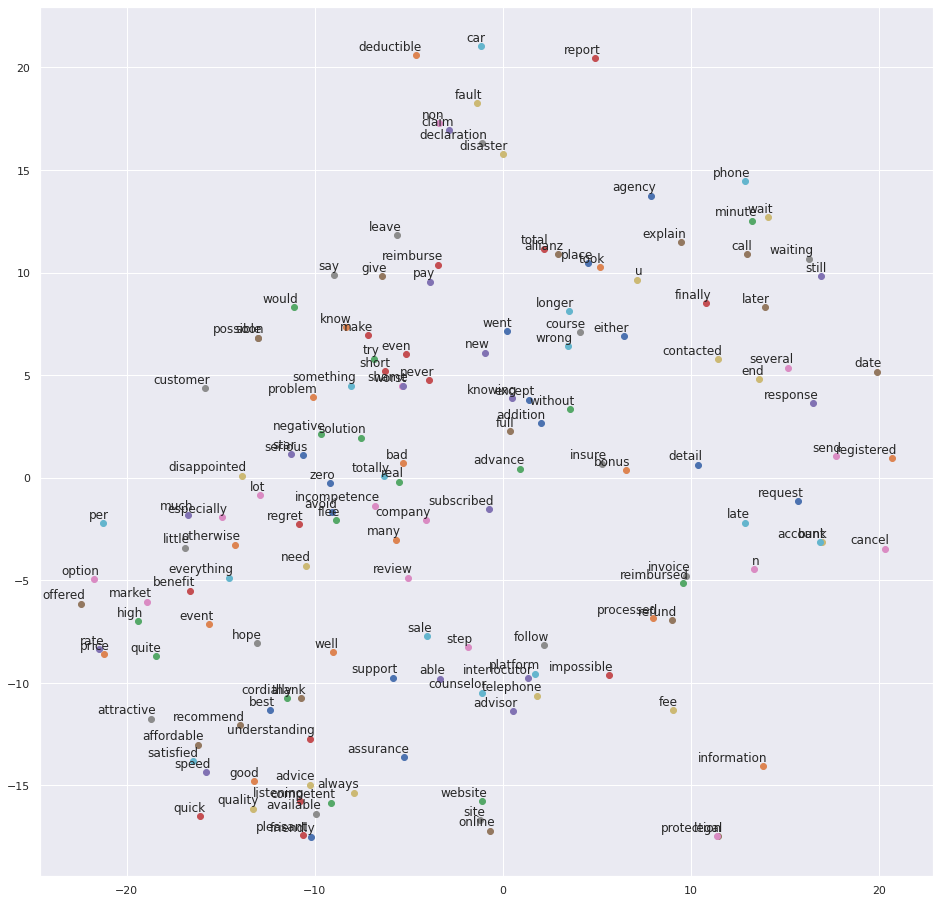

In [ ]:
corpus=[review[1] for review in train.review.iteritems()]
#corpus
model=models.word2vec.Word2Vec(corpus, size=100, window=20, min_count=200, workers=4)
#model.wv.key_to_index
tsne_plot(model,4)

#### On the test set

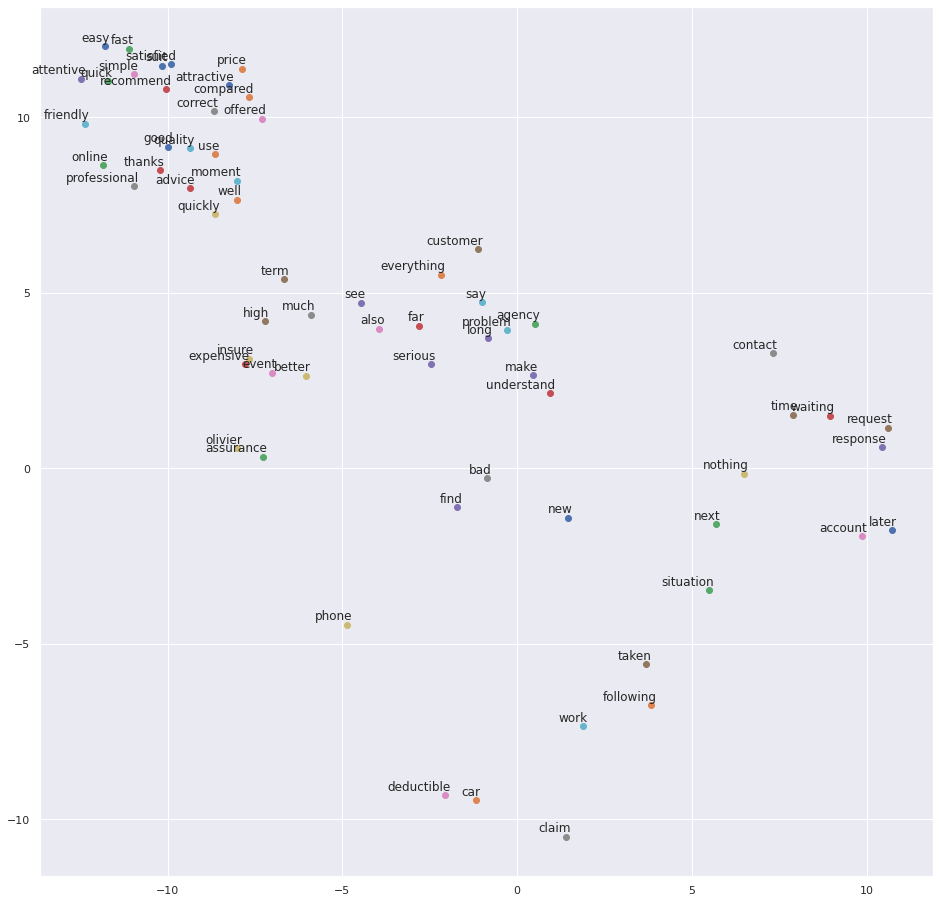

In [ ]:
corpus=[review[1] for review in test.review.iteritems()]
#corpus
model=models.word2vec.Word2Vec(corpus, size=100, window=20, min_count=200, workers=4)
#model.wv.key_to_index
tsne_plot(model,4)

### For each grade 

#### On the train set



******************** TSNE for words of reviews with a grade of 1 ********************
Size of the dataset: 7271 reviews

		TSNE for the reviews in the train set



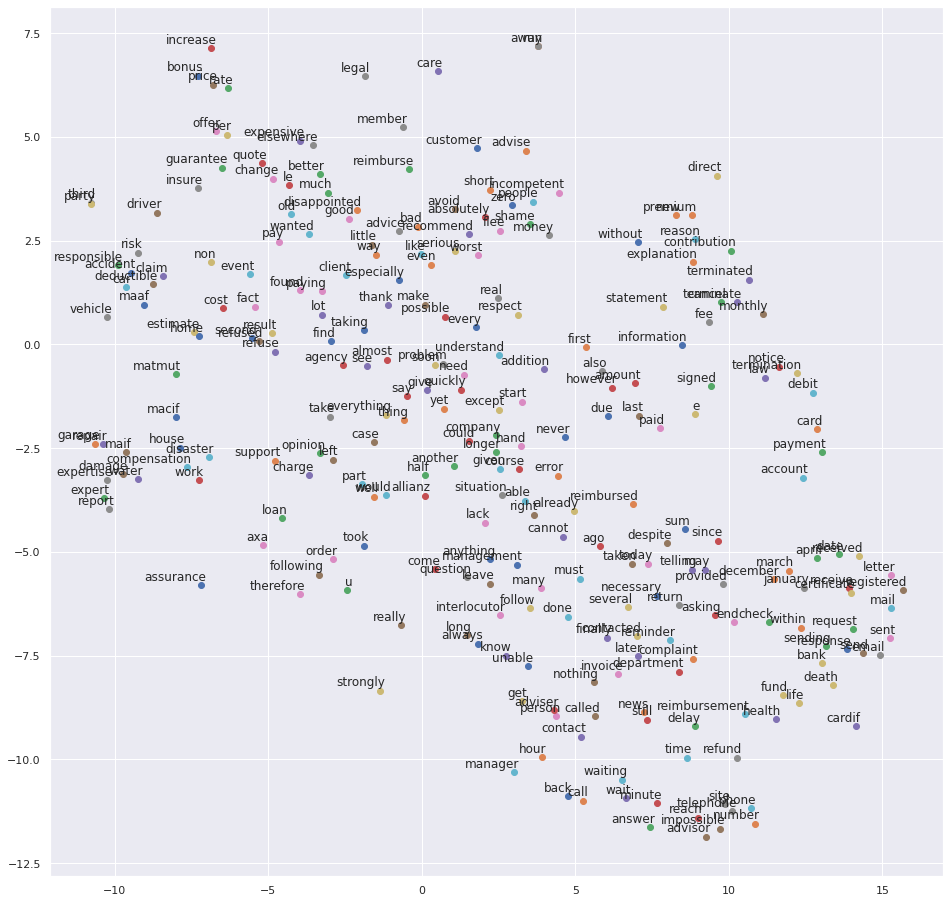



******************** TSNE for words of reviews with a grade of 2 ********************
Size of the dataset: 3717 reviews

		TSNE for the reviews in the train set



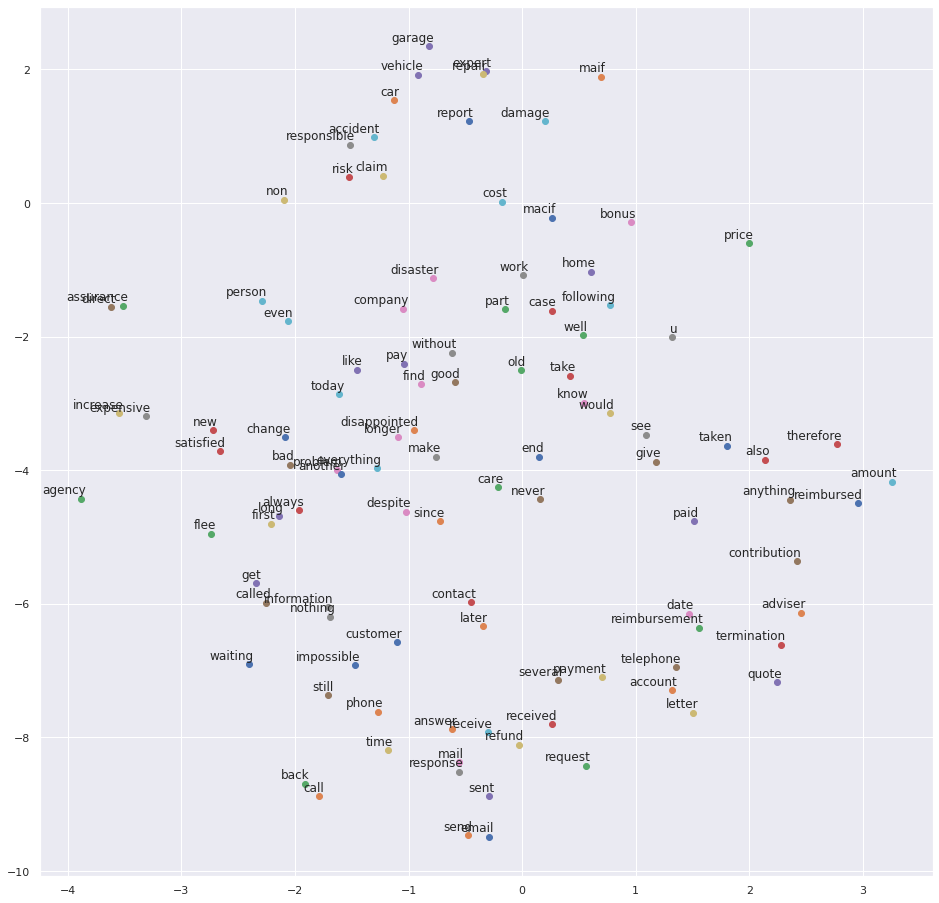



******************** TSNE for words of reviews with a grade of 3 ********************
Size of the dataset: 3382 reviews

		TSNE for the reviews in the train set



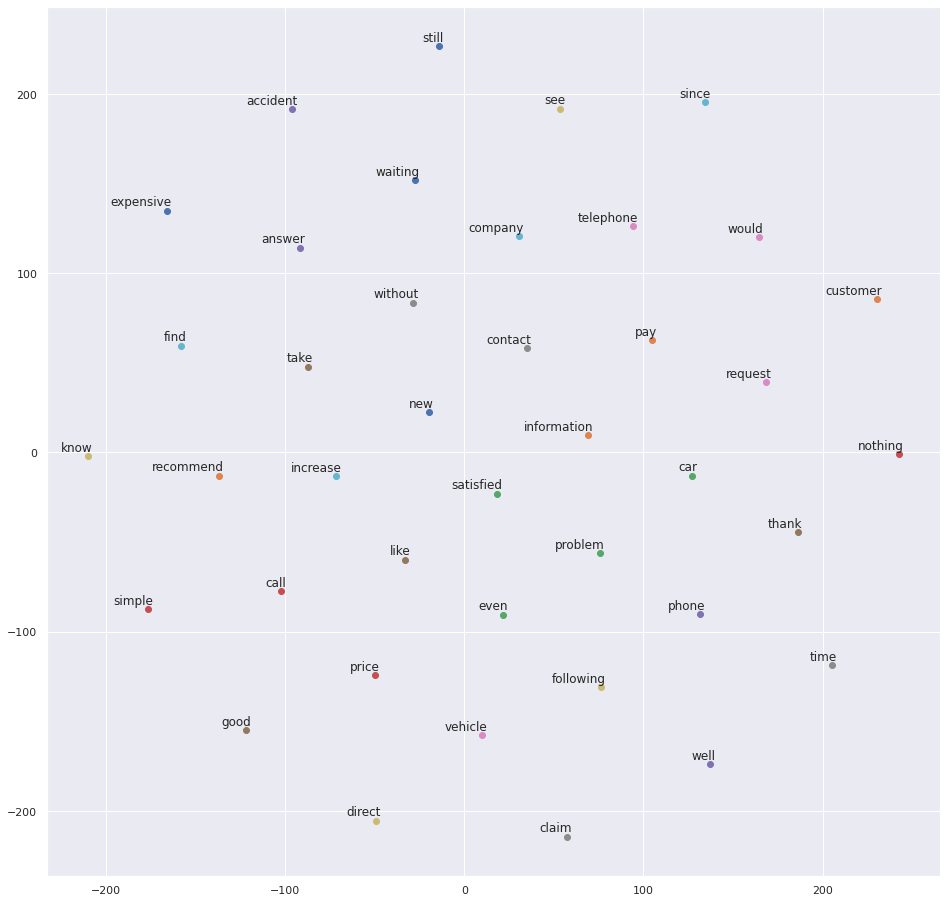



******************** TSNE for words of reviews with a grade of 4 ********************
Size of the dataset: 4885 reviews

		TSNE for the reviews in the train set



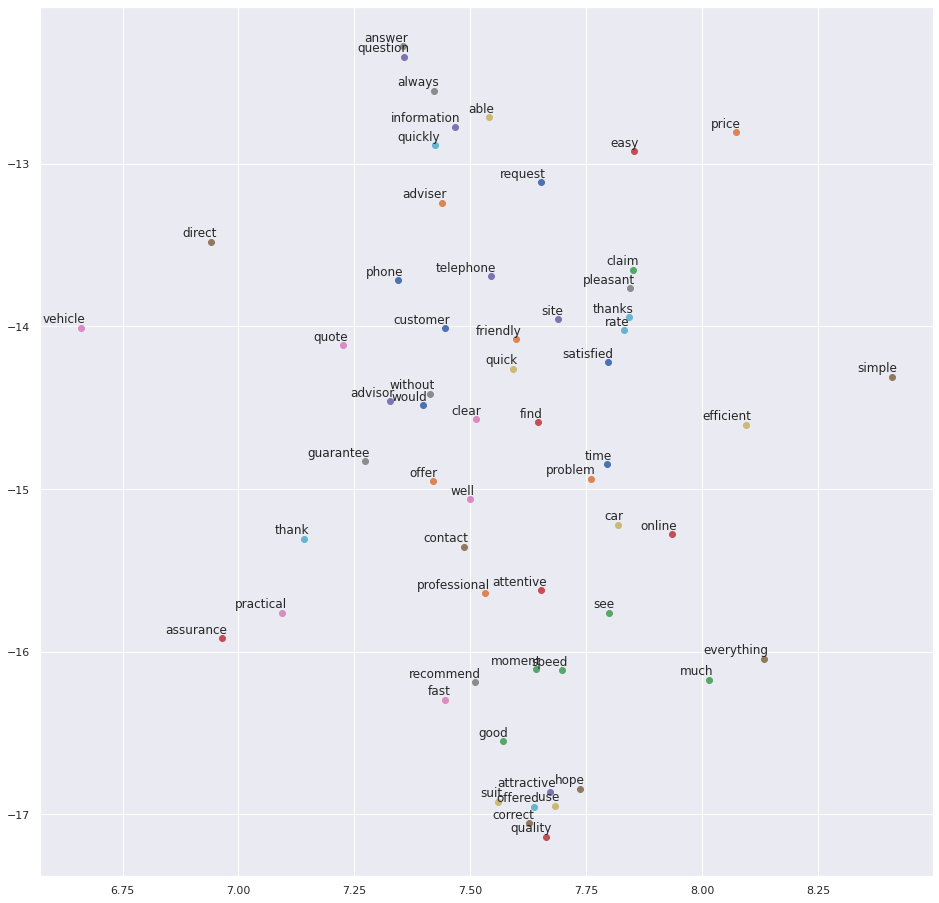



******************** TSNE for words of reviews with a grade of 5 ********************
Size of the dataset: 4850 reviews

		TSNE for the reviews in the train set



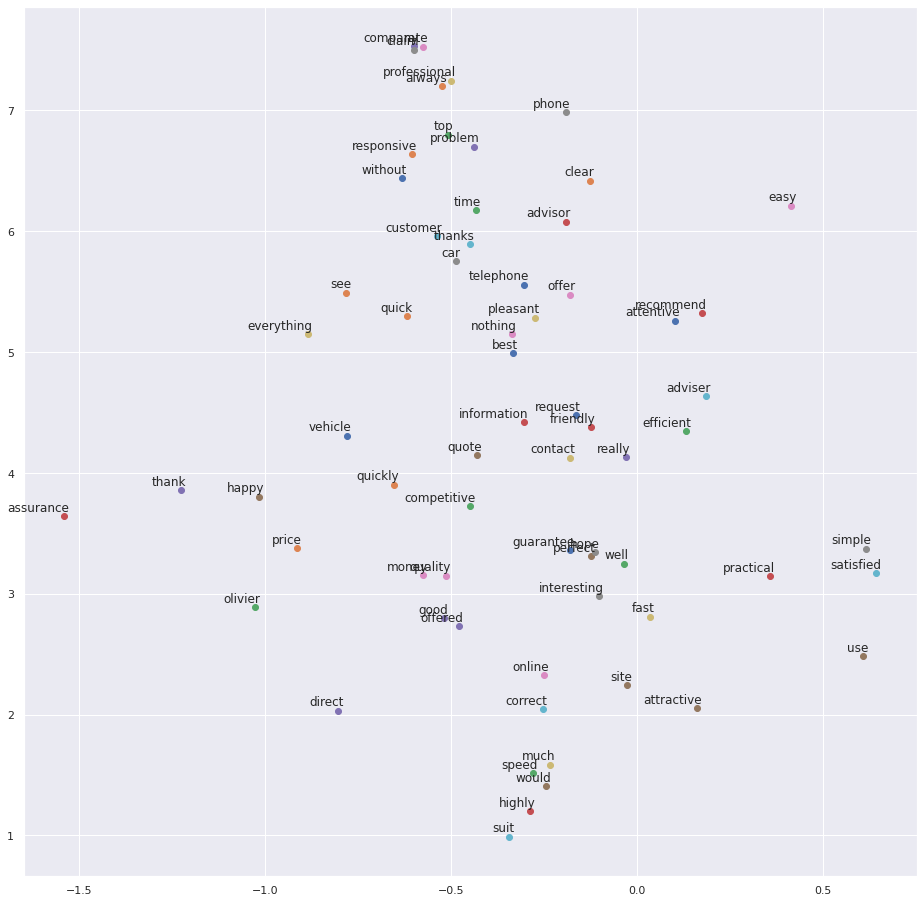

In [ ]:
for grade in np.sort(train.note.unique()):
    print("\n\n******************** TSNE for words of reviews with a grade of "+str(grade)+" ********************")
    train_grade=train[train.note==grade]
    print("Size of the dataset: "+str(train_grade.shape[0])+" reviews\n")
    print("\t\tTSNE for the reviews in the train set\n")
    corpus=[review[1] for review in train_grade.review.iteritems()]
    try:
        model=models.word2vec.Word2Vec(corpus, size=100, window=20, min_count=200, workers=4)
        tsne_plot(model,1)
    except Exception:
        print("No word in the reviews for grade "+str(grade)+" appears 200 times")
        pass
    

### For each product

#### On the train set



******************** TSNE for words of reviews from product animaux ********************
Size of the dataset: 374 reviews

		TSNE for the reviews in the train set

No word in the reviews for animaux appears 200 times


******************** TSNE for words of reviews from product assurances-professionnelles ********************
Size of the dataset: 8 reviews

		TSNE for the reviews in the train set

No word in the reviews for assurances-professionnelles appears 200 times


******************** TSNE for words of reviews from product auto ********************
Size of the dataset: 14077 reviews

		TSNE for the reviews in the train set



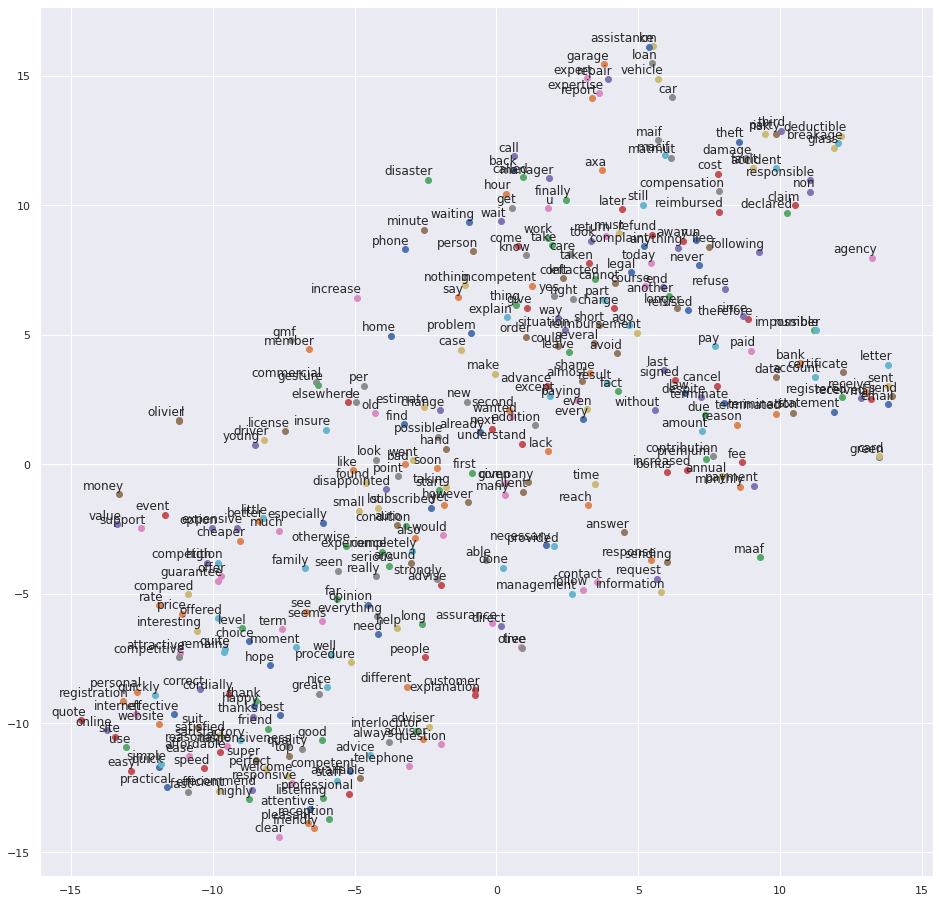



******************** TSNE for words of reviews from product credit ********************
Size of the dataset: 653 reviews

		TSNE for the reviews in the train set

No word in the reviews for credit appears 200 times


******************** TSNE for words of reviews from product flotte-automobile ********************
Size of the dataset: 1 reviews

		TSNE for the reviews in the train set

No word in the reviews for flotte-automobile appears 200 times


******************** TSNE for words of reviews from product garantie-decennale ********************
Size of the dataset: 12 reviews

		TSNE for the reviews in the train set

No word in the reviews for garantie-decennale appears 200 times


******************** TSNE for words of reviews from product habitation ********************
Size of the dataset: 1956 reviews

		TSNE for the reviews in the train set



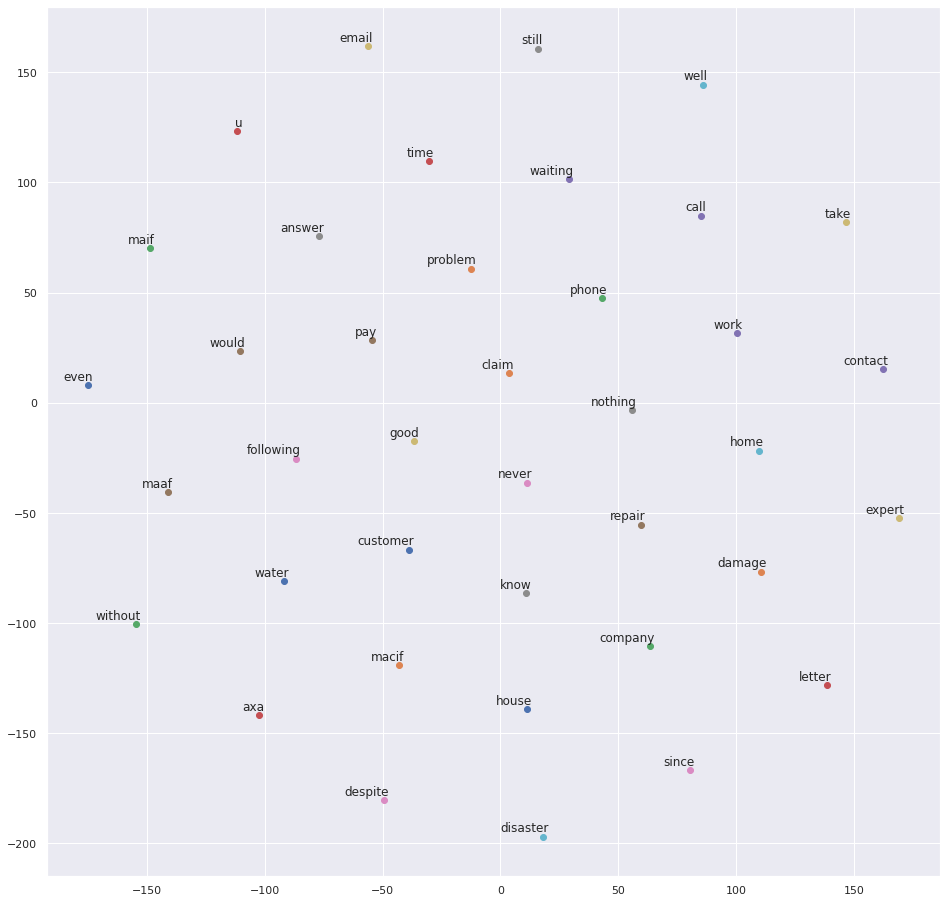



******************** TSNE for words of reviews from product moto ********************
Size of the dataset: 2105 reviews

		TSNE for the reviews in the train set



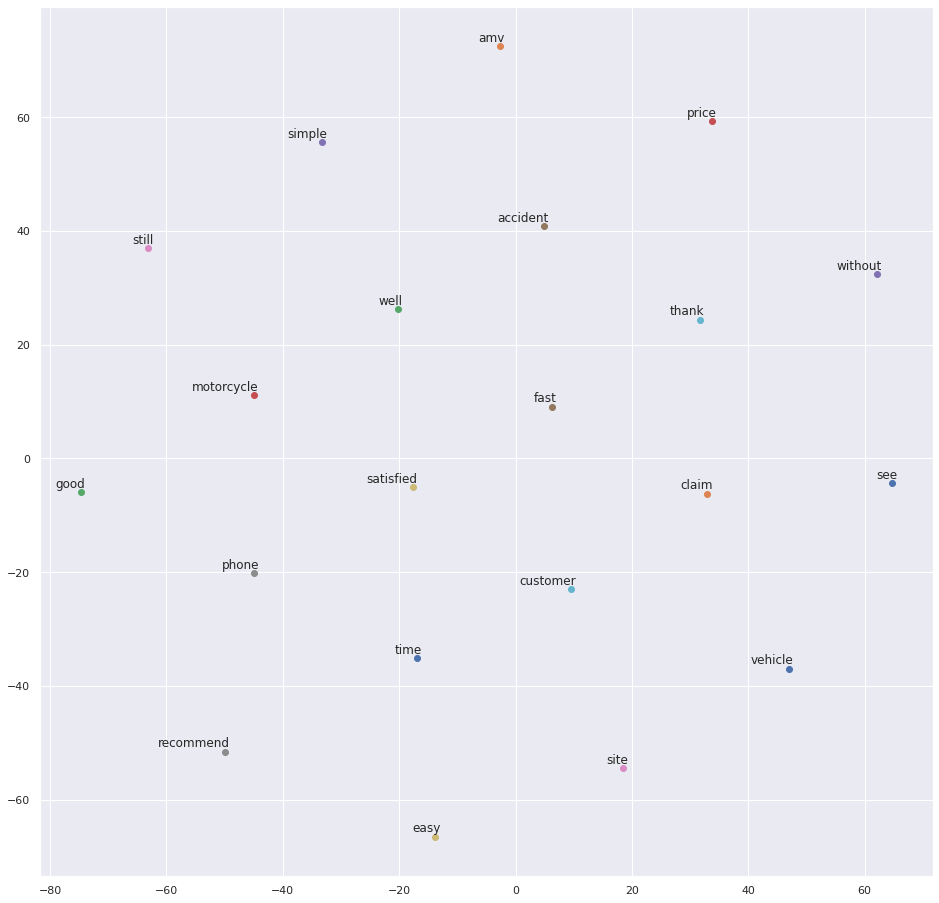



******************** TSNE for words of reviews from product multirisque-professionnelle ********************
Size of the dataset: 20 reviews

		TSNE for the reviews in the train set

No word in the reviews for multirisque-professionnelle appears 200 times


******************** TSNE for words of reviews from product prevoyance ********************
Size of the dataset: 791 reviews

		TSNE for the reviews in the train set



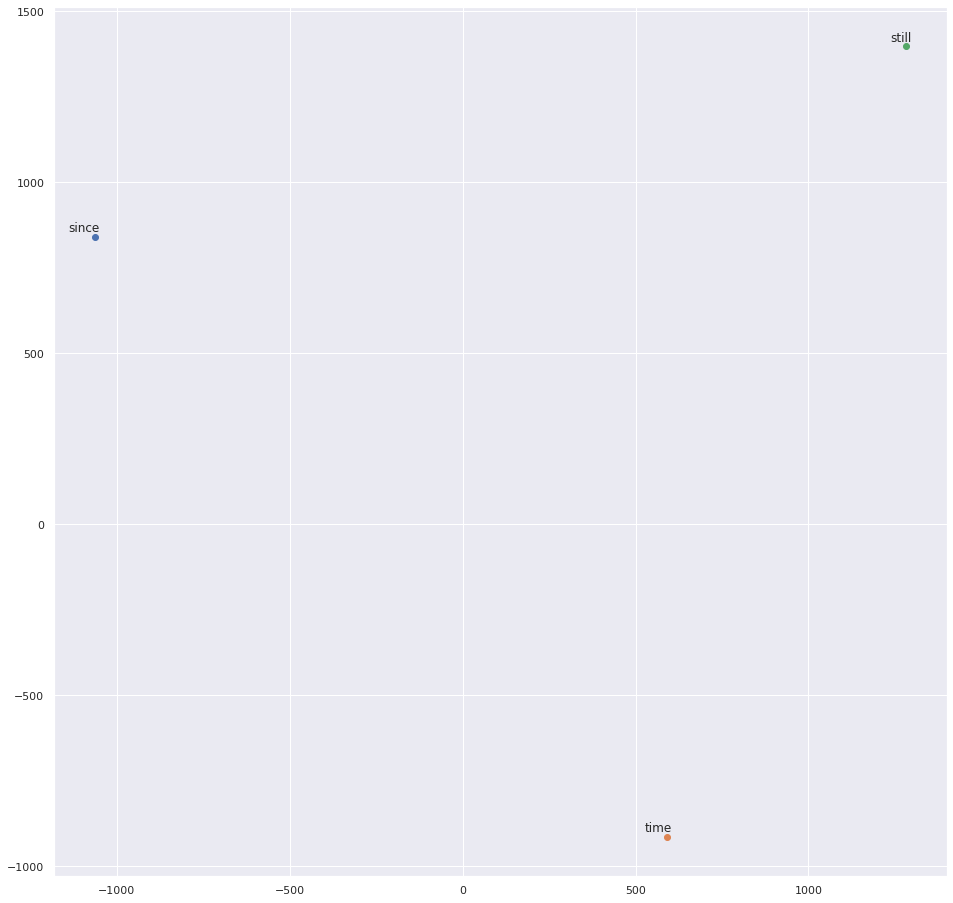



******************** TSNE for words of reviews from product responsabilite-civile-professionnelle ********************
Size of the dataset: 5 reviews

		TSNE for the reviews in the train set

No word in the reviews for responsabilite-civile-professionnelle appears 200 times


******************** TSNE for words of reviews from product sante ********************
Size of the dataset: 3525 reviews

		TSNE for the reviews in the train set



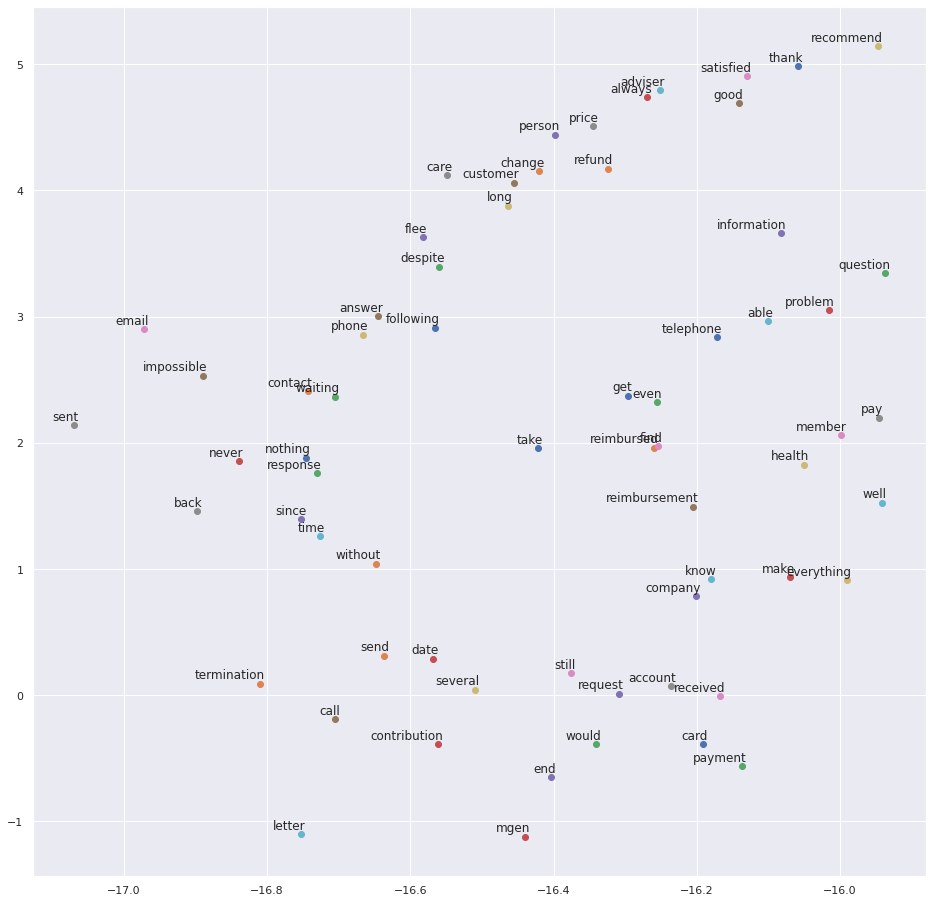



******************** TSNE for words of reviews from product vie ********************
Size of the dataset: 578 reviews

		TSNE for the reviews in the train set

No word in the reviews for vie appears 200 times


In [ ]:
for product in np.sort(train.produit.unique()):
    print("\n\n******************** TSNE for words of reviews from product "+str(product)+" ********************")
    train_grade=train[train.produit==product]
    print("Size of the dataset: "+str(train_grade.shape[0])+" reviews\n")
    print("\t\tTSNE for the reviews in the train set\n")
    corpus=[review[1] for review in train_grade.review.iteritems()]
    try:
        model=models.word2vec.Word2Vec(corpus, size=100, window=20, min_count=200, workers=4)
        tsne_plot(model,1)
    except Exception:
        print("No word in the reviews for "+product+" appears 200 times")
        pass
    

#### On the test set



******************** TSNE for words of reviews from product animaux ********************
Size of the dataset: 149 reviews

		TSNE for the reviews in the test set

No word in the reviews for animaux appears 200 times


******************** TSNE for words of reviews from product assurances-professionnelles ********************
Size of the dataset: 4 reviews

		TSNE for the reviews in the test set

No word in the reviews for assurances-professionnelles appears 200 times


******************** TSNE for words of reviews from product auto ********************
Size of the dataset: 6082 reviews

		TSNE for the reviews in the test set



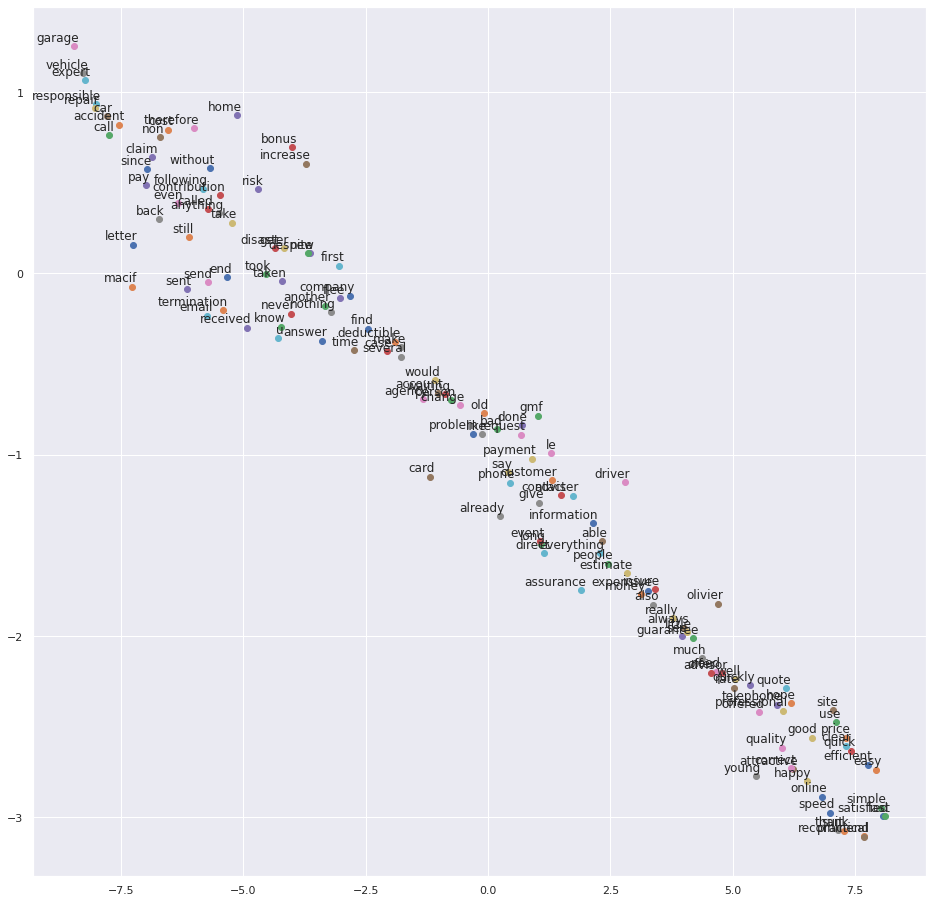



******************** TSNE for words of reviews from product credit ********************
Size of the dataset: 255 reviews

		TSNE for the reviews in the test set

No word in the reviews for credit appears 200 times


******************** TSNE for words of reviews from product flotte-automobile ********************
Size of the dataset: 3 reviews

		TSNE for the reviews in the test set

No word in the reviews for flotte-automobile appears 200 times


******************** TSNE for words of reviews from product garantie-decennale ********************
Size of the dataset: 2 reviews

		TSNE for the reviews in the test set

No word in the reviews for garantie-decennale appears 200 times


******************** TSNE for words of reviews from product habitation ********************
Size of the dataset: 859 reviews

		TSNE for the reviews in the test set



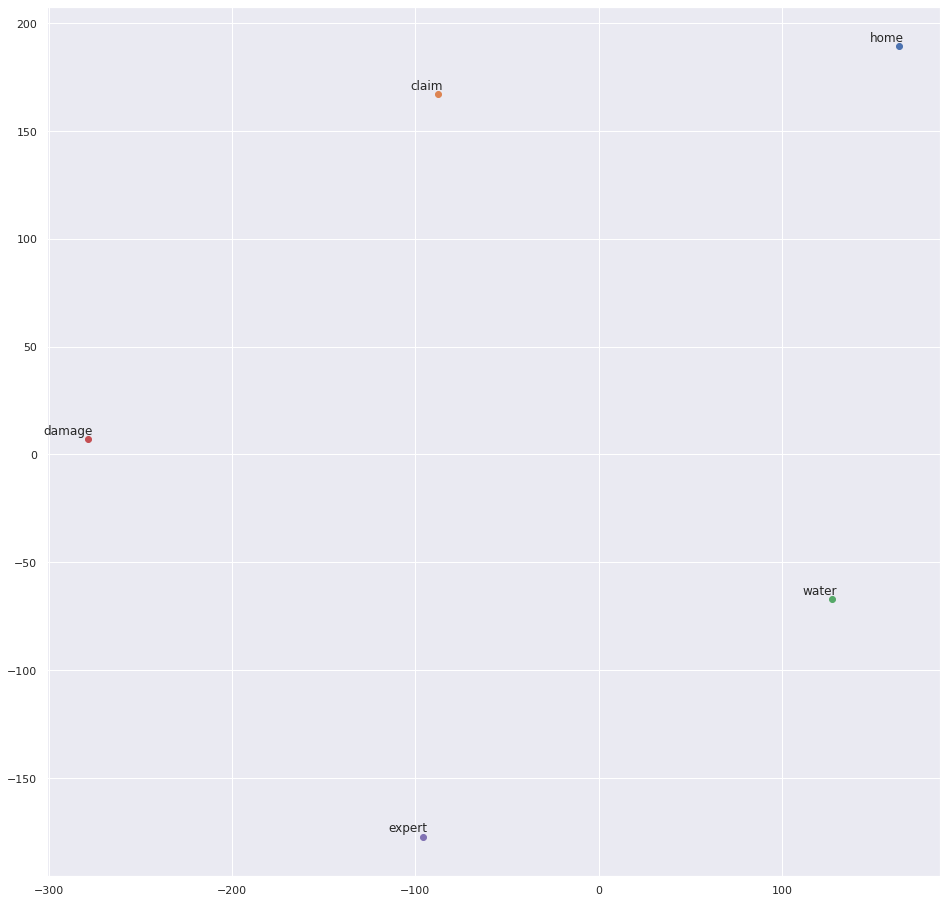



******************** TSNE for words of reviews from product moto ********************
Size of the dataset: 916 reviews

		TSNE for the reviews in the test set



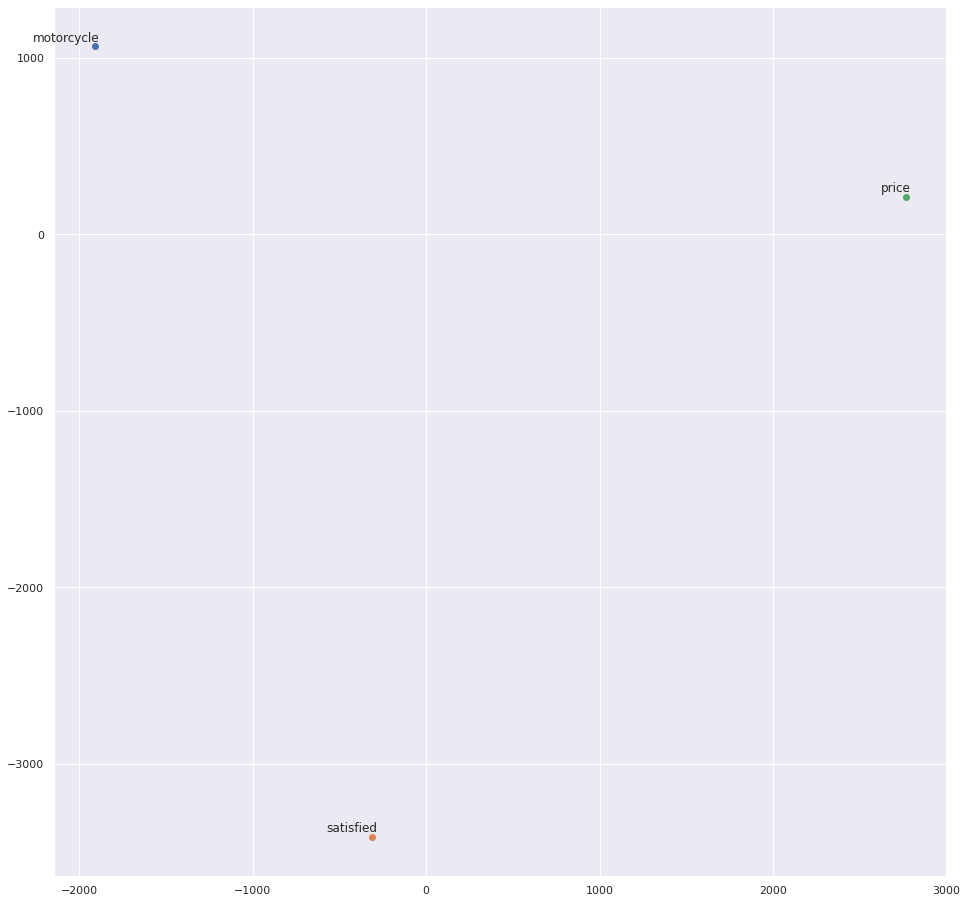



******************** TSNE for words of reviews from product multirisque-professionnelle ********************
Size of the dataset: 4 reviews

		TSNE for the reviews in the test set

No word in the reviews for multirisque-professionnelle appears 200 times


******************** TSNE for words of reviews from product prevoyance ********************
Size of the dataset: 319 reviews

		TSNE for the reviews in the test set

No word in the reviews for prevoyance appears 200 times


******************** TSNE for words of reviews from product responsabilite-civile-professionnelle ********************
Size of the dataset: 5 reviews

		TSNE for the reviews in the test set

No word in the reviews for responsabilite-civile-professionnelle appears 200 times


******************** TSNE for words of reviews from product sante ********************
Size of the dataset: 1477 reviews

		TSNE for the reviews in the test set



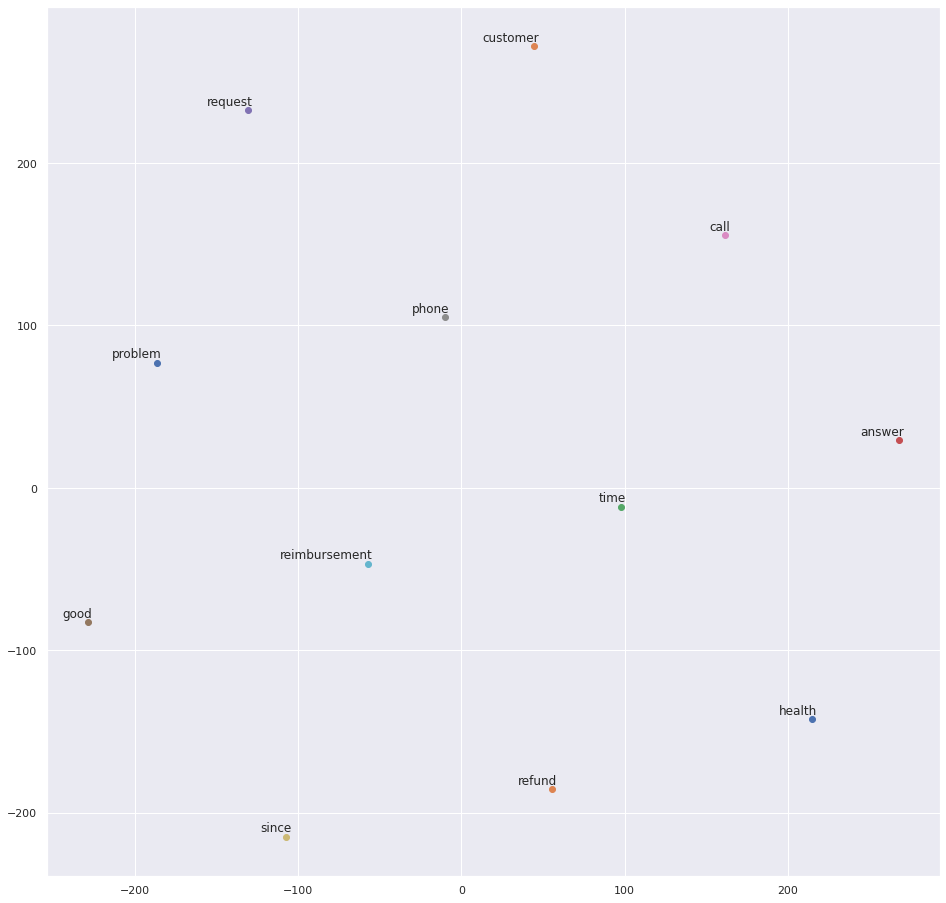



******************** TSNE for words of reviews from product vie ********************
Size of the dataset: 257 reviews

		TSNE for the reviews in the test set

No word in the reviews for vie appears 200 times


In [ ]:
for product in np.sort(test.produit.unique()):
    print("\n\n******************** TSNE for words of reviews from product "+str(product)+" ********************")
    test_grade=test[test.produit==product]
    print("Size of the dataset: "+str(test_grade.shape[0])+" reviews\n")
    print("\t\tTSNE for the reviews in the test set\n")
    corpus=[review[1] for review in test_grade.review.iteritems()]
    try:
        model=models.word2vec.Word2Vec(corpus, size=100, window=20, min_count=200, workers=4)
        tsne_plot(model,1)
    except Exception:
        print("No word in the reviews for "+product+" appears 200 times")
        pass
  

### For each couple grade/product

#### On the train set



******************** TSNE for words of reviews with a grade of 1 ********************

------------------- TSNE for words of reviews about the product animaux -------------------
Size of the dataset: 223 reviews

		TSNE for the reviews in the train set

No word in the reviews for animaux with a grade of 1 appears 200 times

------------------- TSNE for words of reviews about the product assurances-professionnelles -------------------
Size of the dataset: 6 reviews

		TSNE for the reviews in the train set

No word in the reviews for assurances-professionnelles with a grade of 1 appears 200 times

------------------- TSNE for words of reviews about the product auto -------------------
Size of the dataset: 3021 reviews

		TSNE for the reviews in the train set



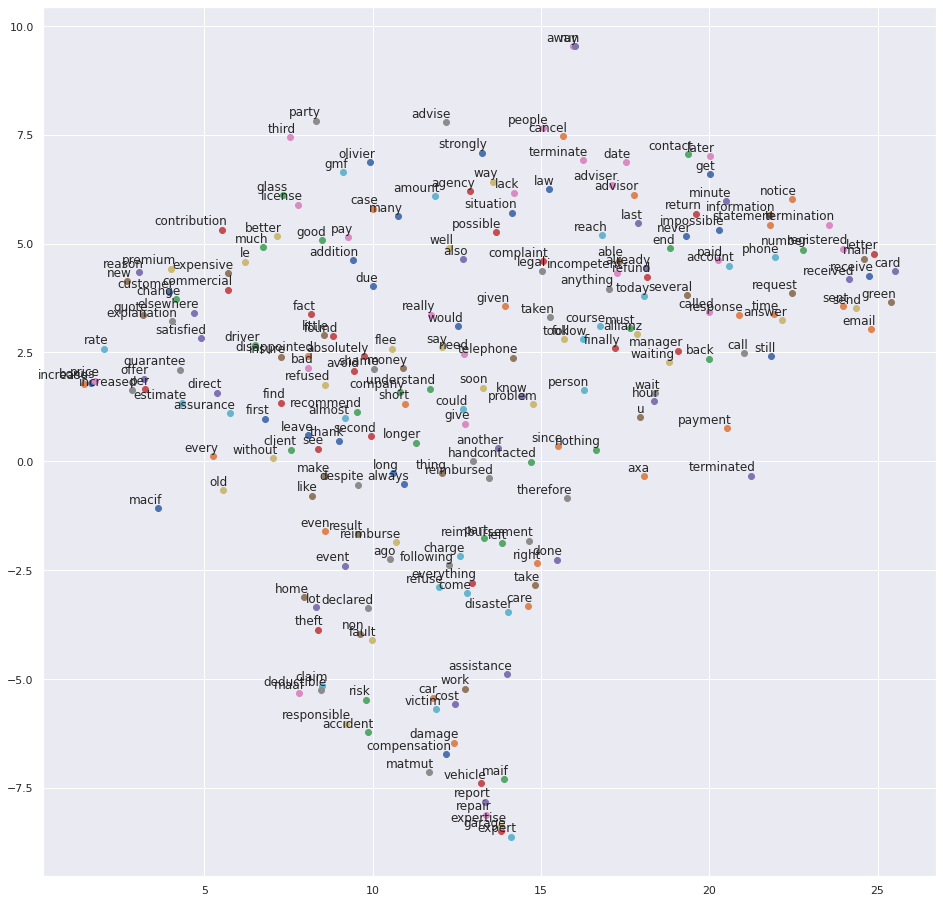


------------------- TSNE for words of reviews about the product credit -------------------
Size of the dataset: 269 reviews

		TSNE for the reviews in the train set



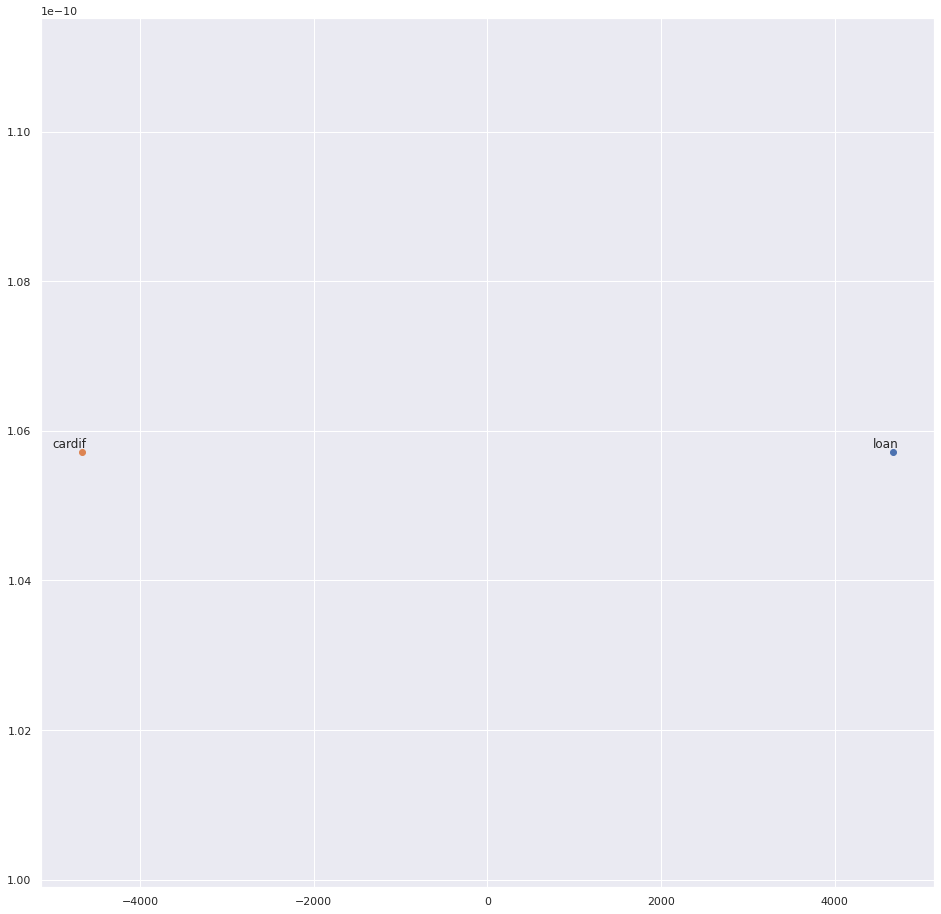


------------------- TSNE for words of reviews about the product flotte-automobile -------------------
Size of the dataset: 1 reviews

		TSNE for the reviews in the train set

No word in the reviews for flotte-automobile with a grade of 1 appears 200 times

------------------- TSNE for words of reviews about the product garantie-decennale -------------------
Size of the dataset: 10 reviews

		TSNE for the reviews in the train set

No word in the reviews for garantie-decennale with a grade of 1 appears 200 times

------------------- TSNE for words of reviews about the product habitation -------------------
Size of the dataset: 1073 reviews

		TSNE for the reviews in the train set



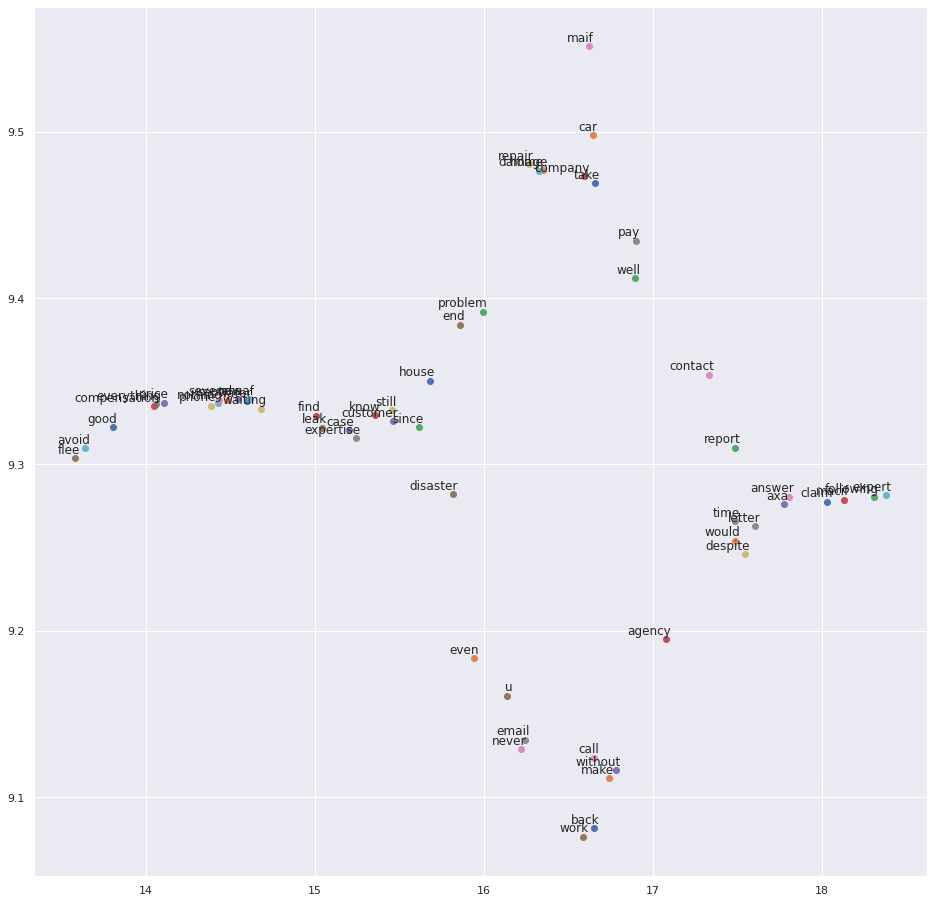


------------------- TSNE for words of reviews about the product moto -------------------
Size of the dataset: 318 reviews

		TSNE for the reviews in the train set

No word in the reviews for moto with a grade of 1 appears 200 times

------------------- TSNE for words of reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 8 reviews

		TSNE for the reviews in the train set

No word in the reviews for multirisque-professionnelle with a grade of 1 appears 200 times

------------------- TSNE for words of reviews about the product prevoyance -------------------
Size of the dataset: 522 reviews

		TSNE for the reviews in the train set



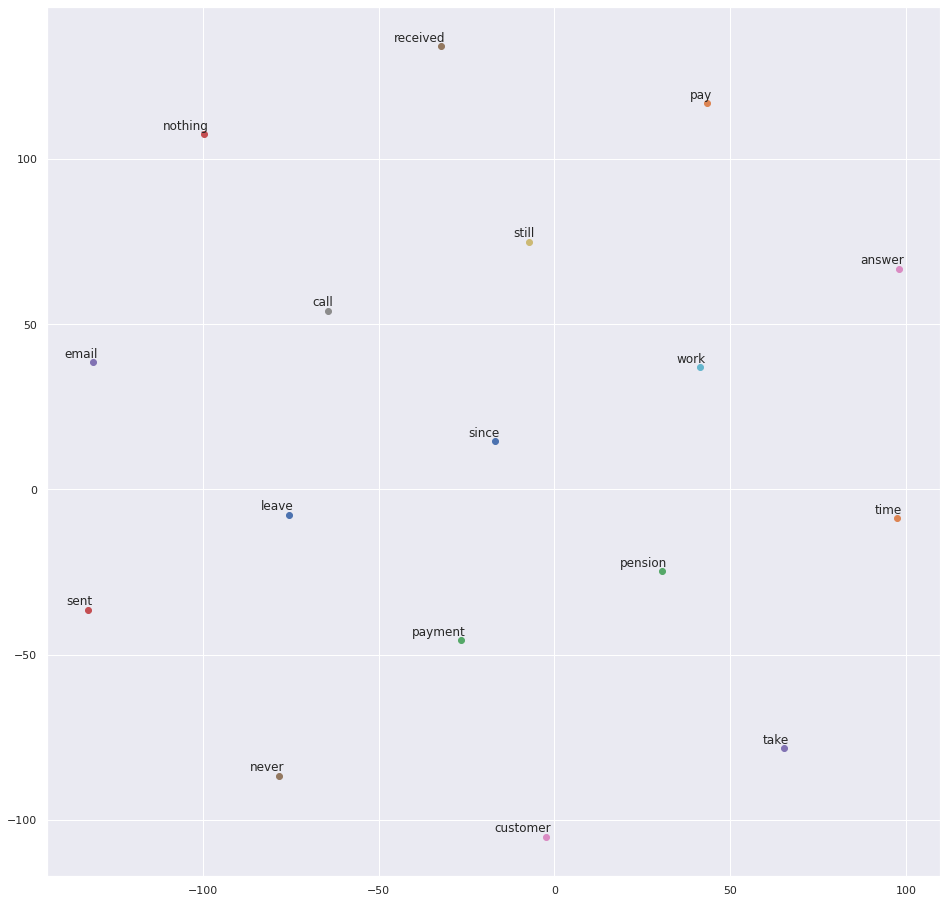


------------------- TSNE for words of reviews about the product responsabilite-civile-professionnelle -------------------
Size of the dataset: 5 reviews

		TSNE for the reviews in the train set

No word in the reviews for responsabilite-civile-professionnelle with a grade of 1 appears 200 times

------------------- TSNE for words of reviews about the product sante -------------------
Size of the dataset: 1408 reviews

		TSNE for the reviews in the train set



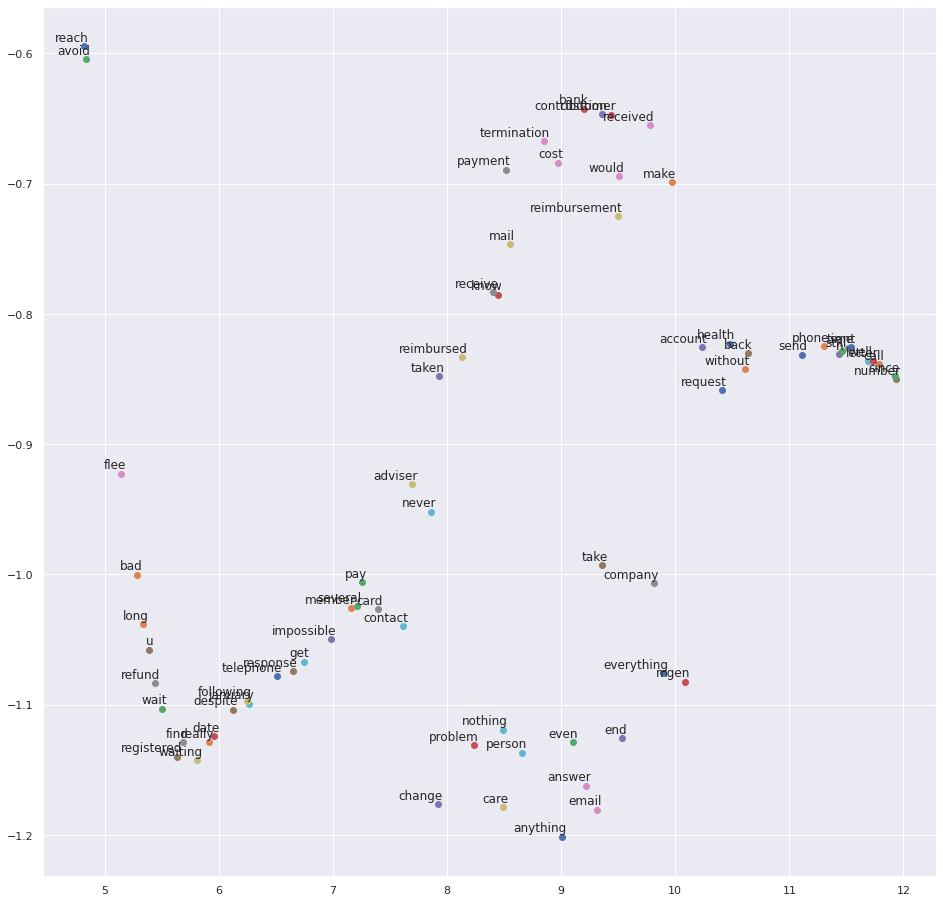


------------------- TSNE for words of reviews about the product vie -------------------
Size of the dataset: 407 reviews

		TSNE for the reviews in the train set



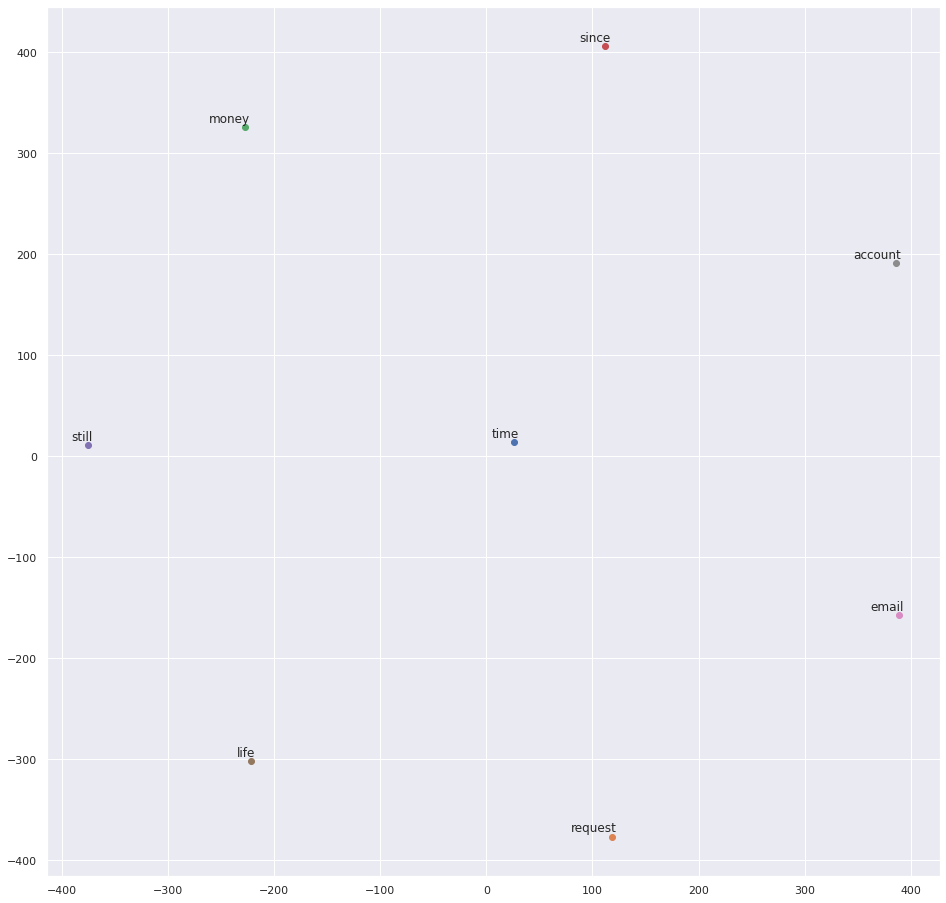



******************** TSNE for words of reviews with a grade of 2 ********************

------------------- TSNE for words of reviews about the product animaux -------------------
Size of the dataset: 70 reviews

		TSNE for the reviews in the train set

No word in the reviews for animaux with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product assurances-professionnelles -------------------
Size of the dataset: 2 reviews

		TSNE for the reviews in the train set

No word in the reviews for assurances-professionnelles with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product auto -------------------
Size of the dataset: 2094 reviews

		TSNE for the reviews in the train set



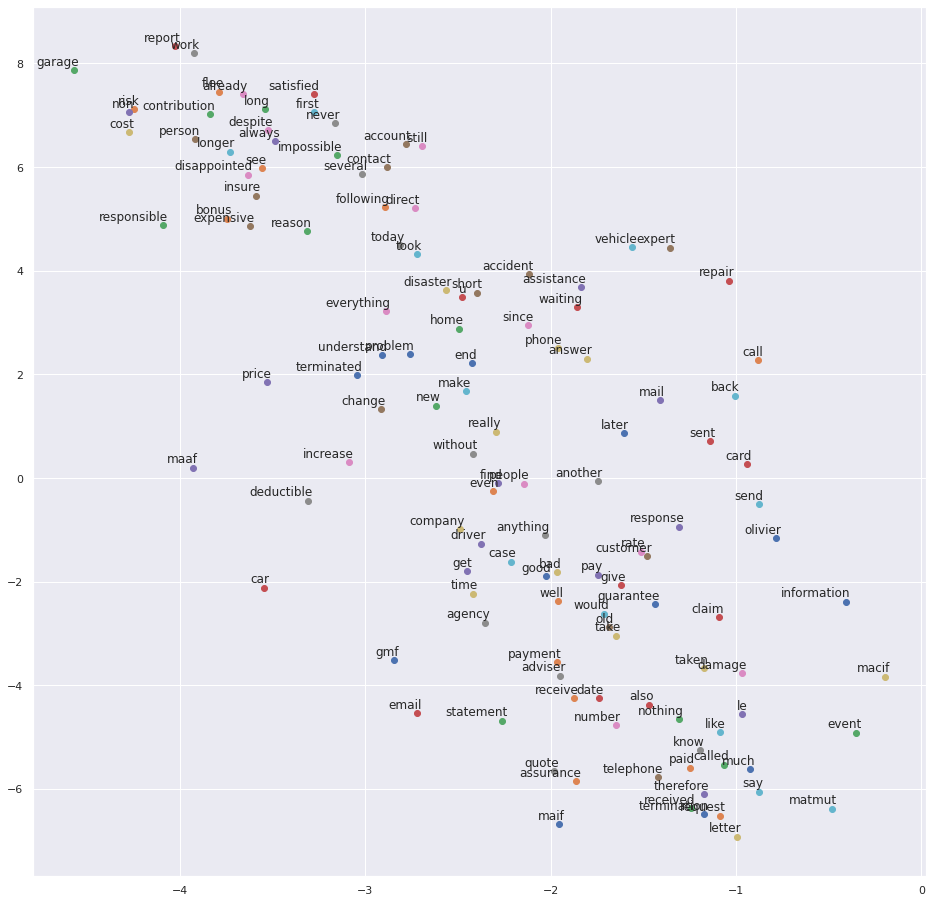


------------------- TSNE for words of reviews about the product credit -------------------
Size of the dataset: 97 reviews

		TSNE for the reviews in the train set

No word in the reviews for credit with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product flotte-automobile -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for flotte-automobile with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product garantie-decennale -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for garantie-decennale with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product habitation -------------------
Size of the dataset: 534 reviews

		TSNE for the reviews in the train set



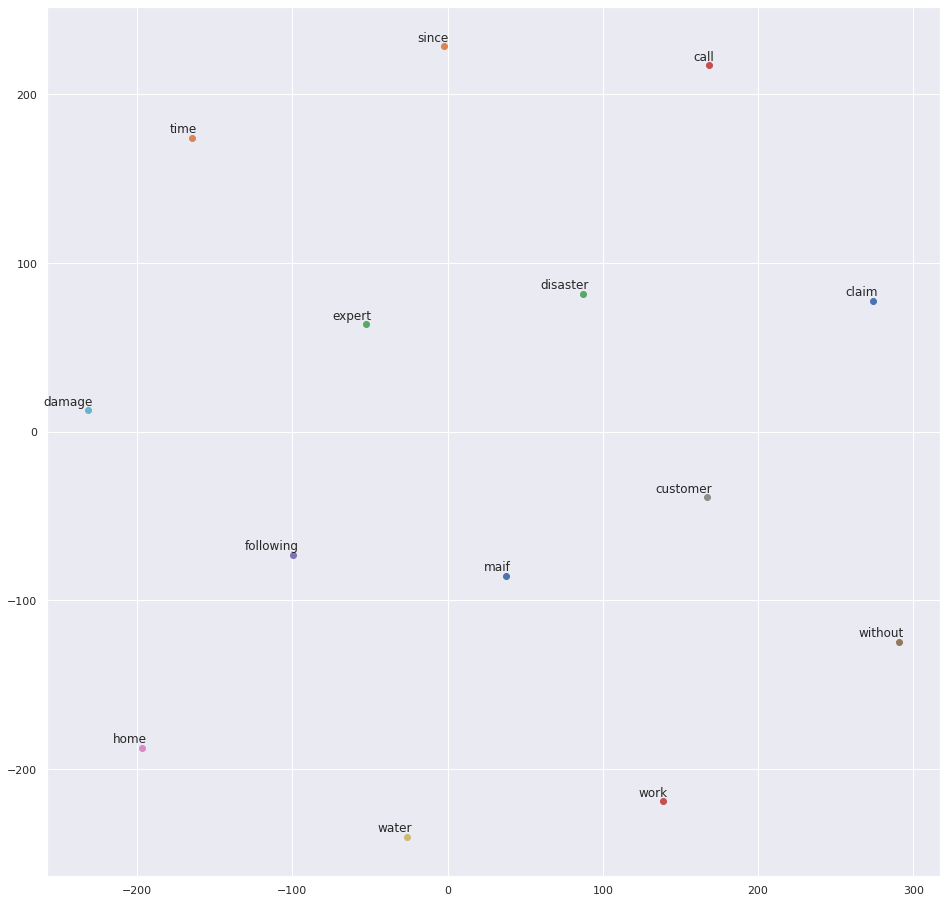


------------------- TSNE for words of reviews about the product moto -------------------
Size of the dataset: 267 reviews

		TSNE for the reviews in the train set



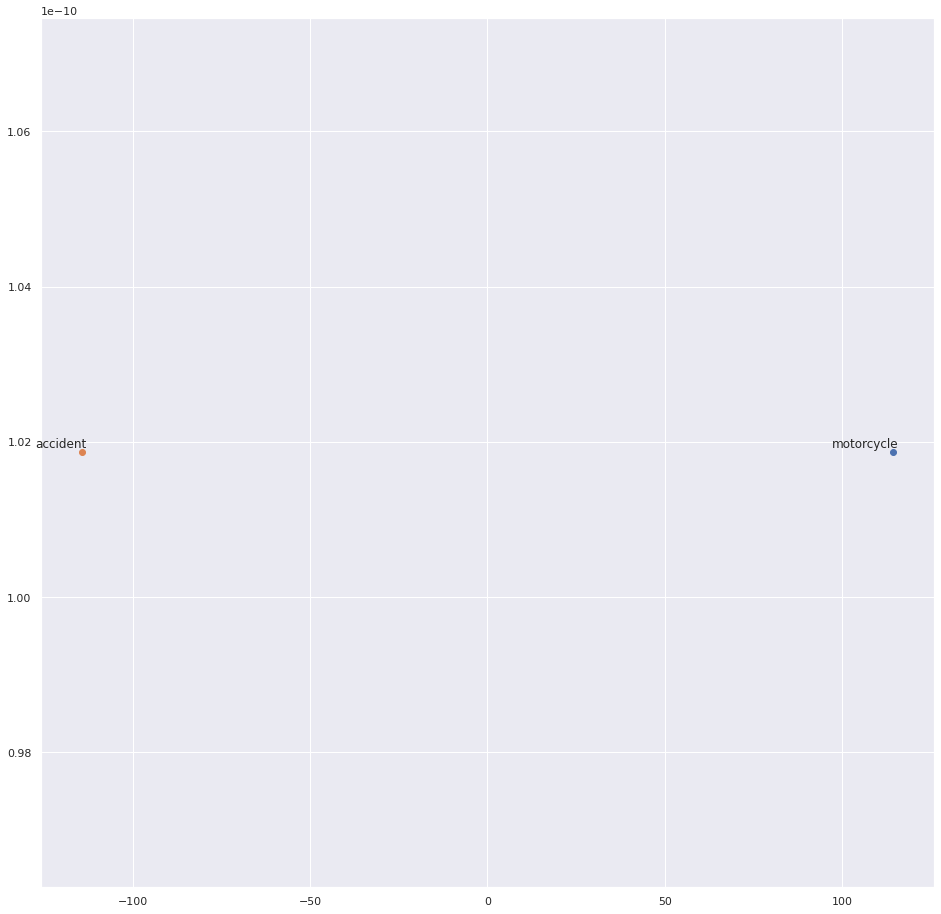


------------------- TSNE for words of reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 1 reviews

		TSNE for the reviews in the train set

No word in the reviews for multirisque-professionnelle with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product prevoyance -------------------
Size of the dataset: 119 reviews

		TSNE for the reviews in the train set

No word in the reviews for prevoyance with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product responsabilite-civile-professionnelle -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for responsabilite-civile-professionnelle with a grade of 2 appears 200 times

------------------- TSNE for words of reviews about the product sante -------------------
Size of the dataset: 443 reviews

		TSNE for the reviews in the train set



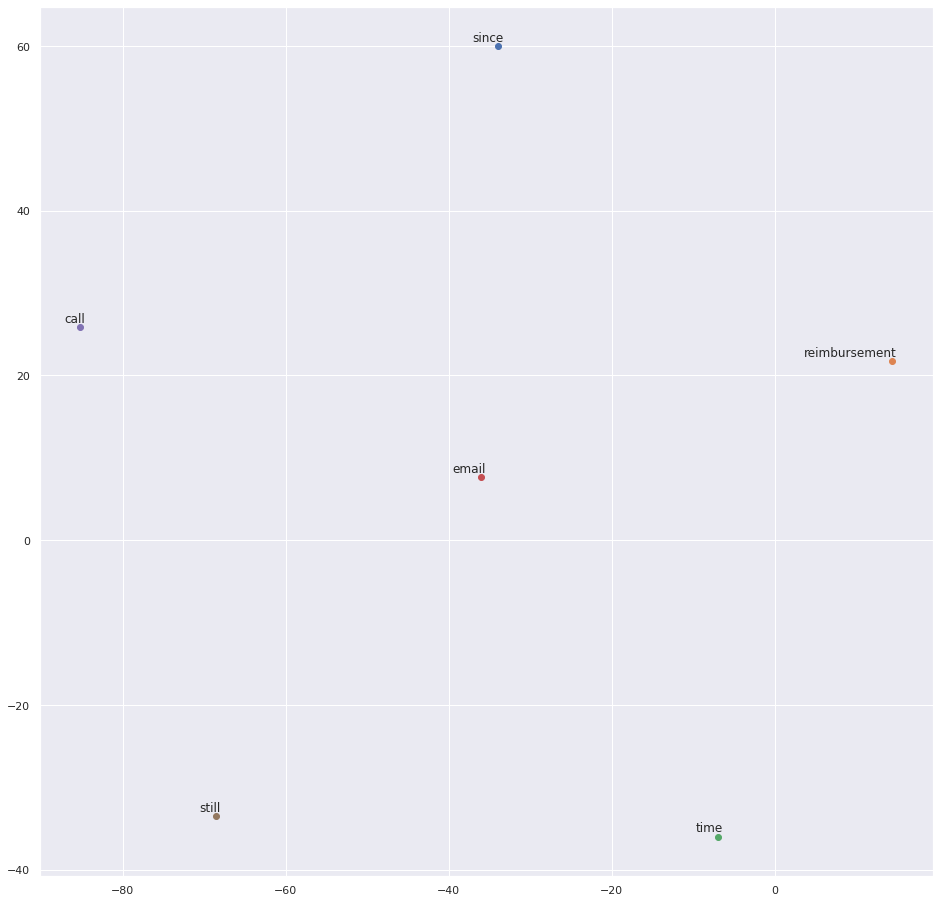


------------------- TSNE for words of reviews about the product vie -------------------
Size of the dataset: 90 reviews

		TSNE for the reviews in the train set

No word in the reviews for vie with a grade of 2 appears 200 times


******************** TSNE for words of reviews with a grade of 3 ********************

------------------- TSNE for words of reviews about the product animaux -------------------
Size of the dataset: 33 reviews

		TSNE for the reviews in the train set

No word in the reviews for animaux with a grade of 3 appears 200 times

------------------- TSNE for words of reviews about the product assurances-professionnelles -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for assurances-professionnelles with a grade of 3 appears 200 times

------------------- TSNE for words of reviews about the product auto -------------------
Size of the dataset: 2158 reviews

		TSNE for the reviews in the train set



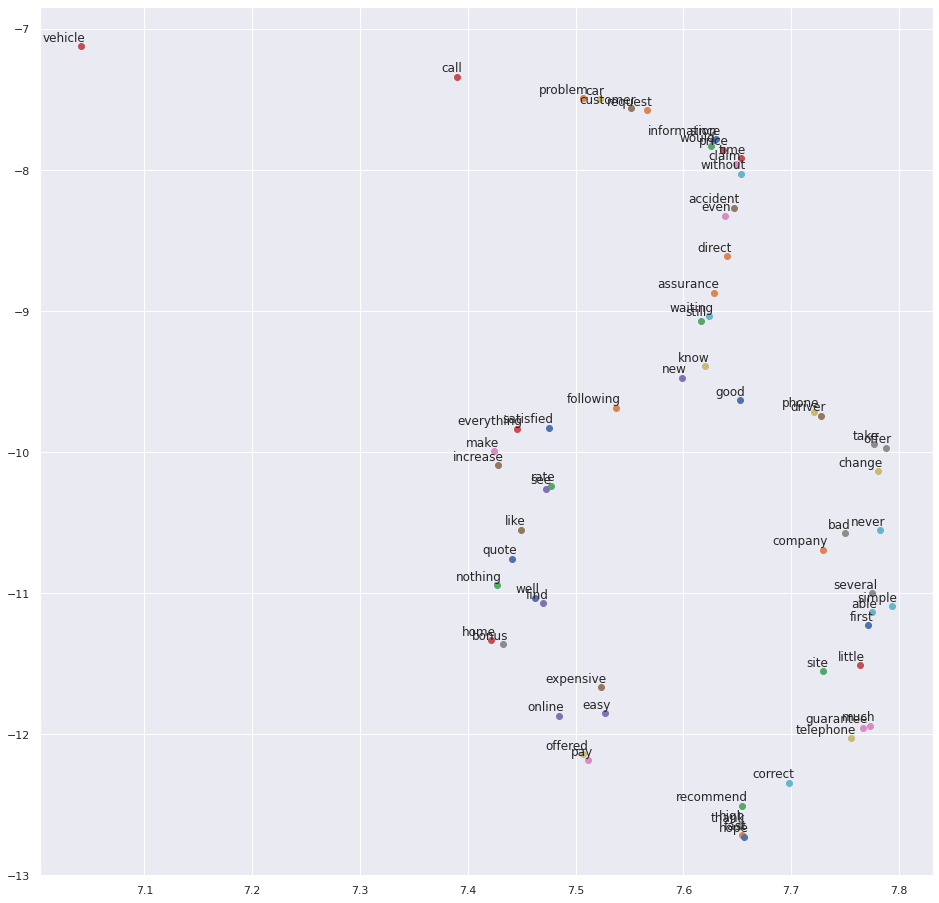


------------------- TSNE for words of reviews about the product credit -------------------
Size of the dataset: 46 reviews

		TSNE for the reviews in the train set

No word in the reviews for credit with a grade of 3 appears 200 times

------------------- TSNE for words of reviews about the product flotte-automobile -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for flotte-automobile with a grade of 3 appears 200 times

------------------- TSNE for words of reviews about the product garantie-decennale -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for garantie-decennale with a grade of 3 appears 200 times

------------------- TSNE for words of reviews about the product habitation -------------------
Size of the dataset: 195 reviews

		TSNE for the reviews in the train set

No word in the reviews for habitation with a grade of 3 appears 200 times

--

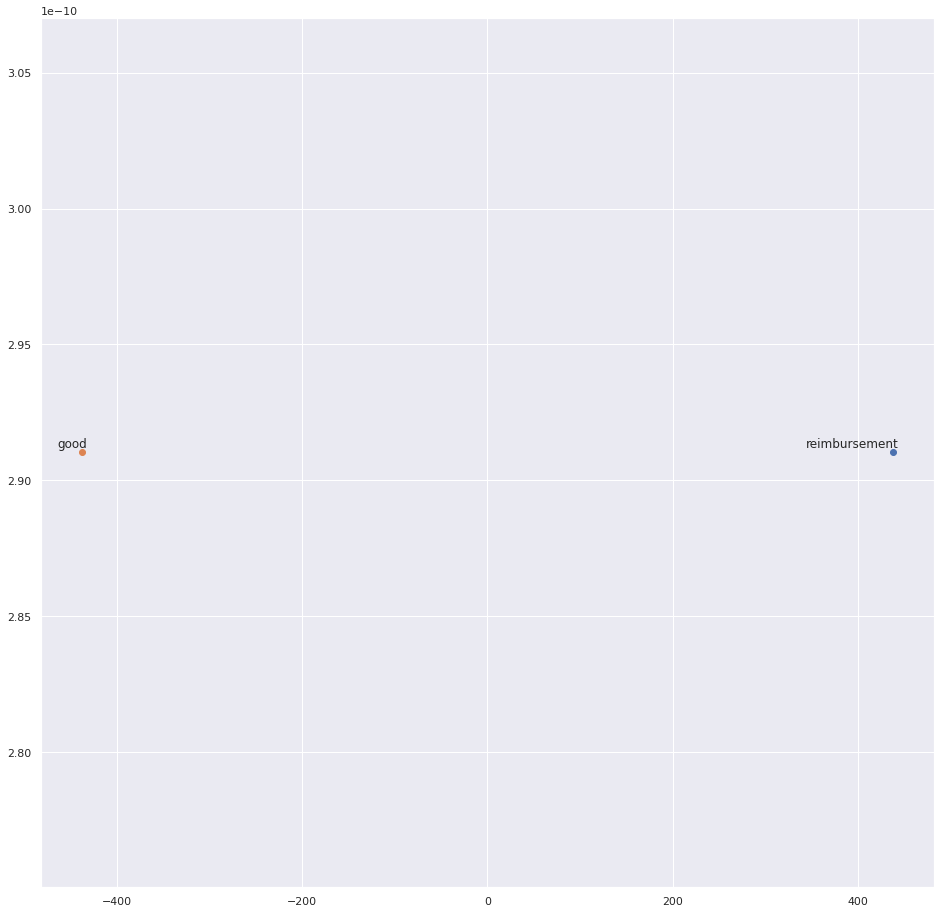


------------------- TSNE for words of reviews about the product vie -------------------
Size of the dataset: 63 reviews

		TSNE for the reviews in the train set

No word in the reviews for vie with a grade of 3 appears 200 times


******************** TSNE for words of reviews with a grade of 4 ********************

------------------- TSNE for words of reviews about the product animaux -------------------
Size of the dataset: 21 reviews

		TSNE for the reviews in the train set

No word in the reviews for animaux with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product assurances-professionnelles -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for assurances-professionnelles with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product auto -------------------
Size of the dataset: 3426 reviews

		TSNE for the reviews in the train set



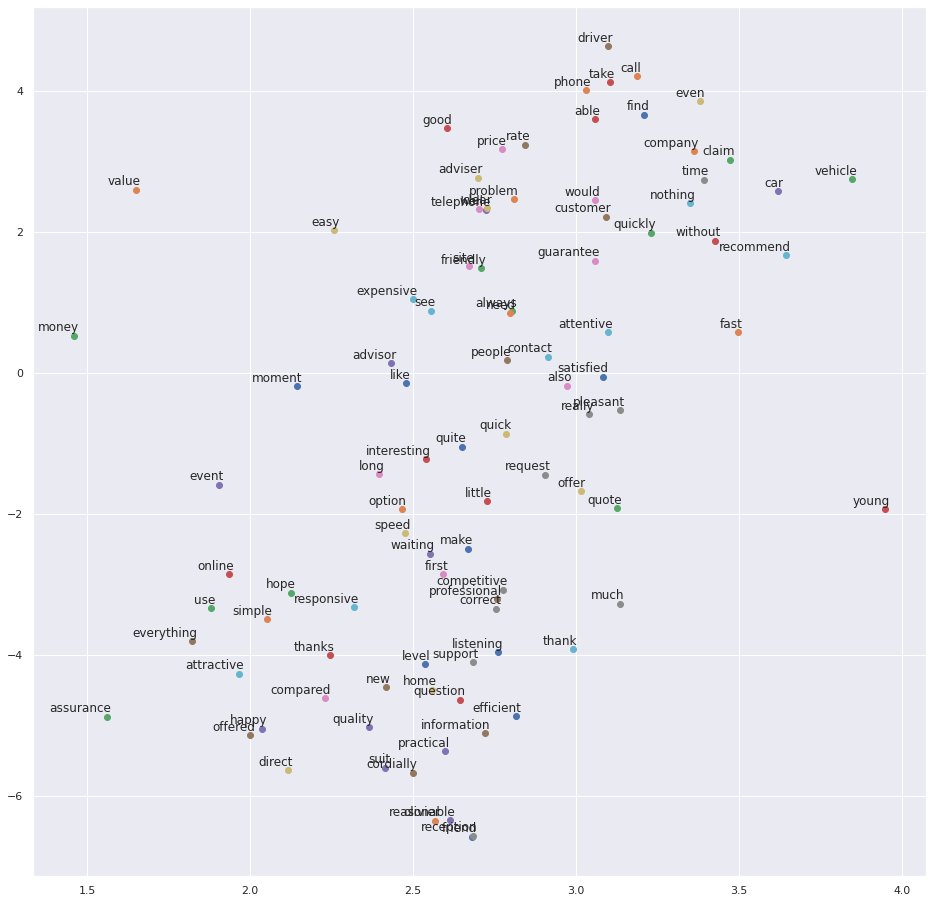


------------------- TSNE for words of reviews about the product credit -------------------
Size of the dataset: 77 reviews

		TSNE for the reviews in the train set

No word in the reviews for credit with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product flotte-automobile -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for flotte-automobile with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product garantie-decennale -------------------
Size of the dataset: 1 reviews

		TSNE for the reviews in the train set

No word in the reviews for garantie-decennale with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product habitation -------------------
Size of the dataset: 95 reviews

		TSNE for the reviews in the train set

No word in the reviews for habitation with a grade of 4 appears 200 times

---

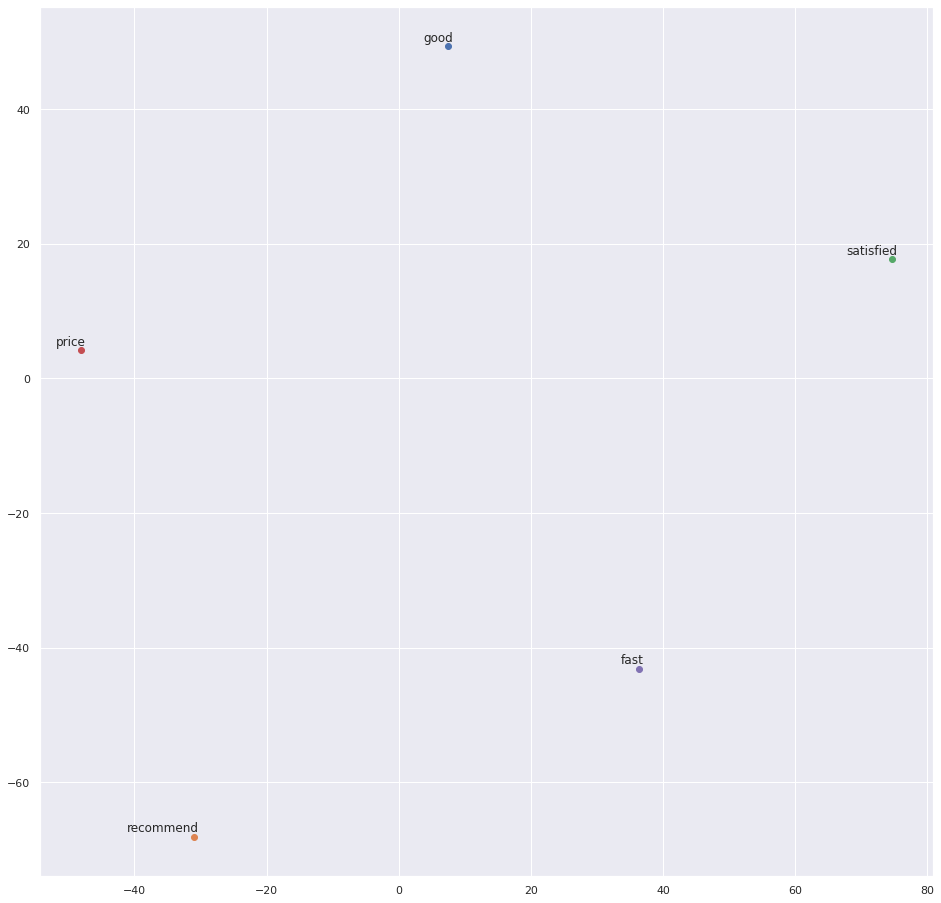


------------------- TSNE for words of reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 8 reviews

		TSNE for the reviews in the train set

No word in the reviews for multirisque-professionnelle with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product prevoyance -------------------
Size of the dataset: 34 reviews

		TSNE for the reviews in the train set

No word in the reviews for prevoyance with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product responsabilite-civile-professionnelle -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for responsabilite-civile-professionnelle with a grade of 4 appears 200 times

------------------- TSNE for words of reviews about the product sante -------------------
Size of the dataset: 663 reviews

		TSNE for the reviews in the train set



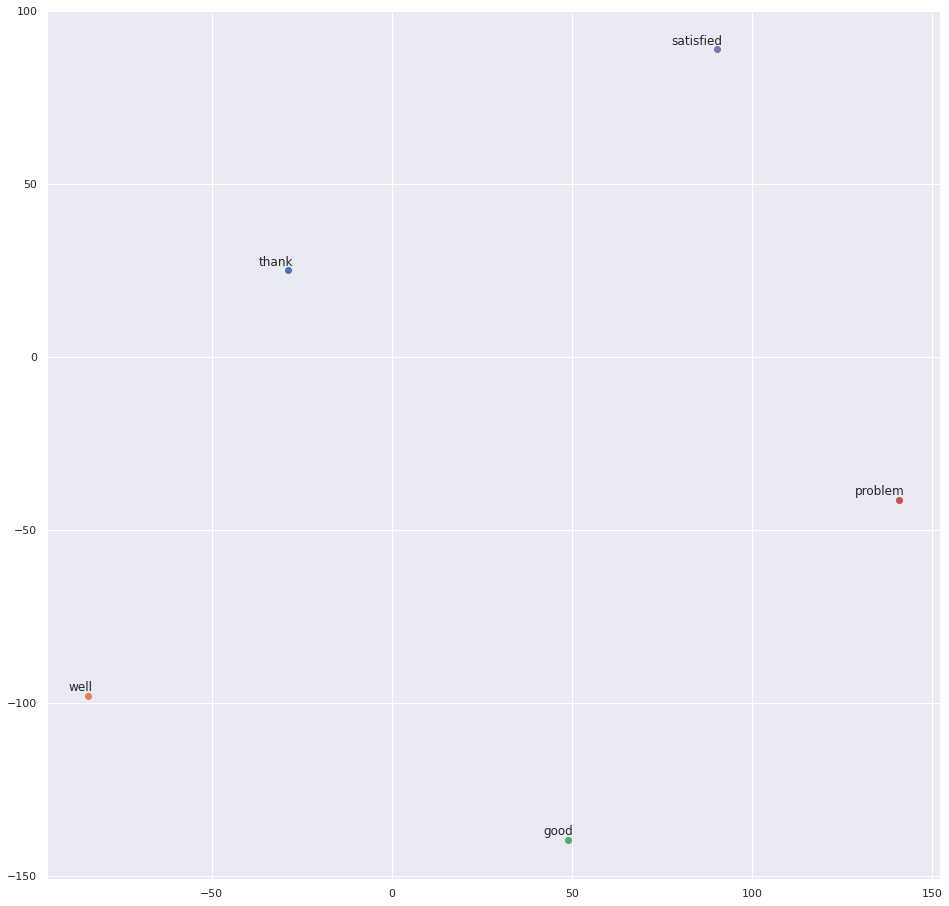


------------------- TSNE for words of reviews about the product vie -------------------
Size of the dataset: 12 reviews

		TSNE for the reviews in the train set

No word in the reviews for vie with a grade of 4 appears 200 times


******************** TSNE for words of reviews with a grade of 5 ********************

------------------- TSNE for words of reviews about the product animaux -------------------
Size of the dataset: 27 reviews

		TSNE for the reviews in the train set

No word in the reviews for animaux with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product assurances-professionnelles -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for assurances-professionnelles with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product auto -------------------
Size of the dataset: 3378 reviews

		TSNE for the reviews in the train set



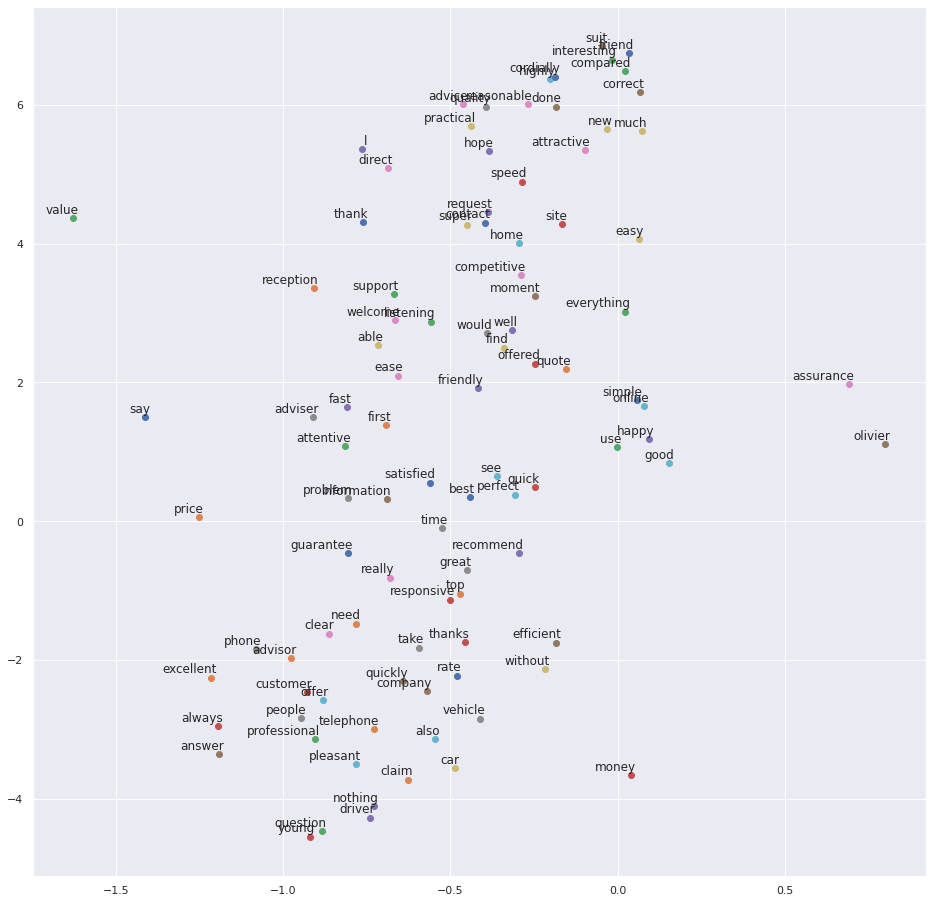


------------------- TSNE for words of reviews about the product credit -------------------
Size of the dataset: 164 reviews

		TSNE for the reviews in the train set

No word in the reviews for credit with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product flotte-automobile -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for flotte-automobile with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product garantie-decennale -------------------
Size of the dataset: 1 reviews

		TSNE for the reviews in the train set

No word in the reviews for garantie-decennale with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product habitation -------------------
Size of the dataset: 59 reviews

		TSNE for the reviews in the train set

No word in the reviews for habitation with a grade of 5 appears 200 times

--

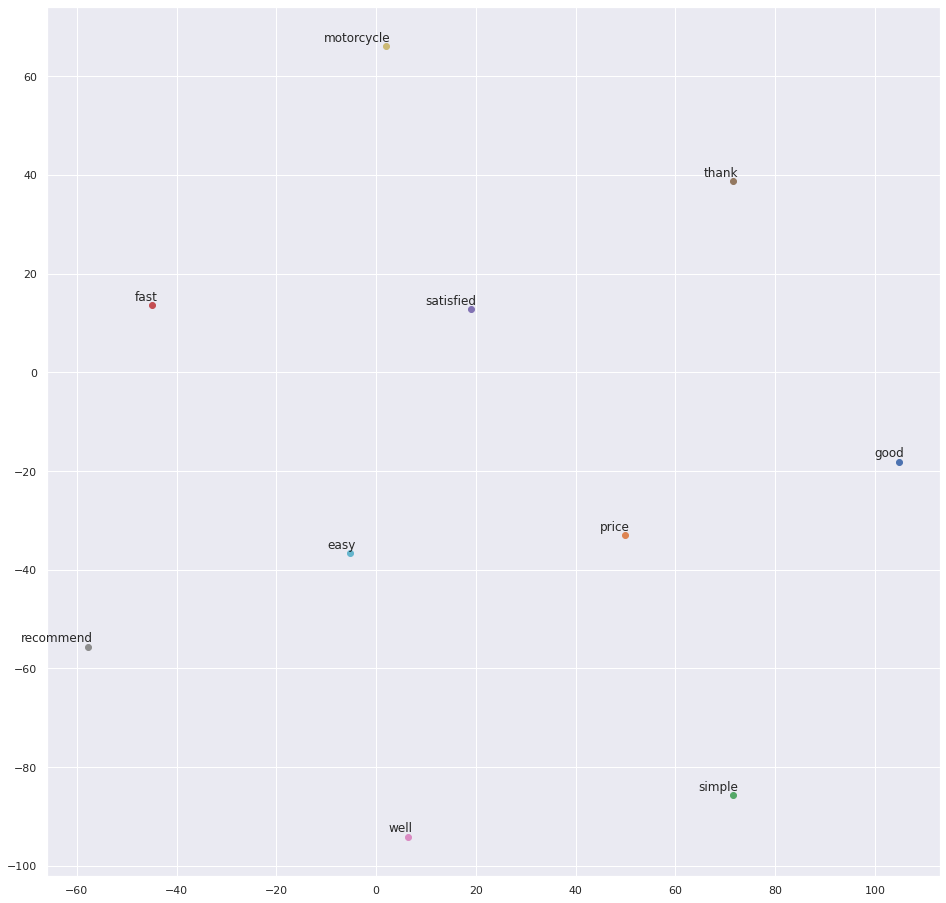


------------------- TSNE for words of reviews about the product multirisque-professionnelle -------------------
Size of the dataset: 3 reviews

		TSNE for the reviews in the train set

No word in the reviews for multirisque-professionnelle with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product prevoyance -------------------
Size of the dataset: 35 reviews

		TSNE for the reviews in the train set

No word in the reviews for prevoyance with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product responsabilite-civile-professionnelle -------------------
Size of the dataset: 0 reviews

		TSNE for the reviews in the train set

No word in the reviews for responsabilite-civile-professionnelle with a grade of 5 appears 200 times

------------------- TSNE for words of reviews about the product sante -------------------
Size of the dataset: 472 reviews

		TSNE for the reviews in the train set



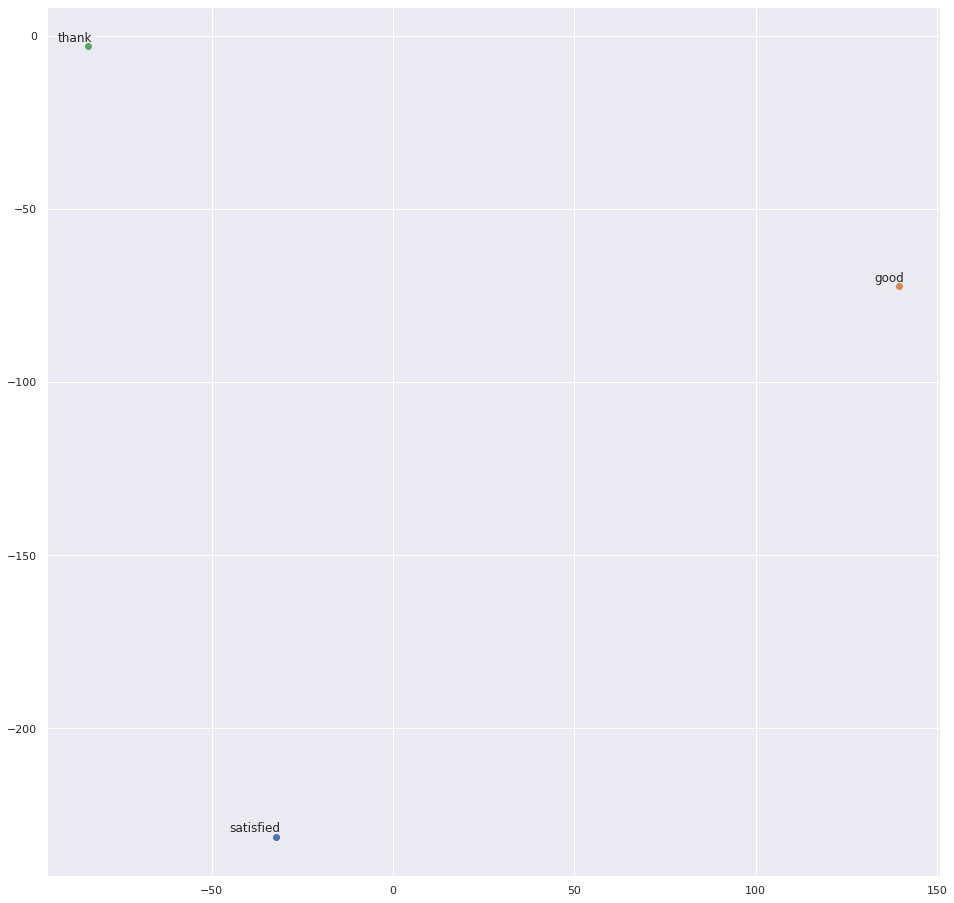


------------------- TSNE for words of reviews about the product vie -------------------
Size of the dataset: 6 reviews

		TSNE for the reviews in the train set

No word in the reviews for vie with a grade of 5 appears 200 times


In [ ]:
for grade in np.sort(train.note.unique()):
    print("\n\n******************** TSNE for words of reviews with a grade of "+str(grade)+" ********************")
    for product in np.sort(train.produit.unique()):
        print("\n------------------- TSNE for words of reviews about the product "+str(product)+" -------------------")
        train_grade=train[(train.note==grade) & (train.produit==product)]
        print("Size of the dataset: "+str(train_grade.shape[0])+" reviews\n")
        print("\t\tTSNE for the reviews in the train set\n")
        corpus=[review[1] for review in train_grade.review.iteritems()]
        try:
            model=models.word2vec.Word2Vec(corpus, size=100, window=20, min_count=100, workers=4)
            tsne_plot(model,1)
        except Exception:
            print("No word in the reviews for "+product+" with a grade of "+str(grade)+" appears 200 times")
            pass
        

# Supervised Learning

In [ ]:
train=pd.read_csv("train.csv",sep=";")
train=train.rename(columns={"avis":"french_text","review":"english_text"})
train['english_text'] = train['english_text'].astype(str)
train['french_text'] = train['french_text'].astype(str)
df=train.copy()

test=pd.read_csv("test.csv",sep=";")
test=test.rename(columns={"avis":"french_text","review":"english_text"})
test['english_text'] = test['english_text'].astype(str)
test['french_text'] = test['french_text'].astype(str)

In [ ]:
df["date"]=df["date"].str.strip()
df["date_review"]=df["date"].str.split(" suite").str[0]
df["jour"]=df["date_review"].str.split(" ").str[0].astype("int")
df["mois"]=df["date_review"].str.split(" ").str[1]
df["année"]=df["date_review"].str.split(" ").str[2].astype("int")

test["date"]=test["date"].str.strip()
test["date_review"]=test["date"].str.split(" suite").str[0]
test["jour"]=test["date_review"].str.split(" ").str[0].astype("int")
test["mois"]=test["date_review"].str.split(" ").str[1]
test["année"]=test["date_review"].str.split(" ").str[2].astype("int")

In [ ]:
df["mois"]=df["mois"].map(month_convertion).astype("int")
test["mois"]=test["mois"].map(month_convertion).astype("int")

In [ ]:
df["date_review"]=pd.to_datetime(df.année*10000+df.mois*100+df.jour,format='%Y%m%d')
test["date_review"]=pd.to_datetime(test.année*10000+test.mois*100+test.jour,format='%Y%m%d')

In [ ]:
df["period_review"]=df["date"].str.split(" en ").str[1]
df["mois_period"]=df["period_review"].str.split(" ").str[0]
df["année_period"]=df["period_review"].str.split(" ").str[1].astype("int")
df["mois_period"]=df["mois_period"].map(month_convertion).astype("int")

cols=["année_period","mois_period"]
df['period_review'] = df[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
df['period_review']=pd.to_datetime(df['period_review'])
df['period_review']=df['period_review'].dt.to_period("M")

test["period_review"]=test["date"].str.split(" en ").str[1]
test["mois_period"]=test["period_review"].str.split(" ").str[0]
test["année_period"]=test["period_review"].str.split(" ").str[1].astype("int")
test["mois_period"]=test["mois_period"].map(month_convertion).astype("int")

cols=["année_period","mois_period"]
test['period_review'] = test[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
test['period_review']=pd.to_datetime(test['period_review'])
test['period_review']=test['period_review'].dt.to_period("M")

In [ ]:
def transform_cyclical_sin(value, base):
    return np.sin(2 * np.pi * value/base)

def transform_cyclical_cos(value, base):
    return np.cos(2 * np.pi * value/base)

df['sin_mois'] = transform_cyclical_sin((df['mois']).astype(int), 12)
df['cos_mois'] = transform_cyclical_cos((df['mois']).astype(int), 12)

df['sin_jour'] = transform_cyclical_sin((df['jour']).astype(int), 31)
df['cos_jour'] = transform_cyclical_cos((df['jour']).astype(int), 31)

test['sin_mois'] = transform_cyclical_sin((test['mois']).astype(int), 12)
test['cos_mois'] = transform_cyclical_cos((test['mois']).astype(int), 12)

test['sin_jour'] = transform_cyclical_sin((test['jour']).astype(int), 31)
test['cos_jour'] = transform_cyclical_cos((test['jour']).astype(int), 31)

In [ ]:
df=df.drop(["date","mois_period","jour_period","année","jour","mois","année_period"],1,errors='ignore')
test=test.drop(["date","mois_period","jour_period","année","jour","mois","année_period"],1,errors='ignore')

## Data cleaning and feature engineering

In [ ]:
#-- re replace products that occur very few time by 'autres'
l=["multirisque-professionnelle", "garantie-decennale","assurances-professionnelles","responsabilite-civile-professionnelle",
   "flotte-automobile"]

pattern = '|'.join(l)

df['produit'] = df['produit'].str.replace(pattern, 'autres')
test['produit'] = test['produit'].str.replace(pattern, 'autres')

df.head(3)

,note,auteur,french_text,assureur,produit,english_text,date_review,period_review,sin_mois,cos_mois,sin_jour,cos_jour
0,5,brahim--k-131532,"Meilleurs assurances, prix, solutions, écoute,...",Direct Assurance,auto,"Best insurance, prices, solutions, listening, ...",2021-09-06,2021-09,-1.0,-1.836970e-16,0.937752,0.347305
1,4,bernard-g-112497,"je suis globalement satisfait , sauf que vous ...",Direct Assurance,auto,"I am generally satisfied, except that you have...",2021-05-03,2021-05,0.5,-8.660254e-01,0.571268,0.820763
2,5,virginie-t-107352,Prix tres abordable plusieurs options s'offren...,Direct Assurance,auto,"Very affordable price, several options are ava...",2021-03-21,2021-03,1.0,6.123234e-17,-0.897805,-0.440394


In [ ]:
#-- remove \n and \r in text
def remove_bad_characters(text) :  
    text=text.replace("\r\n"," ")
    text=text.replace("\n\r"," ")
    text=text.replace("\n","")
    text=text.replace("\r","")
    return text

df['french_text'] = df['french_text'].apply(remove_bad_characters)
df['english_text'] = df['english_text'].apply(remove_bad_characters)

test['french_text'] = test['french_text'].apply(remove_bad_characters)
test['english_text'] = test['english_text'].apply(remove_bad_characters)

In [ ]:
# define a function that removes numeric values and mixtures
def remove_num(text):
    text = re.sub(r'\w*\d+\w*', '', text)
    return text

# remove numeric values and mixtures
df['french_text'] = df['french_text'].apply(remove_num)
df['english_text'] = df['english_text'].apply(remove_num)

test['french_text'] = test['french_text'].apply(remove_num)
test['english_text'] = test['english_text'].apply(remove_num)

### Get number of words

In [ ]:
df['word_count'] = df['english_text'].apply(nltk.tokenize.word_tokenize).apply(len)

test['word_count'] = test['english_text'].apply(nltk.tokenize.word_tokenize).apply(len)

### Get number of characters

In [ ]:
df['char_count'] = df['english_text'].apply(lambda x: len(x) - x.count(" "))

test['char_count'] = test['english_text'].apply(lambda x: len(x) - x.count(" "))

### Get average sentence length

In [ ]:
# define a function that returns average sentence length in a text
def avg_sentence_length(t):
    t=t.replace("!",".")
    t=t.replace("?",".")
    t=t.replace("...",".")
    j=[i.strip() for i in t.split('.')]
    avg_len = sum(len(x.split()) for x in j) / len(j)
    avg_len
    return avg_len

# do it on original text
df['avg_sentence_length'] = df['french_text'].apply(avg_sentence_length)

test['avg_sentence_length'] = test['french_text'].apply(avg_sentence_length)

### Get number of sentences

In [ ]:
# define a function that returns number of sentences in a text
def nb_sentence(t):
    t=t.replace("!",".")
    t=t.replace("?",".")
    t=t.replace("...",".")
    j=[i.strip() for i in t.split('.')]
    return len(j)

# do it on original text
df['nb_sentence'] = df['french_text'].apply(nb_sentence)

test['nb_sentence'] = test['french_text'].apply(nb_sentence)

### Get percentage of punctuations

In [ ]:
def punc_per(text):
    total_count = len(text) - text.count(" ")
    punc_count = sum([1 for c in text if c in string.punctuation])
    if punc_count != 0 and total_count != 0:
        return round(punc_count / total_count * 100, 2)
    else:
        return 0

# we do it on our original text
df['punc_per'] = df['french_text'].apply(punc_per)

test['punc_per'] = test['french_text'].apply(punc_per)

### Get number of words written in all caps

In [ ]:
def all_caps_count(string):
    words = string.split()
    pattern = re.compile(r'\b[A-Z]+[A-Z]+\b')
    capsWords = [w for w in words if w in re.findall(pattern, string)]
    return len(capsWords)

# we do it on our original text
df['all_caps_count'] = df['french_text'].apply(all_caps_count)

test['all_caps_count'] = test['french_text'].apply(all_caps_count)

### Get the rank of each comments by author

In [ ]:
#-- after some tests, we have decided to remove this feature
df=df.sort_values("date_review")
#df['author_comments_rank'] = df.groupby(['auteur'])['date_review'].rank(ascending=True,method='first')

### Count number of distinct words in our training corpus

In [ ]:
flat_list = [item for sublist in df["english_text"].str.lower().str.split().values for item in sublist]
from collections import Counter
word_occurence=Counter(flat_list)
word_occurence=dict(sorted(word_occurence.items(), key=lambda item: item[1],reverse=True))
print("Before cleaning, we have "+str(len(word_occurence))+" disctinct words")

Before cleaning, we have 43929 disctinct words


### Countplot of the ten most frequent words

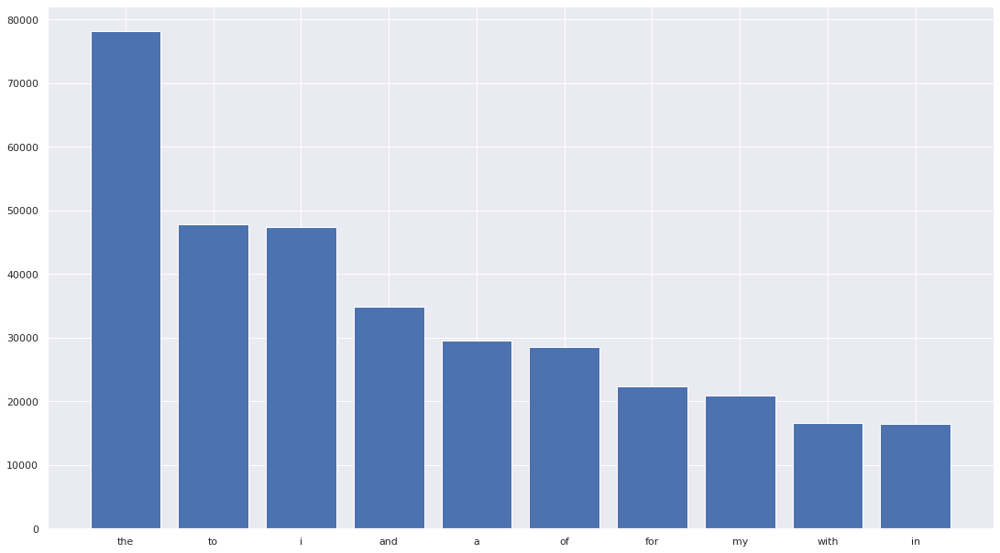

In [ ]:
plt.bar(list(word_occurence.keys())[:10], list(word_occurence.values())[:10])
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)

As we can see, we have a lot of stop of stop words

Before removing some words, we will compute positive and negative score of texts with transformers (HuggingFace)

In [ ]:
#-- 3 hour runtime
# df=df.reset_index(drop=True)
# df["positive_transformer"]=0
# df["negative_transformer"]=0
# for index,row in df.iterrows():
#     answ=classifier(row["english_text"][:500])[0]
#     key=answ["label"].lower()+"_transformer"
#     print(index,key,answ["score"])
#     df.loc[index,key]=answ["score"]
# df.to_csv("checkpoint_transformers.csv",index=False)

In [ ]:
# test=test.reset_index(drop=True)
# test["positive_transformer"]=0
# test["negative_transformer"]=0
# for index,row in test.iterrows():
#     answ=classifier(row["english_text"][:500])[0]
#     key=answ["label"].lower()+"_transformer"
#     print(index,key,answ["score"])
#     test.loc[index,key]=answ["score"]
# test.to_csv("test_checkpoint_transformers.csv",index=False)

In [ ]:
df=pd.read_csv("checkpoint_transformers.csv")
df=df.round({'positive_transformer': 3, 'negative_transformer': 3})

test=pd.read_csv("test_checkpoint_transformers.csv")
test["english_text"]=test["english_text"].astype("string")
test["english_text"]=test["english_text"].fillna("")
test["french_text"]=test["french_text"].astype("string")
test["french_text"]=test["french_text"].fillna("")

test=test.round({'positive_transformer': 3, 'negative_transformer': 3})

test

,auteur,french_text,assureur,produit,english_text,date_review,period_review,sin_mois,cos_mois,sin_jour,cos_jour,word_count,char_count,avg_sentence_length,nb_sentence,punc_per,all_caps_count,positive_transformer,negative_transformer
0,lognos-d-139728,Satisfait des tarif et rapide j'attends de voi...,L'olivier Assurance,auto,"Satisfied with the price and fast, I'm waiting...",2021-11-16,2021-11,-0.500000,8.660254e-01,-0.101168,-0.994869,34,148,15.000000,2,3.31,0,0.998,0.000
1,paugam-l-139727,"Bon service, service réactif. Tout en ligne pr...",L'olivier Assurance,auto,"Good service, responsive service. Everything c...",2021-11-16,2021-11,-0.500000,8.660254e-01,-0.101168,-0.994869,34,140,7.000000,4,4.03,0,0.999,0.000
2,rozgonyi-o-139704,L’assurance Olivier est une très bonne assuran...,L'olivier Assurance,auto,Olivier insurance is a very good insurance I a...,2021-11-16,2021-11,-0.500000,8.660254e-01,-0.101168,-0.994869,29,117,13.000000,2,1.53,0,1.000,0.000
3,saad-hellal-h-139697,Je suis satisfait de l'olivier assurances pas ...,L'olivier Assurance,auto,I am satisfied with the olivier assurances not...,2021-11-16,2021-11,-0.500000,8.660254e-01,-0.101168,-0.994869,26,137,27.000000,1,0.76,0,1.000,0.000
4,damis-s-139693,le prix est attractif par rapport à ma situati...,L'olivier Assurance,auto,the price is attractive compared to my situati...,2021-11-15,2021-11,-0.500000,8.660254e-01,0.101168,-0.994869,26,122,26.000000,1,1.61,0,0.996,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10327,mamybouly-129360,"Bonjour, j'ai une mauvaise expérience avec la ...",Sma,autres,"Hello, I have had a bad experience with SOCOBA...",2021-08-24,2021-08,-0.866025,-5.000000e-01,-0.988468,0.151428,502,2133,19.208333,24,3.19,4,0.000,0.999
10328,tarti-88637,Entreprise très impactée par le covid- secteur...,Allianz,autres,Company very impacted by the covid-events sect...,2021-05-18,2021-05,0.500000,-8.660254e-01,-0.485302,-0.874347,122,529,19.500000,6,3.72,1,0.000,0.999
10329,victor-109599,"Suite a un cambriolage le //, je suis toujours...",Allianz,autres,"Following a burglary on //, I am still waiting...",2021-04-08,2021-04,0.866025,-5.000000e-01,0.998717,-0.050649,49,217,11.000000,4,4.72,0,0.000,0.992
10330,lkio-110907,"Bonjour, Je constate qu'entre le moment de ma...",Generali,autres,"Hello, I note that between the time of my req...",2021-04-19,2021-04,0.866025,-5.000000e-01,-0.651372,-0.758758,379,1507,16.631579,19,5.89,4,0.000,0.999


### Remove stop words

In [ ]:
stops=set(stopwords.words('english'))
stops.update([":",",",'"',''])

In [ ]:
def remove_stop(row):
    row=row.replace(",","")
    row=row.replace("'","")
    row=row.replace('"',"")
    row=row.replace('.',"")
    row=row.replace('(',"")
    row=row.replace(')',"")
    row=row.replace(':',"")
    row=row.replace('!',"")
    row=row.replace('?',"")
    row=row.lower().split()
    rep=[i for i in row if i not in stops]
    rep=" ".join(rep)
    return rep
 
df["temp"]=df["english_text"].apply(remove_stop)

test["temp"]=test["english_text"].apply(remove_stop)   

### Lemmatization of our text

In [ ]:
def lem(row):
    lemmatizer_output=WordNetLemmatizer()
    rep=[lemmatizer_output.lemmatize(word) for word in row.split()]
    rep=" ".join(rep)
    return rep


df["lemma"]=df["temp"].apply(lem)
df=df.drop(df[df["lemma"].str.len()==0].index)
df=df.reset_index(drop=True)

test["lemma"]=test["temp"].apply(lem)
test=test.reset_index(drop=True)


### Count number of disctinct words after some cleaning

In [ ]:
flat_list = [item for sublist in df["lemma"].str.lower().str.split().values for item in sublist]
word_occurence=Counter(flat_list)
word_occurence=dict(sorted(word_occurence.items(), key=lambda item: item[1],reverse=True))

n=2
filtered_words={k: v for k, v in word_occurence.items() if v < n}
print("We remove ",len(filtered_words)," words because they occur less than ",n," times")
for k in filtered_words.keys():
    word_occurence.pop(k, None)
    
print("After cleaning, we have "+str(len(word_occurence))+" disctinct words")

We remove  8327  words because they occur less than  2  times
After cleaning, we have 9754 disctinct words


In [ ]:
#-- we remove rare words from each list of ingredients_tags
words_to_keep=list(word_occurence.keys())
df["lemma"]=df["lemma"].str.split().apply(lambda x: " ".join([ele for ele in x if ele in word_occurence])) 
test["lemma"]=test["lemma"].str.split().apply(lambda x: " ".join([ele for ele in x if ele in word_occurence])) 

df=df.drop(df[df["lemma"].str.len()==0].index)
df=df.reset_index(drop=True)

### Countplot of the ten most frequent words after cleaning

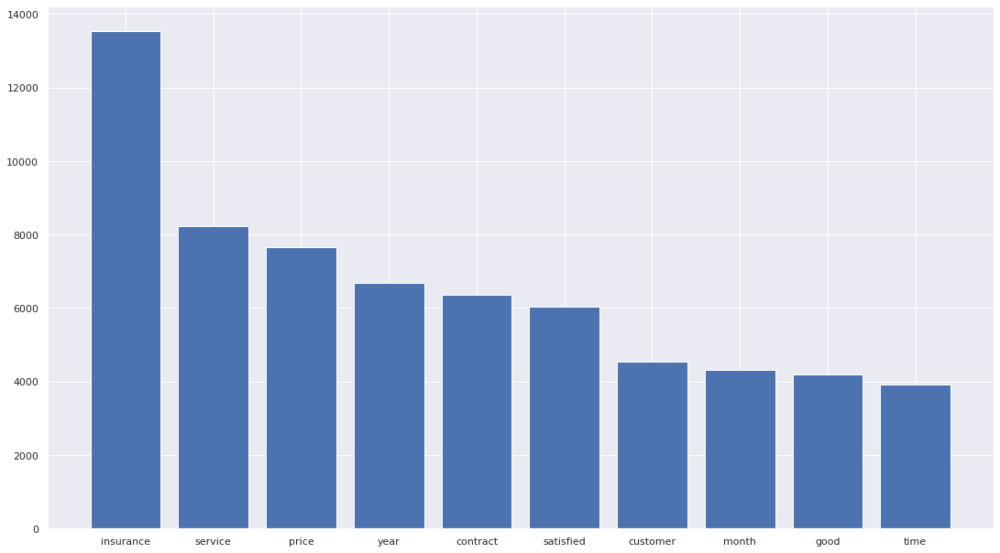

In [ ]:
plt.bar(list(word_occurence.keys())[:10], list(word_occurence.values())[:10])
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)

### Compute neg/pos score on averbs and entire lemma

In [ ]:
# get number of words of our lemma
df["nb_words_clean_text"]=df["lemma"].str.split().str.len()

test["nb_words_clean_text"]=test["lemma"].str.split().str.len()

In [ ]:
# create a list of adverbs
def get_adverbs(text):
    tags=nltk.pos_tag(text.split())
    adverbs=[a for (a,b) in tags if(b=="RB" or b=='RBR' or b=="RBS")]
    return adverbs

df["adverbs"]=df["lemma"].apply(get_adverbs)

test["adverbs"]=test["lemma"].apply(get_adverbs)

In [ ]:

def tag_scores(text):
  synsets=[wn.synsets(i,pos='a') for i in text]
  temps=[swn.senti_synset(i[0].name()) for i in synsets if len(i)>0]
  pos=[i.pos_score() for i in temps]
  neg=[i.neg_score() for i in temps]
  obj=[i.obj_score() for i in temps]
  diff=np.subtract(np.array(pos),np.array(neg))
  neg_count = len(list(filter(lambda x: (x < 0), diff)))
  pos_count = len(list(filter(lambda x: (x >= 0), diff)))
  #print(np.subtract(np.array(pos),np.array(neg)))
  return [sum(pos),sum(neg),sum(obj),pos_count,neg_count]
df["all_scores"]=df["adverbs"].apply(tag_scores)

df["adv_pos_score"]=df["all_scores"].str[0]
df["adv_neg_score"]=df["all_scores"].str[1]
df["adv_obj_score"]=df["all_scores"].str[2]
df["adv_pos_count"]=df["all_scores"].str[3]
df["adv_neg_count"]=df["all_scores"].str[4]
df["len_adverbs"]=df["adverbs"].str.len()
df["pos_score_by_adv"]=df["adv_pos_score"]/df["adverbs"].str.len()
df["neg_score_by_adv"]=df["adv_neg_score"]/df["adverbs"].str.len()
df["obj_score_by_adv"]=df["adv_obj_score"]/df["adverbs"].str.len()
df["pos_count_by_adv"]=df["adv_pos_count"]/df["adverbs"].str.len()
df["neg_count_by_adv"]=df["adv_neg_count"]/df["adverbs"].str.len()

df["all_scores_entire"]=df["lemma"].str.split().apply(tag_scores)
df["entire_pos_score"]=df["all_scores_entire"].str[0]
df["entire_neg_score"]=df["all_scores_entire"].str[1]
df["entire_obj_score"]=df["all_scores_entire"].str[2]
df["entire_pos_count"]=df["all_scores_entire"].str[3]
df["entire_neg_count"]=df["all_scores_entire"].str[4]

df["diff_pos_neg_score"]=df["entire_pos_score"]-df["entire_neg_score"]
df["diff_pos_neg_count"]=df["entire_pos_count"]-df["entire_neg_count"]

df=df.drop(["all_scores","all_scores_entire"],1,errors='ignore')
df=df.fillna(0)

test["all_scores"]=test["adverbs"].apply(tag_scores)

test["adv_pos_score"]=test["all_scores"].str[0]
test["adv_neg_score"]=test["all_scores"].str[1]
test["adv_obj_score"]=test["all_scores"].str[2]
test["adv_pos_count"]=test["all_scores"].str[3]
test["adv_neg_count"]=test["all_scores"].str[4]
test["len_adverbs"]=test["adverbs"].str.len()
test["pos_score_by_adv"]=test["adv_pos_score"]/test["adverbs"].str.len()
test["neg_score_by_adv"]=test["adv_neg_score"]/test["adverbs"].str.len()
test["obj_score_by_adv"]=test["adv_obj_score"]/test["adverbs"].str.len()
test["pos_count_by_adv"]=test["adv_pos_count"]/test["adverbs"].str.len()
test["neg_count_by_adv"]=test["adv_neg_count"]/test["adverbs"].str.len()

test["all_scores_entire"]=test["lemma"].str.split().apply(tag_scores)
test["entire_pos_score"]=test["all_scores_entire"].str[0]
test["entire_neg_score"]=test["all_scores_entire"].str[1]
test["entire_obj_score"]=test["all_scores_entire"].str[2]
test["entire_pos_count"]=test["all_scores_entire"].str[3]
test["entire_neg_count"]=test["all_scores_entire"].str[4]

test["diff_pos_neg_score"]=test["entire_pos_score"]-test["entire_neg_score"]
test["diff_pos_neg_count"]=test["entire_pos_count"]-test["entire_neg_count"]

test=test.drop(["all_scores","all_scores_entire"],1,errors='ignore')
test=test.fillna(0)
test.head(3)


,auteur,french_text,assureur,produit,english_text,date_review,period_review,sin_mois,cos_mois,sin_jour,...,obj_score_by_adv,pos_count_by_adv,neg_count_by_adv,entire_pos_score,entire_neg_score,entire_obj_score,entire_pos_count,entire_neg_count,diff_pos_neg_score,diff_pos_neg_count
0,lognos-d-139728,Satisfait des tarif et rapide j'attends de voi...,L'olivier Assurance,auto,"Satisfied with the price and fast, I'm waiting...",2021-11-16,2021-11,-0.5,0.866025,-0.101168,...,1.00,1.0,0.0,1.50,0.0,3.50,5,0,1.50,5
1,paugam-l-139727,"Bon service, service réactif. Tout en ligne pr...",L'olivier Assurance,auto,"Good service, responsive service. Everything c...",2021-11-16,2021-11,-0.5,0.866025,-0.101168,...,0.00,0.0,0.0,1.75,1.0,5.25,6,2,0.75,4
2,rozgonyi-o-139704,L’assurance Olivier est une très bonne assuran...,L'olivier Assurance,auto,Olivier insurance is a very good insurance I a...,2021-11-16,2021-11,-0.5,0.866025,-0.101168,...,0.25,1.0,0.0,2.50,0.0,1.50,4,0,2.50,4


### Transformation of some qualitative variables

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
df['produit']=df['produit'].astype(str)
df['auteur']=df['auteur'].astype(str)
df['assureur']=df['assureur'].astype(str)

test['produit']=test['produit'].astype(str)
test['auteur']=test['auteur'].astype(str)
test['assureur']=test['assureur'].astype(str)

df['produit'] = le.fit_transform(df['produit'])
test['produit'] = le.transform(test['produit'])

# df['auteur'] = le.fit_transform(df['auteur'])
# test['auteur'] = le.transform(test['auteur'])

# df['assureur'] = le.fit_transform(df['assureur'])
# test['assureur'] = le.transform(test['assureur'])

### Remove some outliers

Work on word_count column

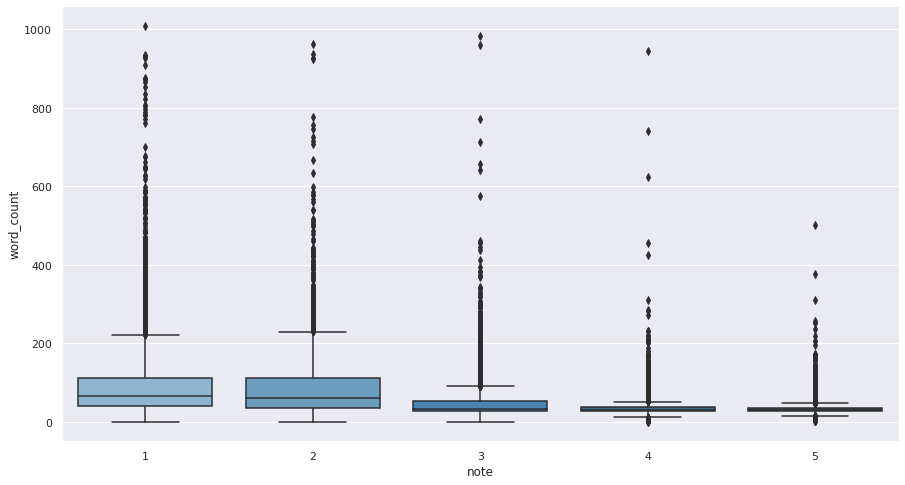

In [ ]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.boxplot(data=df,x="note",y="word_count",orient="v",color="b",palette="Blues_d")

In [ ]:
limit_value=df.quantile(0.99, numeric_only=True)["word_count"]
len_drop=len(df[df["word_count"]>limit_value])
df=df.drop(df[df["word_count"]>limit_value].index)
df=df.reset_index(drop=True)
print("We drop ",str(len_drop)," extreme values")

We drop  242  extreme values


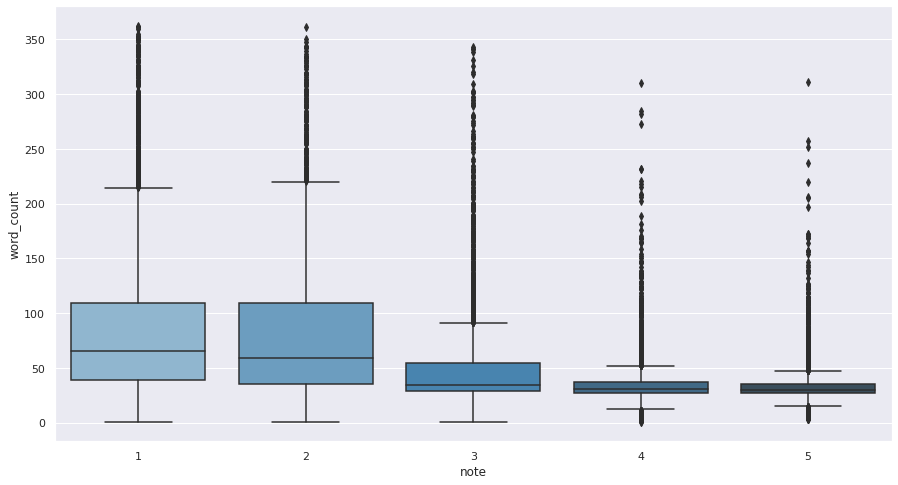

In [ ]:
sns.boxplot(data=df,x="note",y="word_count",orient="v",color="b",palette="Blues_d")

Work on punc_per column

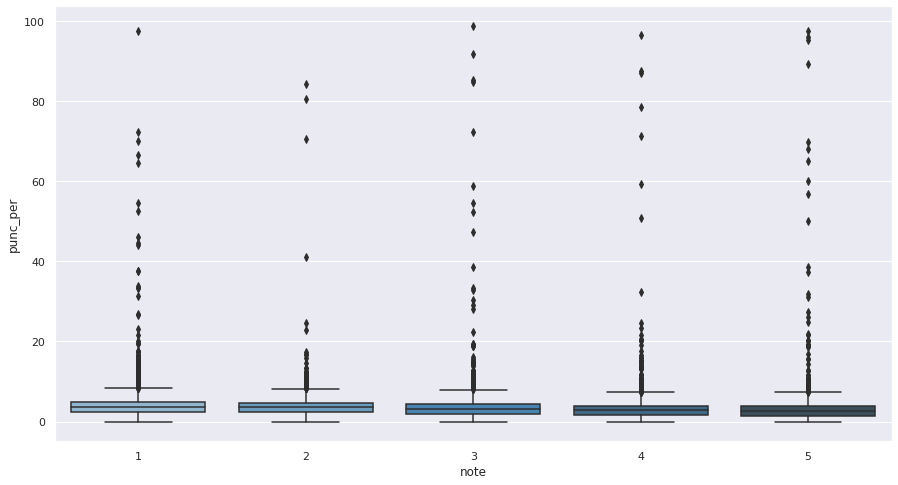

In [ ]:
sns.boxplot(data=df,x="note",y="punc_per",orient="v",color="b",palette="Blues_d")

In [ ]:
limit_value=df.quantile(0.99, numeric_only=True)["punc_per"]
len_drop=len(df[df["punc_per"]>limit_value])
df=df.drop(df[df["punc_per"]>limit_value].index)
df=df.reset_index(drop=True)
print("We drop ",str(len_drop)," extreme values")

We drop  239  extreme values


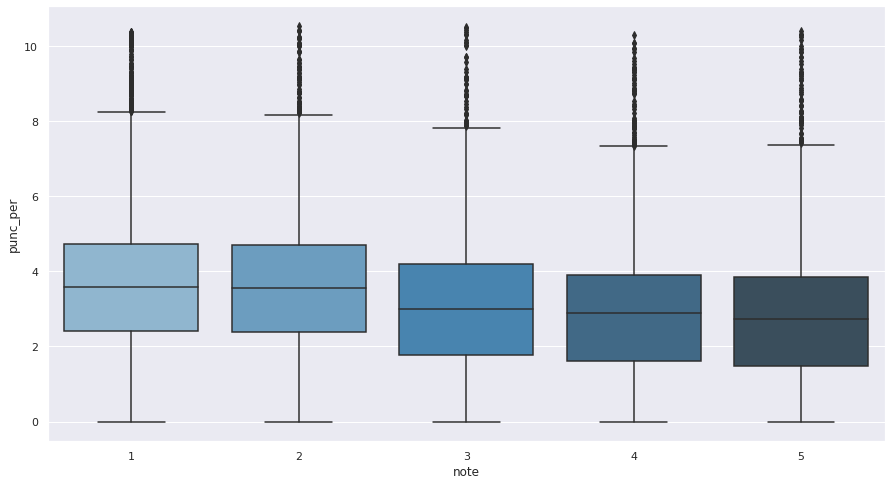

In [ ]:
sns.boxplot(data=df,x="note",y="punc_per",orient="v",color="b",palette="Blues_d")

Work on all_caps_count column

In [ ]:
# limit_value=df.quantile(0.99, numeric_only=True)["all_caps_count"]
# len_drop=len(df[df["all_caps_count"]>limit_value])
# df=df.drop(df[df["all_caps_count"]>limit_value].index)
# df=df.reset_index(drop=True)
# print("We drop ",str(len_drop)," extreme values")

In [ ]:
#-- creation of a dataframe with all our numerical features
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df_num = df.select_dtypes(include=numerics)
test_num = test.select_dtypes(include=numerics)
test_num.head(3)

,produit,sin_mois,cos_mois,sin_jour,cos_jour,word_count,char_count,avg_sentence_length,nb_sentence,punc_per,...,obj_score_by_adv,pos_count_by_adv,neg_count_by_adv,entire_pos_score,entire_neg_score,entire_obj_score,entire_pos_count,entire_neg_count,diff_pos_neg_score,diff_pos_neg_count
0,1,-0.5,0.866025,-0.101168,-0.994869,34,148,15.0,2,3.31,...,1.00,1.0,0.0,1.50,0.0,3.50,5,0,1.50,5
1,1,-0.5,0.866025,-0.101168,-0.994869,34,140,7.0,4,4.03,...,0.00,0.0,0.0,1.75,1.0,5.25,6,2,0.75,4
2,1,-0.5,0.866025,-0.101168,-0.994869,29,117,13.0,2,1.53,...,0.25,1.0,0.0,2.50,0.0,1.50,4,0,2.50,4


## Understand our features

### Compute mutual info between target and numerical features

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31],
 <a list of 32 Text major ticklabel objects>)

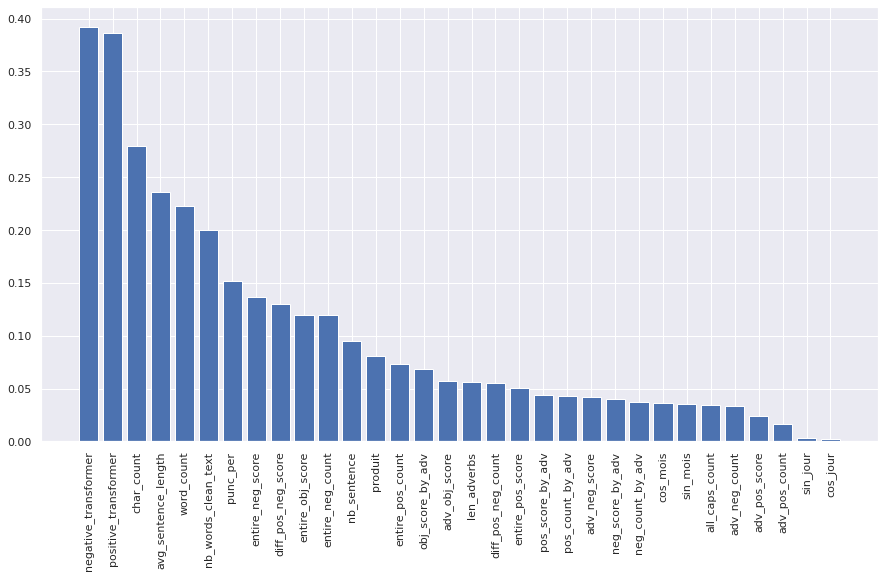

In [ ]:
from sklearn.feature_selection import mutual_info_classif
X=df_num.loc[:, df_num.columns != 'note']
Y=df_num.loc[:, df_num.columns == 'note'].values
# X_vec = cv.fit_transform(X)

res = dict(zip(X.columns,
               mutual_info_classif(X.values, Y, discrete_features=True)
               ))
res=dict(sorted(res.items(), key=lambda item: item[1],reverse=True))
plt.bar(list(res.keys())[:], list(res.values())[:])
plt.xticks(rotation = 90)

### Plot correlation in absolute values of best correlated features with target

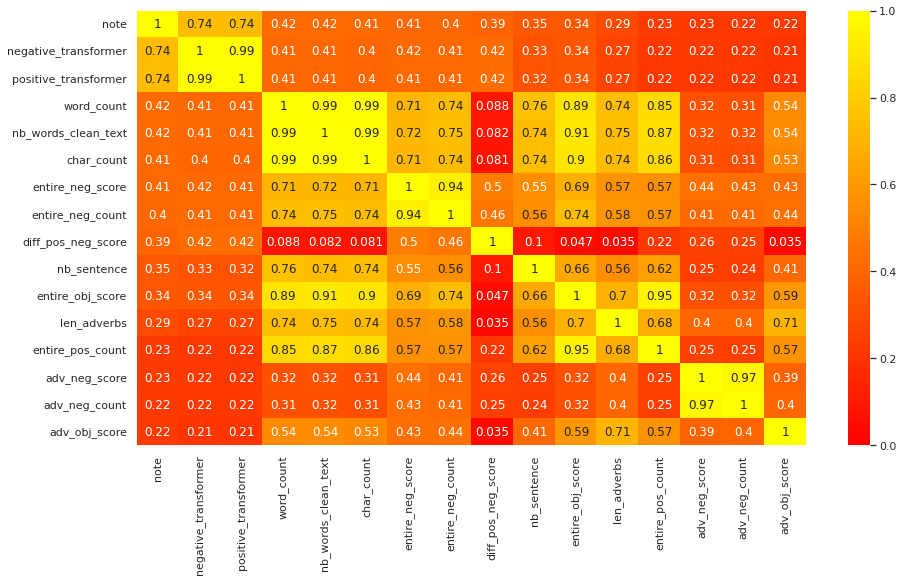

In [ ]:
#return most correlated features with the target, sorted 
def bestCorrelated(df,target_column,pct_limit):
    target=df.columns[target_column]
    correlation=df.corr()
    x=pd.DataFrame(correlation.iloc[target_column].abs().sort_values(ascending=False))
    x=x[x[target]>=pct_limit]
    return x

#print correlation matrix >cor_matrix(df,0,0.4)
def cor_matrix(df,target_column,pct_limit):
    x=bestCorrelated(df,target_column,pct_limit)
    top=x.index
    cor=df[top].corr().abs()
    sns.set(rc = {'figure.figsize':(15,8)})
    sns.heatmap(cor,
            cmap='autumn',
            annot=True,
            vmax=1,
            vmin=0,
            linewidths=0,
            #cbar_kws ={"orientation":"horizontal"}
           )
cor_matrix(df_num,0,0.2)

We can see a huge correlation between "char_count", "nb_words_clean_text" and "word_count" so we will keep only one of them. We keep char_count because it's the one with the highest mutual information

In [ ]:
# df_num=df_num.drop(["word_count","nb_words_clean_text"],1,errors='ignore')
# test_num=test_num.drop(["word_count","nb_words_clean_text"],1,errors='ignore')

### Compute p-value for each feature

In [ ]:
from scipy.stats import ttest_ind
pvalues=[]
cols=df_num.columns.difference(["note"])
for i in cols:
    d={}
    res = ttest_ind(df_num[i].values, df_num["note"].values).pvalue
    d["feature"]=i
    d["pvalue"]=res
    pvalues.append(d)
pval_df=pd.DataFrame.from_dict(pvalues)

#-- if pvalue is greater than 0.05, we will remove this feature
features_to_drop=pval_df[pval_df["pvalue"]>0.05]["feature"].values
features_to_drop

array(['produit'], dtype=object)

In [ ]:
#-- we drop features with p-value greater than 0.05
df=df.drop(features_to_drop,1,errors='ignore')
df_num=df_num.drop(features_to_drop,1,errors='ignore')

test=test.drop(features_to_drop,1,errors='ignore')
test_num=test_num.drop(features_to_drop,1,errors='ignore')

## Vectorization

In [ ]:
#-- we vectorize each word
list_words=df["lemma"].str.split().values
vector_size=150
#-- vector_size=400 means that for one word, we will have a vector of 400 values
#400
#20
#50
model = gensim.models.Word2Vec(list_words, min_count = 1, window = 5,size=vector_size)

In [ ]:
#-- we vectorize each lemma sentence
vectors=[]
for i in range(len(df)):
    s1=df["lemma"].iloc[i].split()
    d=0
    for word in s1:
        d+=model.wv[word]
    d=d/len(s1)
    vectors.append(d)
df_lemma_vectors=pd.DataFrame(vectors)
df_lemma_vectors=df_lemma_vectors.add_prefix('w2v_')


vectors=[]
for i in range(len(test)):
    s1=test["lemma"].iloc[i].split()
    d=np.zeros(vector_size)
    for word in s1:
        try:
            d+=model.wv[word]
        except:
            pass
    if len(s1)>0:
        d=d/len(s1)
    vectors.append(d)
test_lemma_vectors=pd.DataFrame(vectors)
test_lemma_vectors=test_lemma_vectors.add_prefix('w2v_')


We tried a tfidf vectorizer, that works differently, with a max features set to 400

In [ ]:
# import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# instantiate the vectorizer
tfidf = TfidfVectorizer(max_features=400)

# fit and transform
X_tfidf = tfidf.fit_transform(df['lemma'])
test_tfidf = tfidf.transform(test['lemma'])

# create a dataframe from the sparse matrix
X_tfidf_df = pd.DataFrame(X_tfidf.toarray())
test_tfidf_df = pd.DataFrame(test_tfidf.toarray())
X_tfidf_df.columns = tfidf.get_feature_names_out()
test_tfidf_df.columns = tfidf.get_feature_names_out()

# check the dataframe
X_tfidf_df=X_tfidf_df.add_prefix('tfidf_')
test_tfidf_df=test_tfidf_df.add_prefix('tfidf_')
X_tfidf_df.head()

,tfidf_able,tfidf_absolutely,tfidf_accident,tfidf_according,tfidf_account,tfidf_addition,tfidf_additional,tfidf_address,tfidf_advance,tfidf_advice,...,tfidf_well,tfidf_went,tfidf_within,tfidf_without,tfidf_work,tfidf_would,tfidf_year,tfidf_yet,tfidf_young,tfidf_zero
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.161371,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.335675,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.164793,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0


We tried several scalers our numerical features (but not on our lemma vectors). After some test, we have found that PowerTransformer is the one that give the best performance fou our models.

In [ ]:
from sklearn.preprocessing import StandardScaler,PowerTransformer,RobustScaler,MinMaxScaler,MaxAbsScaler
#scaler=StandardScaler()
#scaler=RobustScaler()
#scaler=MinMaxScaler()
#scaler=MaxAbsScaler()
scaler=PowerTransformer()

df_num.iloc[:, df_num.columns != 'note']=scaler.fit_transform(df_num.iloc[:, df_num.columns != 'note'])
test_num.iloc[:, test_num.columns != 'note']=scaler.transform(test_num.iloc[:, test_num.columns != 'note'])

test_num.head(3)

,sin_mois,cos_mois,sin_jour,cos_jour,word_count,char_count,avg_sentence_length,nb_sentence,punc_per,all_caps_count,...,obj_score_by_adv,pos_count_by_adv,neg_count_by_adv,entire_pos_score,entire_neg_score,entire_obj_score,entire_pos_count,entire_neg_count,diff_pos_neg_score,diff_pos_neg_count
0,-0.582156,1.452786,-0.166093,-1.408034,-0.369846,-0.363709,0.291668,-0.636760,0.134154,-0.46531,...,1.745636,1.637858,-0.377278,0.349044,-1.402521,-0.107239,0.158665,-1.295459,0.806086,0.454875
1,-0.582156,1.452786,-0.166093,-1.408034,-0.369846,-0.450480,-0.986437,0.321376,0.496717,-0.46531,...,-0.828375,-0.765927,-0.377278,0.562682,0.560598,0.428731,0.415956,0.524512,0.191120,0.195768
2,-0.582156,1.452786,-0.166093,-1.408034,-0.608075,-0.734480,0.065786,-0.636760,-0.873411,-0.46531,...,0.874194,1.637858,-0.377278,1.088990,-1.402521,-1.135601,-0.144441,-1.295459,1.625146,0.195768


In [ ]:
# create the new dataframe, X_features generated from numerical features, lemma vectors and tfidf vectors
X_features = pd.concat([df_num.iloc[:, df_num.columns != 'note'],
                        df_lemma_vectors,
                        X_tfidf_df,
                        ], axis=1)

test_features = pd.concat([test_num.iloc[:, test_num.columns != 'note'],
                        test_lemma_vectors,
                        test_tfidf_df,
                        ], axis=1)

# check the shape
print(X_features.shape,test_features.shape)

(23623, 581) (10332, 581)


## Machine Learning

In [ ]:
#-- We split our data in two sets
from sklearn.model_selection import train_test_split
X = X_features
y = df_num['note']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25,stratify=y)

In [ ]:
#-- we do a PCA on our vectors to reduce dimensions to 2
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca_num=pca.fit_transform(X_features)

#--Transformation in DataFrame pandas
pca_df = pd.DataFrame({
    "note" : y.values,
    "Dim1" : pca_num[:,0], 
    "Dim2" : pca_num[:,1]
})
pca_df.head()

,note,Dim1,Dim2
0,2,-1.322093,-2.157540
1,1,-1.121608,-0.391530
2,1,-1.646982,-3.097476
3,4,-0.512054,0.223297
4,1,-2.128209,1.462109


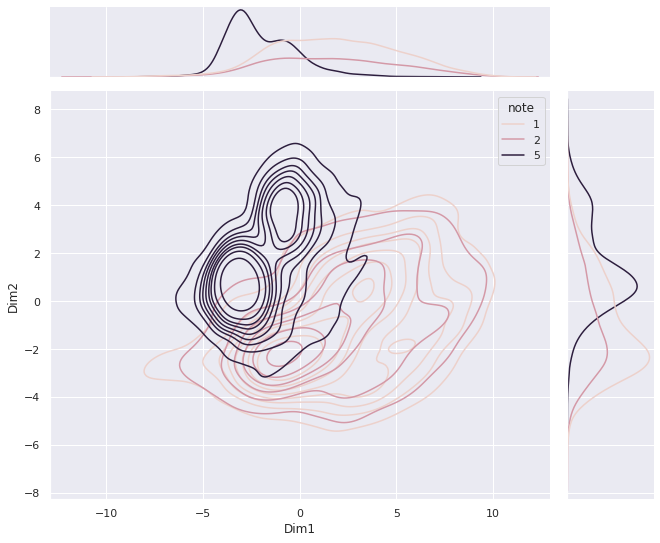

In [ ]:
temp=pca_df[pca_df["note"].isin([1,2,5])]
sns.jointplot(data=temp, x="Dim1", y="Dim2", hue="note",kind="kde")
fig=plt.gcf()
fig.set_size_inches(10,8)

As we can see, class with note 5 is really well represented by our data, but it's not the case for all classes, some of them are not concentrated

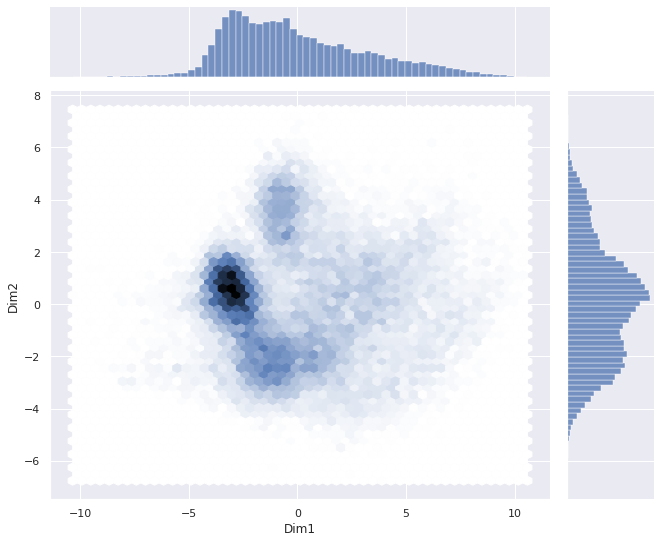

In [ ]:
#in order ro better visualize densities
sns.jointplot(x=pca_df["Dim1"], y=pca_df["Dim2"], kind="hex", color="b",palette="Blues_d")
fig=plt.gcf()
fig.set_size_inches(10,8)

### Model Training

In [ ]:
def resultsClassification(model,X_train,Y_train,X_test,Y_test):
    model.fit(X_train,Y_train)
    y_pred = model.predict(X_test)
    print("Accuracy Score:",round(accuracy_score(Y_test,y_pred),5))
    print ('F1 score:', round(f1_score(Y_test, y_pred,average='weighted'),5))
    print ('Recall:', round(recall_score(Y_test, y_pred,average='weighted'),5))
    print ('Precision:', round(precision_score(Y_test, y_pred,zero_division=0,average='weighted'),5))
    mse = mean_squared_error(Y_test, y_pred)
    rmse = math.sqrt(mse)
    print('RMSE : %f' % rmse)
    conf_matrix(Y_test,y_pred)
    plt.xlabel('Predicted label', fontsize = 15) 
    plt.ylabel('True label', fontsize = 15)
    
def conf_matrix(y,y_pred):
    cf_matrix = confusion_matrix(y, y_pred)
    size=np.shape(cf_matrix)[0]
    sns.set(rc = {'figure.figsize':(15,8)})
    group_counts = ["{0:0.0f}".format(value) for value in
                    cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f"{v2}\n{v3}" for v2, v3 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(size,size)
    sns.heatmap(cf_matrix,annot=labels, fmt="", cmap='autumn')

all_classif={}

In [ ]:
# scores=cross_val_score(SVC(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
# res=np.mean(np.sqrt(np.abs(scores)))
# all_classif["SVC"]=res

In [ ]:
scores=cross_val_score(GaussianNB(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["GaussianNB"]=res

In [ ]:
scores=cross_val_score(LogisticRegression(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["LogisticRegression"]=res

In [ ]:
scores=cross_val_score(RandomForestClassifier(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["RandomForestClassifier"]=res

In [ ]:
scores=cross_val_score(QuadraticDiscriminantAnalysis(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["QuadraticDiscriminantAnalysis"]=res

In [ ]:
#pip install lightgbm

In [ ]:
from lightgbm import LGBMClassifier
clf=LGBMClassifier(objective="multiclass",num_leaves=12,num_iterations=150)
scores=cross_val_score(clf, X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["LGBMClassifier"]=res

In [ ]:
scores=cross_val_score(LinearDiscriminantAnalysis(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["LinearDiscriminantAnalysis"]=res

In [ ]:
from sklearn.linear_model import SGDClassifier
scores=cross_val_score(SGDClassifier(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["SGDClassifier"]=res

In [ ]:
# scores=cross_val_score(AdaBoostClassifier(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
# res=np.mean(np.sqrt(np.abs(scores)))
# all_classif["AdaBoostClassifier"]=res

In [ ]:
from sklearn.linear_model import RidgeClassifier
scores=cross_val_score(RidgeClassifier(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["RidgeClassifier"]=res

In [ ]:
scores=cross_val_score(KNeighborsClassifier(), X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["KNeighborsClassifier"]=res

In [ ]:
clf=BaggingClassifier(base_estimator=LinearDiscriminantAnalysis())
scores=cross_val_score(clf, X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["BaggingLDA"]=res

In [ ]:
clf1=LinearDiscriminantAnalysis()
clf2=LogisticRegression()
clf3=RidgeClassifier()
clf4=QuadraticDiscriminantAnalysis()
final_estimator=GaussianNB()

estimators = [
    ('clf1', clf1),
    ('clf2', clf2),
    ('clf3', clf3),
    #('clf4', clf4),
]

clf = StackingClassifier(
    estimators=estimators, final_estimator=final_estimator,
)

scores=cross_val_score(clf, X_train, y_train,scoring = 'neg_mean_squared_error', cv=3)
res=np.mean(np.sqrt(np.abs(scores)))
all_classif["StackingClassifier"]=res

### Neural Network

In [ ]:
l_rate = 0.0005
batch_momentum=0.99

original_model = keras.Sequential([
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dropout(0.4),
    BatchNormalization(momentum=batch_momentum),
    keras.layers.Dense(32, activation='relu',kernel_regularizer= keras.regularizers.l2(l_rate)),
    keras.layers.Dropout(0.4),
    BatchNormalization(momentum=batch_momentum),
    keras.layers.Dense(16, activation='relu',kernel_regularizer= keras.regularizers.l2(l_rate)),
    keras.layers.Dropout(0.4),
    BatchNormalization(momentum=batch_momentum),
    keras.layers.Dense(6, activation='softmax')
])

original_model.compile(optimizer=tensorflow.keras.optimizers.Adam(learning_rate=1e-3),
                       loss="categorical_crossentropy",
                       metrics=[tensorflow.keras.metrics.RootMeanSquaredError()])

dummy_y_train = to_categorical(y_train)
dummy_y_val = to_categorical(y_val)

#if we want to stop the model earlier
#we can also put monitor='val_loss'
es = EarlyStopping(monitor='val_loss', mode='auto', verbose=0,patience=20)
mc = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', verbose=1, save_best_only=True)

#fit a model
original_hist = original_model.fit(X_train, dummy_y_train, epochs=200,batch_size=128,validation_data=(X_val, dummy_y_val),
                                   callbacks=[es, mc])



Epoch 1/200
132/139 [===========================>..] - ETA: 0s - loss: 1.8295 - root_mean_squared_error: 0.3703
Epoch 1: val_loss improved from inf to 1.29931, saving model to best_model.h5
139/139 [==============================] - 4s 10ms/step - loss: 1.8178 - root_mean_squared_error: 0.3695 - val_loss: 1.2993 - val_root_mean_squared_error: 0.3263
Epoch 2/200
136/139 [============================>.] - ETA: 0s - loss: 1.4294 - root_mean_squared_error: 0.3408
Epoch 2: val_loss improved from 1.29931 to 1.21059, saving model to best_model.h5
139/139 [==============================] - 1s 8ms/step - loss: 1.4271 - root_mean_squared_error: 0.3406 - val_loss: 1.2106 - val_root_mean_squared_error: 0.3218
Epoch 3/200
135/139 [============================>.] - ETA: 0s - loss: 1.3192 - root_mean_squared_error: 0.3313
Epoch 3: val_loss improved from 1.21059 to 1.17061, saving model to best_model.h5
139/139 [==============================] - 1s 7ms/step - loss: 1.3161 - root_mean_squared_error: 0.

185/185 [==============================] - 1s 2ms/step
Accuracy Score: 0.52608
F1 score: 0.45285
Recall: 0.52608
Precision: 0.41911
RMSE : 0.989104


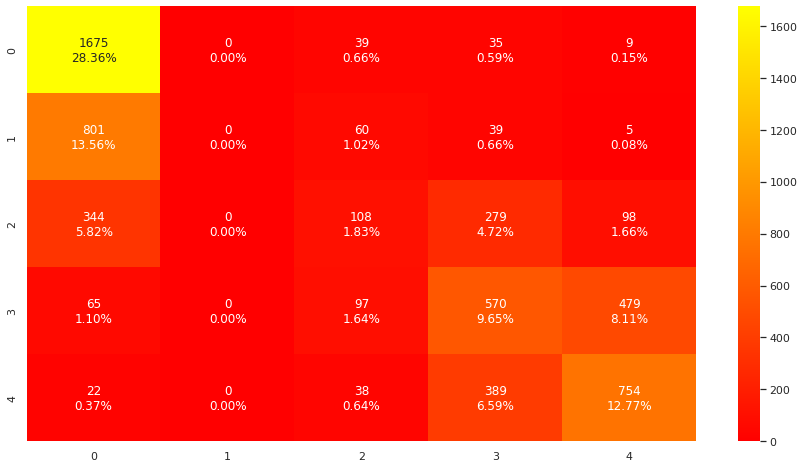

In [ ]:
saved_model = load_model('best_model.h5')
ynew = saved_model.predict(X_val)
#print(min(original_hist.history['val_loss']),math.sqrt(min(original_hist.history['val_loss'])))
y_pred=[i.argmax() for i in ynew ]
conf_matrix(y_val,y_pred)
print("Accuracy Score:",round(accuracy_score(y_val,y_pred),5))
print ('F1 score:', round(f1_score(y_val, y_pred,average='weighted'),5))
print ('Recall:', round(recall_score(y_val, y_pred,average='weighted'),5))
print ('Precision:', round(precision_score(y_val, y_pred,zero_division=0,average='weighted'),5))
mse = mean_squared_error(y_val, y_pred)
#print(mse)
rmse = math.sqrt(mse)
all_classif["NeuralNetwork"]=rmse
print('RMSE : %f' % rmse)

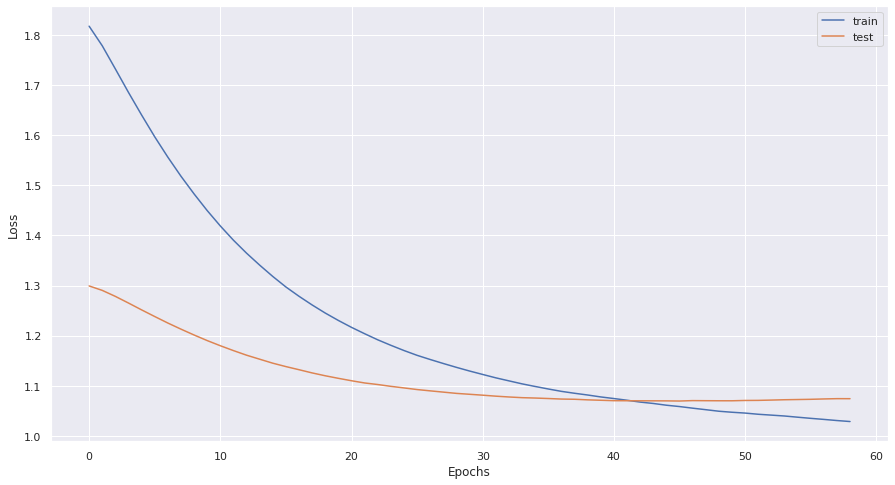

In [ ]:
def smooth_curve(points, factor=0.9):
  smoothed_points = []
  for point in points:
    if smoothed_points:
      previous = smoothed_points[-1]
      smoothed_points.append(previous * factor + point * (1 - factor))
    else:
      smoothed_points.append(point)
  return smoothed_points

plt.plot(smooth_curve(original_hist.history['loss']), label='train')
plt.plot(smooth_curve(original_hist.history['val_loss']), label='test')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

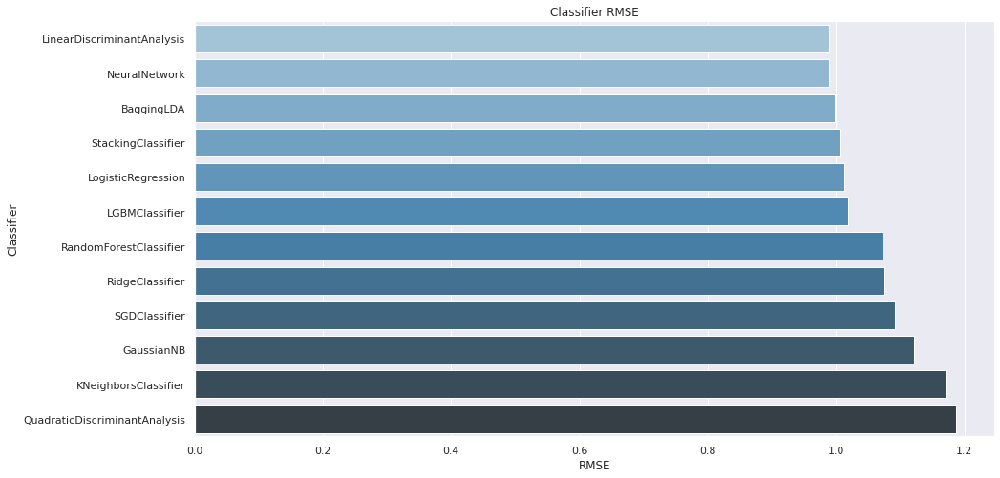

In [ ]:
def allModels(acc_dict):
    acc_dict=dict(sorted(acc_dict.items(), key=lambda item: item[1]))
    result_models=pd.DataFrame(list(acc_dict.items()),columns=['Classifier', 'RMSE'])
    plt.title('Classifier RMSE')
    sns.barplot(x='RMSE', y='Classifier', data=result_models, color="b",palette="Blues_d")
allModels(all_classif)

### Hyperparameter optimization on train set for our best model

In [ ]:
def evaluate_model(clf,X_train,y_train,parameters):
    grid = GridSearchCV(clf, parameters,scoring='neg_mean_squared_error')
    grid.fit(X_train.values, y_train.values)
    res=np.mean(np.sqrt(np.abs(grid.best_score_)))
    return grid.best_estimator_, round(res,5)

In [ ]:
parameters={
            'alpha':[0.09],
            'fit_intercept':[True,False],
            'normalize':[False],
            'class_weight':['balanced'],
            'solver':['auto', 'lbfgs'],
            'positive':[True,False]  #only if solver =lbfgs
           }
clf=RidgeClassifier()
estimator,rmse_model=evaluate_model(clf,X_train,y_train,parameters=parameters)
print(estimator,rmse_model)


RidgeClassifier(alpha=0.09, class_weight='balanced', normalize=False) 1.01915


In [ ]:
parameters = {
                'solver': ['svd', 'lsqr', 'eigen'],
                'shrinkage':['auto',None]
            }
clf=LinearDiscriminantAnalysis()
estimator,rmse_model=evaluate_model(clf,X_train,y_train,parameters=parameters)
print(estimator,rmse_model)

LinearDiscriminantAnalysis() 0.98143


In [ ]:
clf=BaggingClassifier(base_estimator=LinearDiscriminantAnalysis(solver='lsqr'))
parameters={
        'n_estimators':range(1,11)
}
estimator,rmse_model=evaluate_model(clf,X_train,y_train,parameters=parameters)
print(estimator,rmse_model)

BaggingClassifier(base_estimator=LinearDiscriminantAnalysis(solver='lsqr'),
                  n_estimators=5) 0.98745


### Test with two models

In [ ]:
dff = pd.concat([df_num,
                        df_lemma_vectors,
                        X_tfidf_df,
                        ], axis=1)

df_neg=dff[dff["negative_transformer"]>0]
l=df_neg.index
df_pos=dff.loc[~dff.index.isin(l)]
print(df_pos.shape[0]+df_neg.shape[0],dff.shape)

X_pos=df_pos.iloc[:, df_pos.columns != 'note']
Y_pos=df_pos["note"]
X_neg=df_neg.iloc[:, df_neg.columns != 'note']
Y_neg=df_neg["note"]

X_train_pos, X_val_pos, y_train_pos, y_val_pos = train_test_split(X_pos, Y_pos, test_size=0.25,stratify=Y_pos)
X_train_neg, X_val_neg, y_train_neg, y_val_neg = train_test_split(X_neg, Y_neg, test_size=0.25,stratify=Y_neg)

23623 (23623, 582)


Accuracy Score: 0.46669
F1 score: 0.4571
Recall: 0.46669
Precision: 0.45346
RMSE : 1.035333


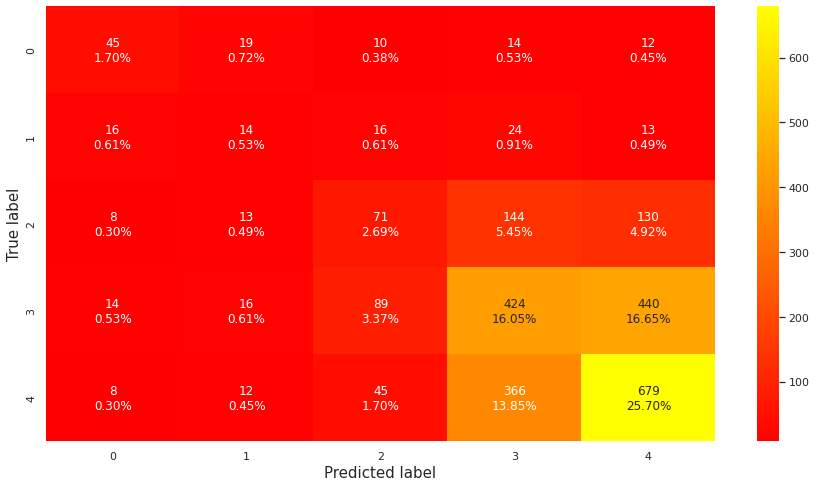

In [ ]:
clf=BaggingClassifier(base_estimator=LinearDiscriminantAnalysis(solver='lsqr'))
resultsClassification(clf,X_train_pos.values,y_train_pos.values,X_val_pos.values,y_val_pos.values)

Accuracy Score: 0.51761
F1 score: 0.48344
Recall: 0.51761
Precision: 0.47353
RMSE : 1.058908


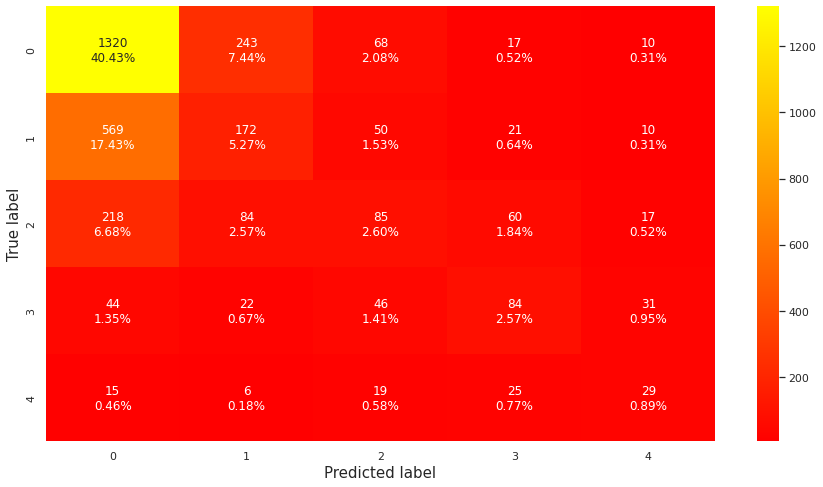

In [ ]:
clf=BaggingClassifier(base_estimator=LinearDiscriminantAnalysis(solver='lsqr'))
resultsClassification(clf,X_train_neg.values,y_train_neg.values,X_val_neg.values,y_val_neg.values)

### Final test on our validation set

We test two models on our validation set in order to see if we don't overfit. We train a Linear discriminant analysis because it's our best model and a Gradient Boosting Classifier because it has good results and can be a little bit explained.

Accuracy Score: 0.5061
F1 score: 0.49138
Recall: 0.5061
Precision: 0.48388
RMSE : 0.955583


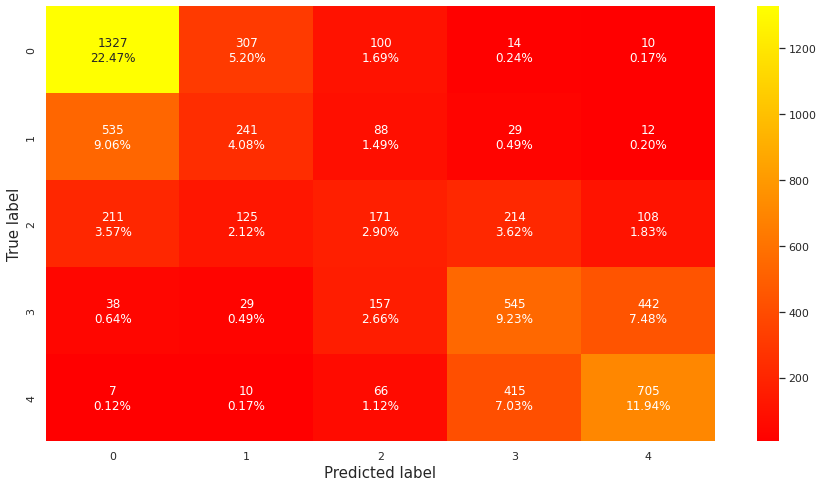

In [ ]:
clf=BaggingClassifier(base_estimator=LinearDiscriminantAnalysis(solver='lsqr'))
resultsClassification(clf,X_train.values,y_train.values,X_val.values,y_val.values)

Accuracy Score: 0.51778
F1 score: 0.46465
Recall: 0.51778
Precision: 0.4688
RMSE : 0.994397


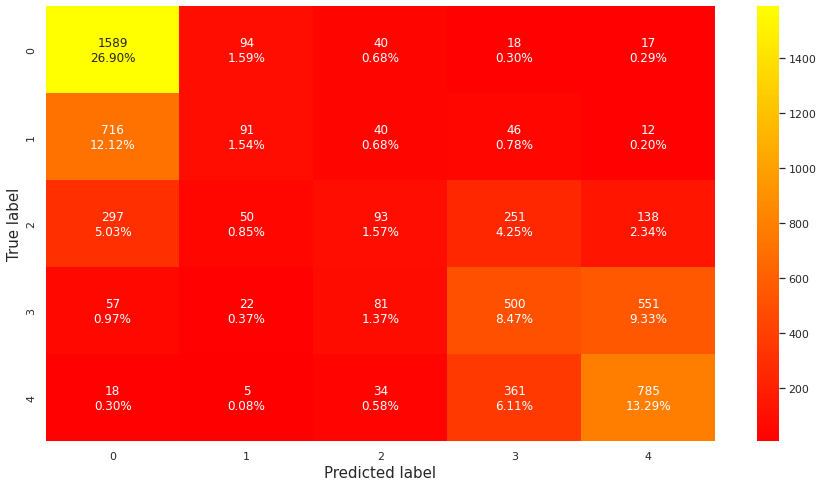

In [ ]:
lgb=LGBMClassifier(objective="multiclass",num_leaves=12,num_iterations=150)
resultsClassification(lgb,X_train.values,y_train.values,X_val.values,y_val.values)

### Model explanation

In [ ]:
explainer = shap.TreeExplainer(lgb)
shap_values = explainer.shap_values(X)

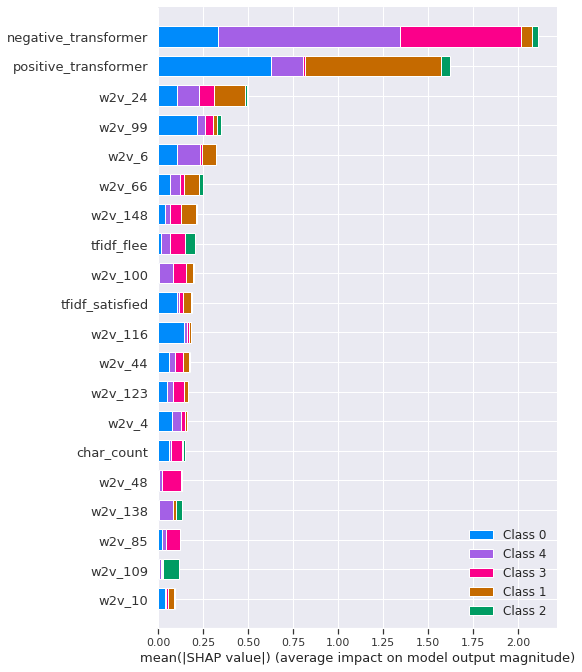

In [ ]:
shap.summary_plot(shap_values, X)

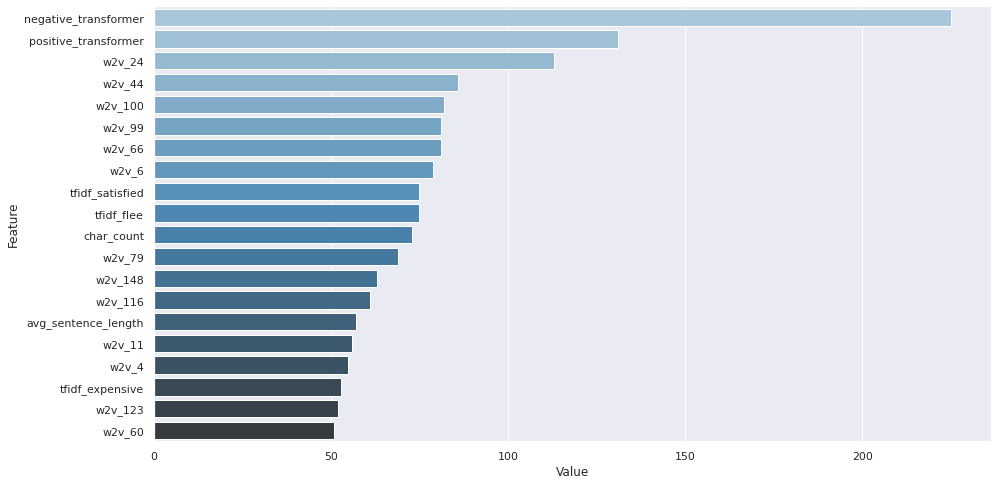

In [ ]:

feature_imp = pd.DataFrame(sorted(zip(lgb.feature_importances_,X.columns)), columns=['Value','Feature'])
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False)[:20],color="b",palette="Blues_d")

## Predict test data

In [ ]:
# check all shape
print(X.shape,y.shape,test_features.shape)

(23623, 581) (23623,) (10332, 581)


We will train our best model on our entire train set

In [ ]:
clf=BaggingClassifier(base_estimator=LinearDiscriminantAnalysis(solver='lsqr'))
clf.fit(X,y)
y_pred = clf.predict(test_features)

In [ ]:
y_pred

array([4, 5, 5, ..., 1, 2, 5])

In [ ]:
submissions_pandas=pd.DataFrame(test[["auteur","assureur","french_text","date_review"]])
submissions_pandas["note"]=y_pred
submissions_pandas

,auteur,assureur,french_text,date_review,note
0,lognos-d-139728,L'olivier Assurance,Satisfait des tarif et rapide j'attends de voi...,2021-11-16,4
1,paugam-l-139727,L'olivier Assurance,"Bon service, service réactif. Tout en ligne pr...",2021-11-16,5
2,rozgonyi-o-139704,L'olivier Assurance,L’assurance Olivier est une très bonne assuran...,2021-11-16,5
3,saad-hellal-h-139697,L'olivier Assurance,Je suis satisfait de l'olivier assurances pas ...,2021-11-16,5
4,damis-s-139693,L'olivier Assurance,le prix est attractif par rapport à ma situati...,2021-11-15,5
...,...,...,...,...,...
10327,mamybouly-129360,Sma,"Bonjour, j'ai une mauvaise expérience avec la ...",2021-08-24,1
10328,tarti-88637,Allianz,Entreprise très impactée par le covid- secteur...,2021-05-18,1
10329,victor-109599,Allianz,"Suite a un cambriolage le //, je suis toujours...",2021-04-08,1
10330,lkio-110907,Generali,"Bonjour, Je constate qu'entre le moment de ma...",2021-04-19,2


In [ ]:
submissions_pandas.to_csv("submission_test.csv")